Change the kernel to __newautoriftenv__.

In [30]:
import rasterio as rio
from rasterio.mask import mask
import cv2
import fiona
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
import os
import subprocess
import shutil
from scipy.interpolate import interp2d
import glob 

%load_ext jupyternotify

The jupyternotify extension is already loaded. To reload it, use:
  %reload_ext jupyternotify


In [31]:
basepath = '/Volumes/SGlacier/Turner20_21/02_21/out/'
# basepath = '/Users/jukesliu/Documents/TURNER/DATA/IMAGERY/Planet_test/Planet_test_all/'
os.listdir(basepath)

['20210202_203317_12_241c_3B_AnalyticMS_SR_clip_5m.tif',
 '20210213_203852_41_240a_3B_AnalyticMS_SR_clip_5m.tif',
 '20210211_203303_13_2424_3B_AnalyticMS_SR_clip_5m.tif',
 '20210213_200859_1035_3B_AnalyticMS_SR_clip_5m.tif',
 '20210203_205249_69_1064_3B_AnalyticMS_SR_clip_5m.tif',
 '20210202_194905_86_2235_3B_AnalyticMS_SR_clip_5m.tif',
 '20210215_201137_100c_3B_AnalyticMS_SR_clip_5m.tif',
 '20210212_203620_83_241c_3B_AnalyticMS_SR_clip_5m.tif',
 '20210201_201017_1034_3B_AnalyticMS_SR_clip_5m.tif',
 'stitched_by_sat',
 '20210209_205638_73_1058_3B_AnalyticMS_SR_clip_5m.tif',
 '20210215_190733_77_1063_3B_AnalyticMS_SR_clip_5m.tif',
 '20210226_201043_0f22_3B_AnalyticMS_SR_clip_5m.tif',
 '20210214_201535_1032_3B_AnalyticMS_SR_clip_5m.tif',
 '20210223_204007_67_2408_3B_AnalyticMS_SR_clip_5m.tif',
 '20210207_201658_101f_3B_AnalyticMS_SR_clip_5m.tif',
 '20210208_204447_82_225b_3B_AnalyticMS_SR_clip_5m.tif',
 '20210223_195153_37_2262_3B_AnalyticMS_SR_clip_5m.tif',
 '20210214_201529_1032_3B_Ana

# Coregister and stitch all Planet tiles for each image date

In [32]:
# grab unique dates
filelist = os.listdir(basepath); filelist.sort()
unique_dates = []; IDs = []; files = []
for file in filelist:
    if file.startswith('2') and file.endswith('tif'):
        date = file.split('_')[0] # grab the date
        sID = file.split('_')[-6] # grab the satellite ID (4 digit code)
        unique_dates.append(date); IDs.append(sID); files.append(file) # append to list
sorted_dates = list(set(list(zip(unique_dates, IDs)))) # set of the zipped date and ID
sorted_dates.sort() # sorted
print(sorted_dates)

[('20210201', '1034'), ('20210202', '1014'), ('20210202', '1060'), ('20210202', '2235'), ('20210202', '241c'), ('20210202', '2441'), ('20210203', '1064'), ('20210203', '2405'), ('20210203', '2408'), ('20210204', '1059'), ('20210204', '105c'), ('20210205', '1040'), ('20210205', '105c'), ('20210205', '105d'), ('20210205', '2412'), ('20210206', '1057'), ('20210206', '2402'), ('20210206', '240a'), ('20210207', '0e0f'), ('20210207', '101f'), ('20210207', '1066'), ('20210208', '105a'), ('20210208', '225b'), ('20210208', '2441'), ('20210209', '1058'), ('20210209', '240f'), ('20210210', '0f17'), ('20210210', '227a'), ('20210210', '2406'), ('20210211', '1003'), ('20210211', '101f'), ('20210211', '2307'), ('20210211', '2424'), ('20210212', '241c'), ('20210213', '1035'), ('20210213', '106a'), ('20210213', '240a'), ('20210214', '1026'), ('20210214', '1032'), ('20210214', '2426'), ('20210215', '100c'), ('20210215', '1063'), ('20210215', '2414'), ('20210215', '2441'), ('20210216', '1034'), ('2021021

In [33]:
# Grab the first Planet tile for reference CRS and Transform
reftile = rio.open(basepath+files[0])
print(reftile.crs)
print(reftile.transform)
print(reftile.shape)

EPSG:32607
| 4.98, 0.00, 546087.13|
| 0.00,-4.98, 6682892.30|
| 0.00, 0.00, 1.00|
(8315, 8357)


Grid of mask does not match images. Resampling.
Resampled to new dimensions: (8315, 8357)


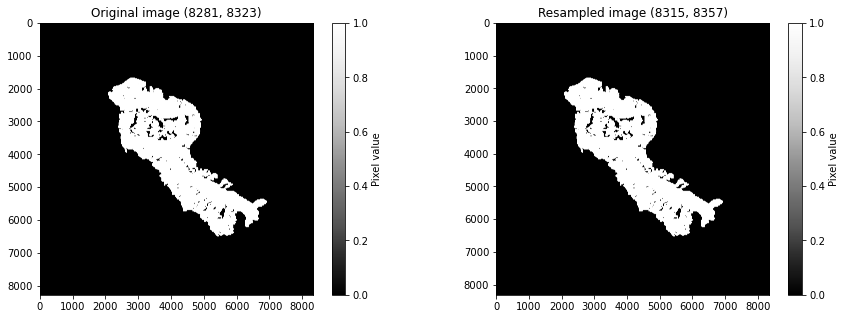

In [34]:
# Read in glacier mask (rasterized) - must be in the same projection as the plane images (UTM)
mask_path = '/Volumes/SGlacier/TG_autorift_inputs/TG_mask_5m.tif'
mask_reader = rio.open(mask_path); glacier_mask = mask_reader.read(1) # load the tile
glacier_mask[glacier_mask == 0] = np.NaN # remove black background, replace with Nans
glacier_mask[glacier_mask>0.0] = 1 ; glacier_mask[np.isnan(glacier_mask)] = 0 # make binary

if reftile.crs != mask_reader.crs: # Check that projections match
    print('ERROR: CRS of mask does not match images.')

# put both on same grid if they aren't already
if mask_reader.transform[0] != reftile.transform[0] or mask_reader.shape != reftile.shape:
    print('Grid of mask does not match images. Resampling.')
    
    # grab grids
    ref_x = np.linspace(reftile.bounds.left, reftile.bounds.right, num=np.shape(reftile)[1])
    ref_y = np.linspace(reftile.bounds.top, reftile.bounds.bottom, num=np.shape(reftile)[0])
    mask_x = np.linspace(mask_reader.bounds.left, mask_reader.bounds.right, num=np.shape(glacier_mask)[1])
    mask_y = np.linspace(mask_reader.bounds.top, mask_reader.bounds.bottom, num=np.shape(glacier_mask)[0])
    mask_resamp = np.zeros((len(ref_y), len(ref_x))) # create an empty resampled img grid

    # Resample to your new DEM bounds
    f = interp2d(mask_x, mask_y, glacier_mask) # create DEM interpolation object
    mask_resamp = f(ref_x,ref_y) # resample the NIR data to the DSM coordinates
    mask_resamp = np.flipud(mask_resamp) # flip up down
    print("Resampled to new dimensions:", mask_resamp.shape)

    # Display the original and resampled images as a visual check
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=(15,5))
    im1 = ax1.imshow(glacier_mask, cmap='Greys_r', vmin=0)
    ax1.set_title('Original image '+str(mask_reader.shape))
    fig.colorbar(im1, ax=ax1,label='Pixel value')
    im2 = ax2.imshow(mask_resamp, cmap='Greys_r', vmin=0)
    ax2.set_title('Resampled image '+str(mask_resamp.shape))
    fig.colorbar(im2, ax=ax2,label='Pixel value')
    plt.show()

TILES FOR 20210201 1034
['/Volumes/SGlacier/Turner20_21/02_21/out/20210201_201017_1034_3B_AnalyticMS_SR_clip_5m.tif']


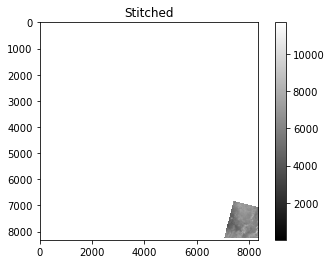

TILES FOR 20210202 1014
['/Volumes/SGlacier/Turner20_21/02_21/out/20210202_201923_1014_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_201924_1014_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_201925_1014_3B_AnalyticMS_SR_clip_5m.tif']


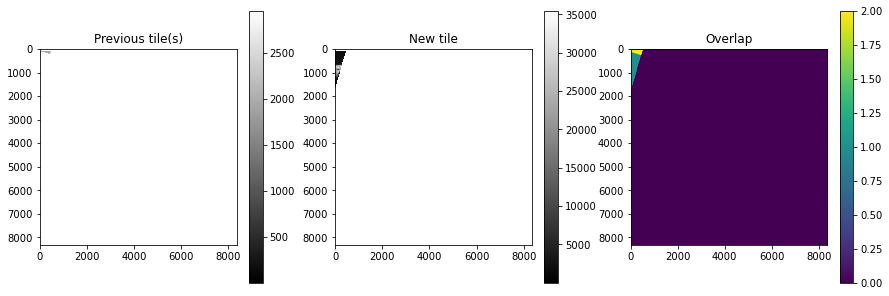

Previous tile is larger.
Mean difference in overlapping values: -5.174118375768431
Using overall mean diff: -5.174118375768431
Larger tile mean value: 2019.4644759124276
Normalized mean value for smaller tile: 7059.654491259748




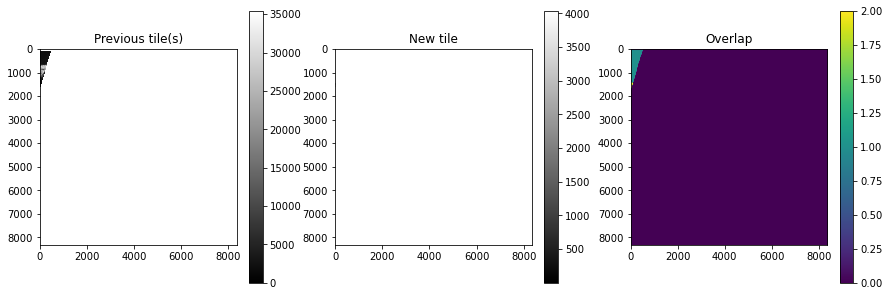

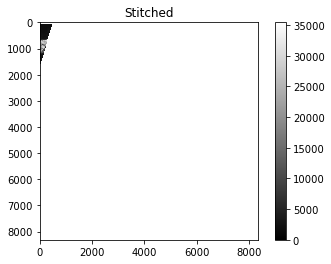

TILES FOR 20210202 1060
['/Volumes/SGlacier/Turner20_21/02_21/out/20210202_205252_72_1060_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_205254_72_1060_3B_AnalyticMS_SR_clip_5m.tif']


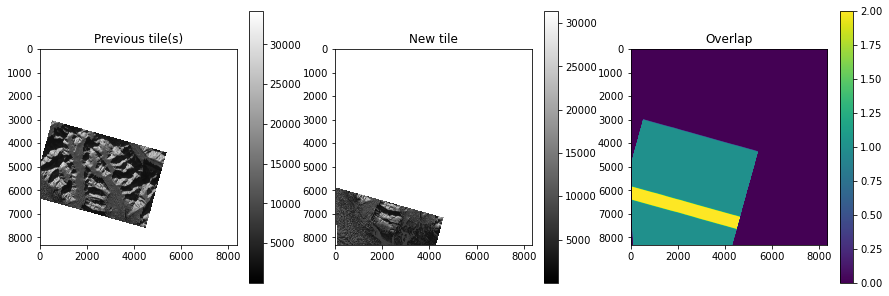

Previous tile is larger.
Mean difference in overlapping values: 27.128003354007713
Using overall mean diff: 27.128003354007713
Larger tile mean value: 9472.842137327701
Normalized mean value for smaller tile: 4612.024493665327




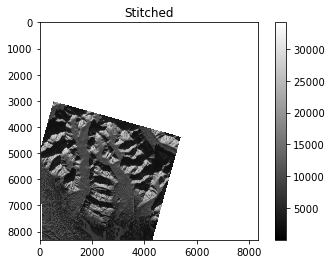

TILES FOR 20210202 2235
['/Volumes/SGlacier/Turner20_21/02_21/out/20210202_194903_65_2235_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_194905_86_2235_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_194908_07_2235_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_194910_28_2235_3B_AnalyticMS_SR_clip_5m.tif']


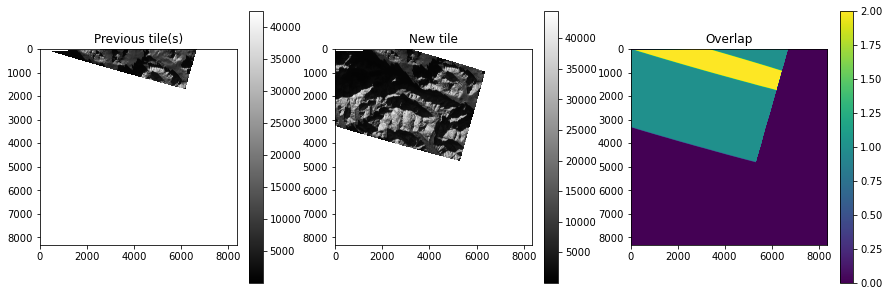

Previous tile is larger.
Mean difference in overlapping values: 0.193644495446967
Using overall mean diff: 0.193644495446967
Larger tile mean value: 8274.285499935968
Normalized mean value for smaller tile: 7790.735199570471




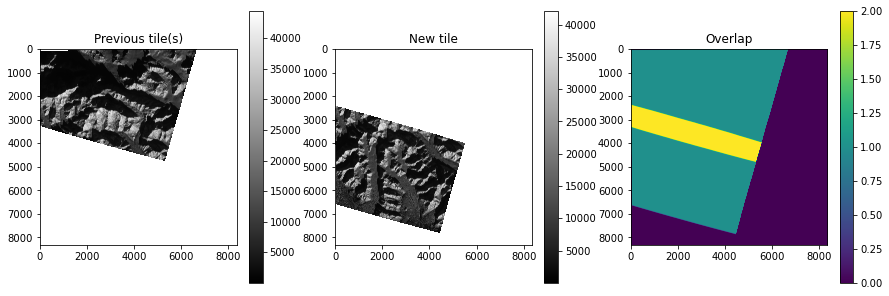

Previous tile is larger.
Mean difference in overlapping values: 13.86994645124639
Using glacier mean diff: 3.2380496046034684
Larger tile mean value: 9288.394909032777
Normalized mean value for smaller tile: 6943.9024458778695




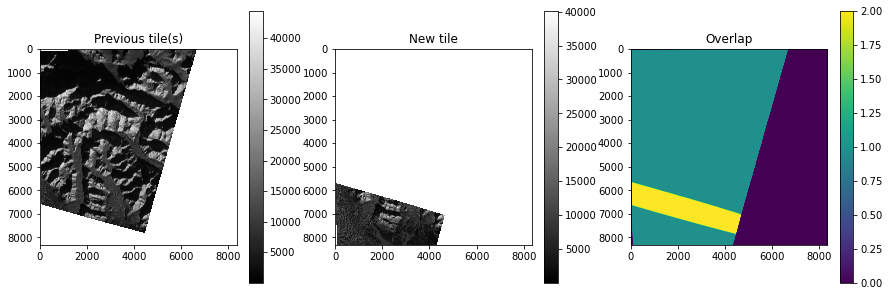

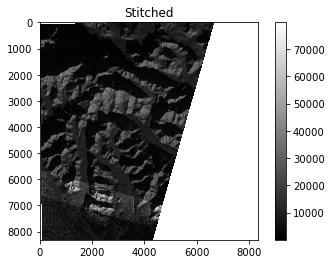

TILES FOR 20210202 241c
['/Volumes/SGlacier/Turner20_21/02_21/out/20210202_203317_12_241c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_203319_47_241c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_203321_82_241c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_203324_17_241c_3B_AnalyticMS_SR_clip_5m.tif']


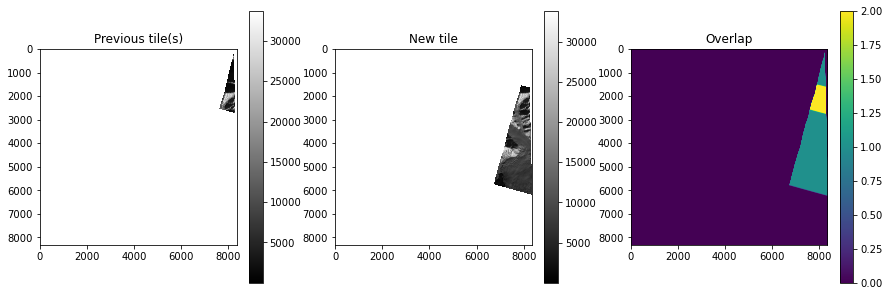

Previous tile is larger.
Mean difference in overlapping values: 115.74004377862339
Using overall mean diff: 115.74004377862339
Larger tile mean value: 7925.252091714004
Normalized mean value for smaller tile: 8089.588820149884




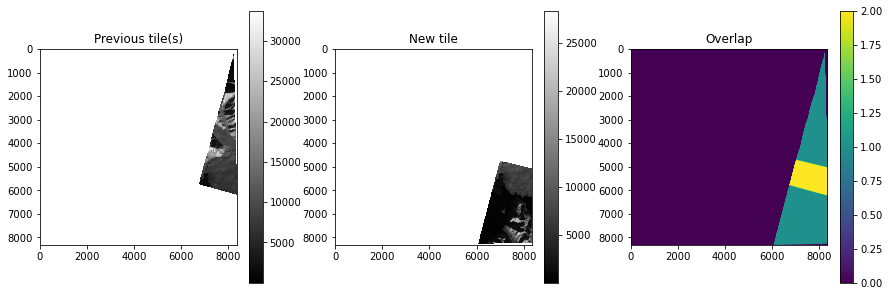

Current tile is larger.
Mean difference in overlapping values: -115.44309779289803
Using glacier mean diff: -0.9318736584609926
Larger tile mean value: 3866.3465601075463
Normalized mean value for smaller tile: 6723.109774510853




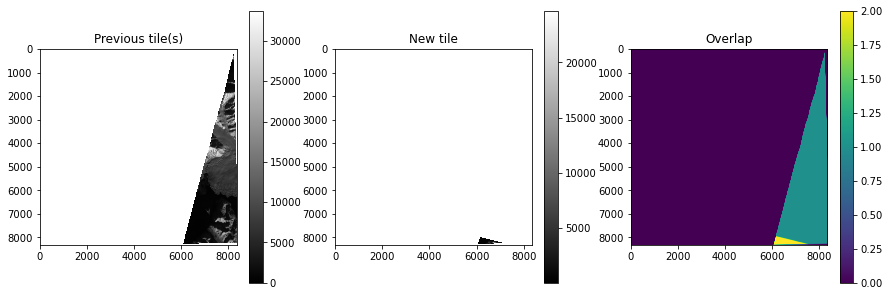

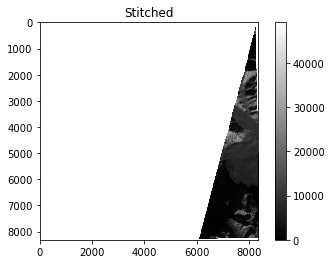

TILES FOR 20210202 2441
['/Volumes/SGlacier/Turner20_21/02_21/out/20210202_195343_78_2441_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_195346_05_2441_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210202_195348_33_2441_3B_AnalyticMS_SR_clip_5m.tif']


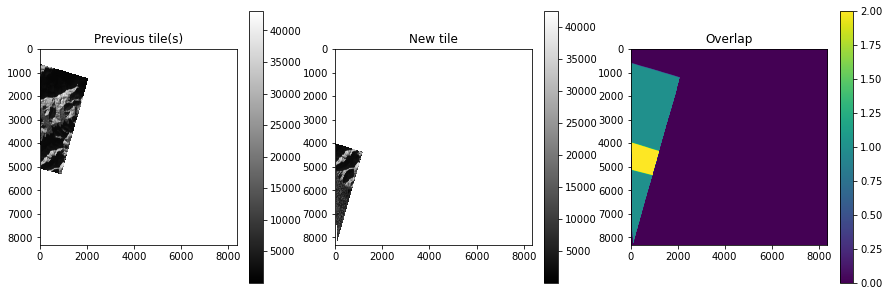

Previous tile is larger.
Mean difference in overlapping values: 32.760514057003974
Using overall mean diff: 32.760514057003974
Larger tile mean value: 8796.59107541539
Normalized mean value for smaller tile: 4972.291435719276




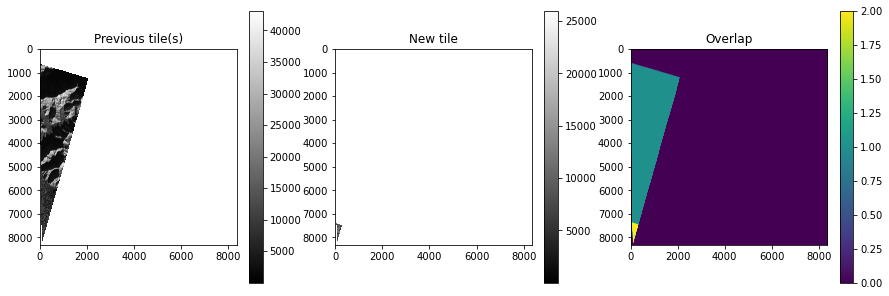

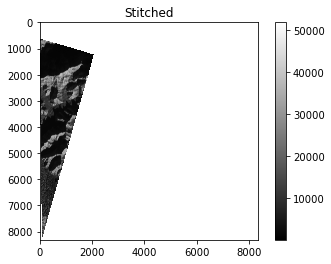

TILES FOR 20210203 1064
['/Volumes/SGlacier/Turner20_21/02_21/out/20210203_205247_69_1064_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210203_205249_69_1064_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210203_205251_69_1064_3B_AnalyticMS_SR_clip_5m.tif']


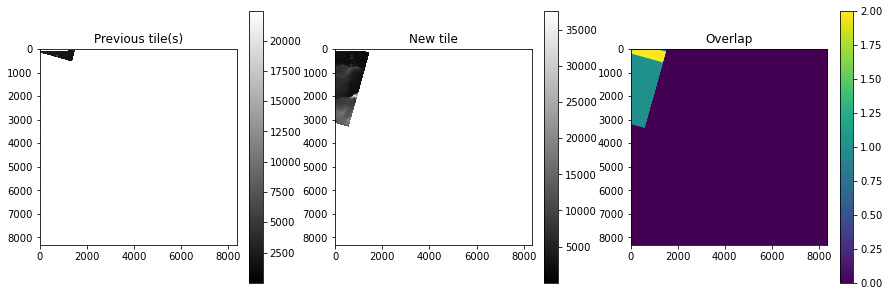

Previous tile is larger.
Mean difference in overlapping values: -1.2517900369291397
Using overall mean diff: -1.2517900369291397
Larger tile mean value: 2295.5876389600253
Normalized mean value for smaller tile: 6248.729990512959




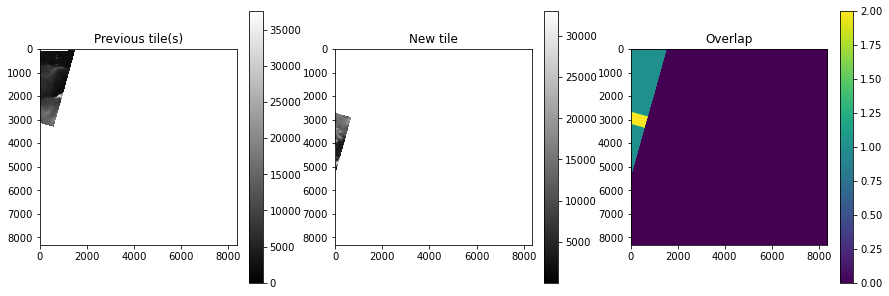

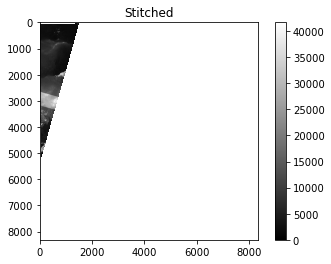

TILES FOR 20210203 2405
['/Volumes/SGlacier/Turner20_21/02_21/out/20210203_203314_98_2405_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210203_203317_28_2405_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210203_203319_57_2405_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210203_203321_87_2405_3B_AnalyticMS_SR_clip_5m.tif']


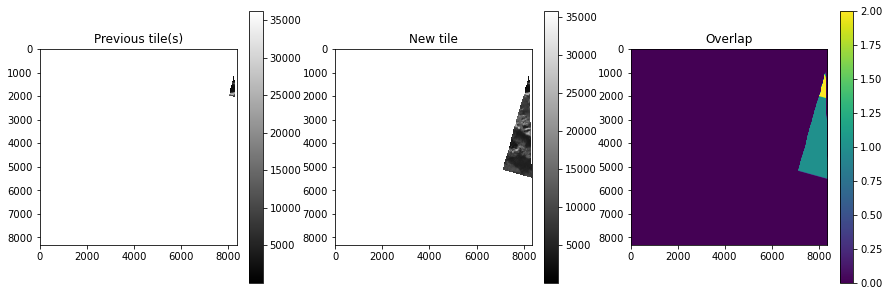

Previous tile is larger.
Mean difference in overlapping values: 23.76766144465784
Using overall mean diff: 23.76766144465784
Larger tile mean value: 7037.8113548342035
Normalized mean value for smaller tile: 7943.447321080015




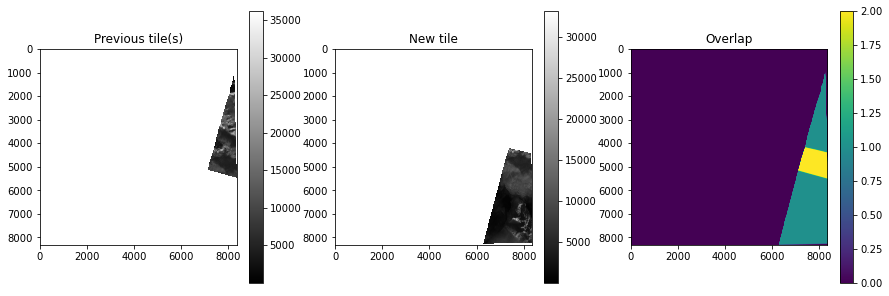

Current tile is larger.
Mean difference in overlapping values: -31.882955722018245
Using overall mean diff: -31.882955722018245
Larger tile mean value: 5110.143462138086
Normalized mean value for smaller tile: 5096.347036251605




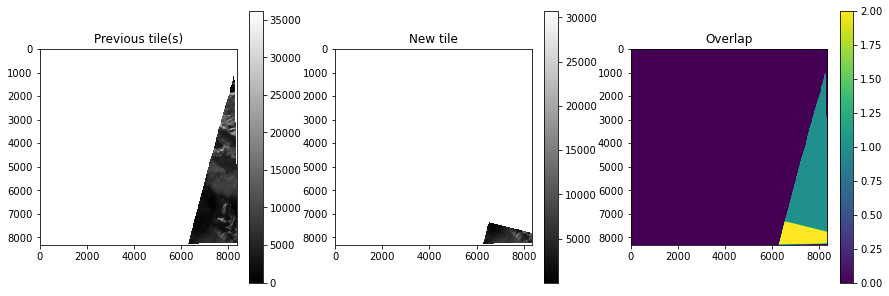

Previous tile is larger.
Mean difference in overlapping values: -12.296352102874174
Using overall mean diff: -12.296352102874174
Larger tile mean value: 5898.942337950423
Normalized mean value for smaller tile: 8.442382772807465




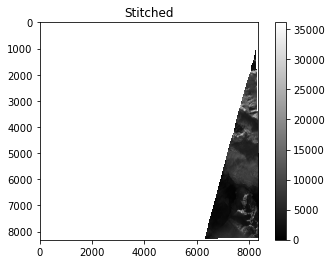

TILES FOR 20210203 2408
['/Volumes/SGlacier/Turner20_21/02_21/out/20210203_204027_66_2408_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210203_204029_95_2408_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210203_204034_51_2408_3B_AnalyticMS_SR_clip_5m.tif']


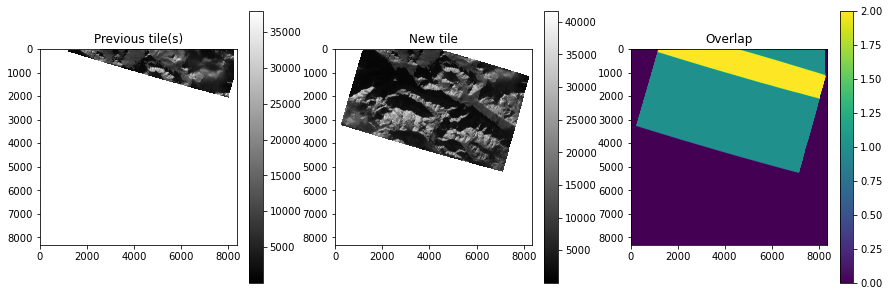

Previous tile is larger.
Mean difference in overlapping values: 20.80010856638771
Using overall mean diff: 20.80010856638771
Larger tile mean value: 8037.073988792946
Normalized mean value for smaller tile: 7376.334366122123




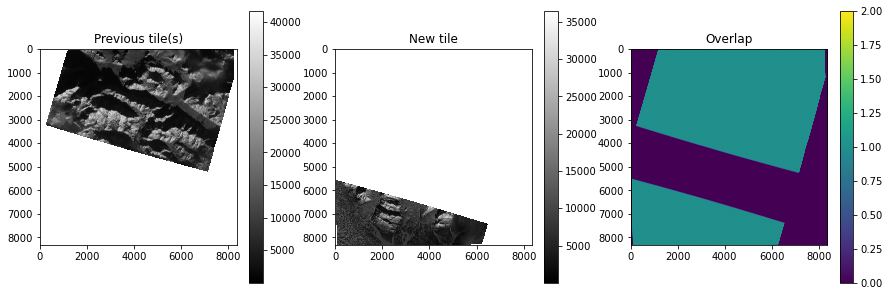

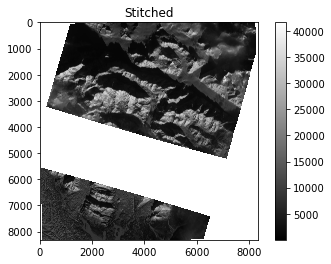

TILES FOR 20210204 1059
['/Volumes/SGlacier/Turner20_21/02_21/out/20210204_205320_74_1059_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210204_205322_74_1059_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210204_205324_74_1059_3B_AnalyticMS_SR_clip_5m.tif']


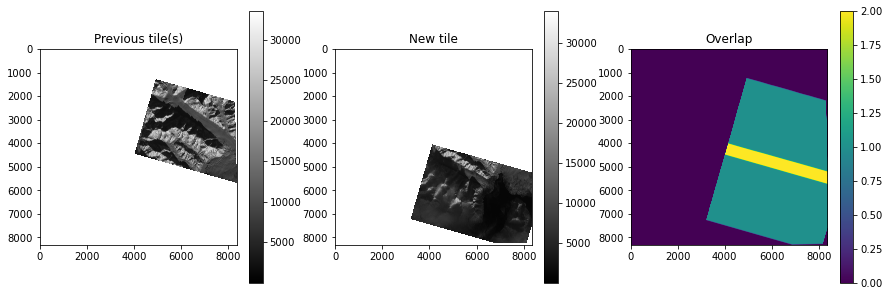

Previous tile is larger.
Mean difference in overlapping values: 70.17853995880762
Using glacier mean diff: 13.162936358899609
Larger tile mean value: 10275.922803095797
Normalized mean value for smaller tile: 3979.6410947836457




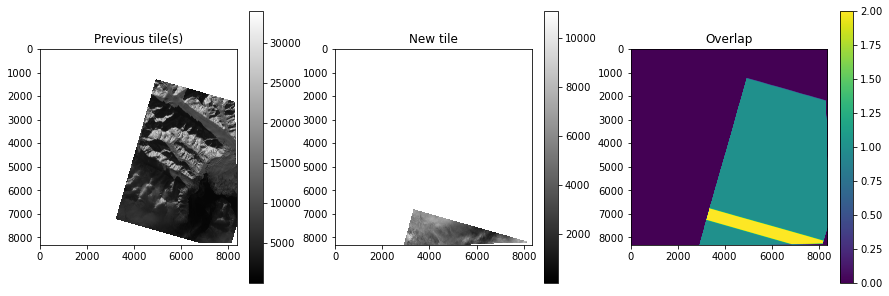

Previous tile is larger.
Mean difference in overlapping values: 25.617705708813205
Using overall mean diff: 25.617705708813205
Larger tile mean value: 7428.011684418911
Normalized mean value for smaller tile: 2159.7735710727225




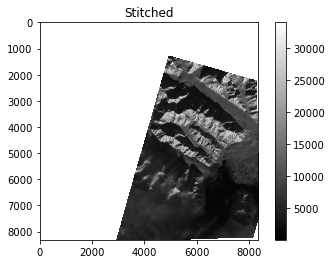

TILES FOR 20210204 105c
['/Volumes/SGlacier/Turner20_21/02_21/out/20210204_202047_09_105c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210204_202048_96_105c_3B_AnalyticMS_SR_clip_5m.tif']


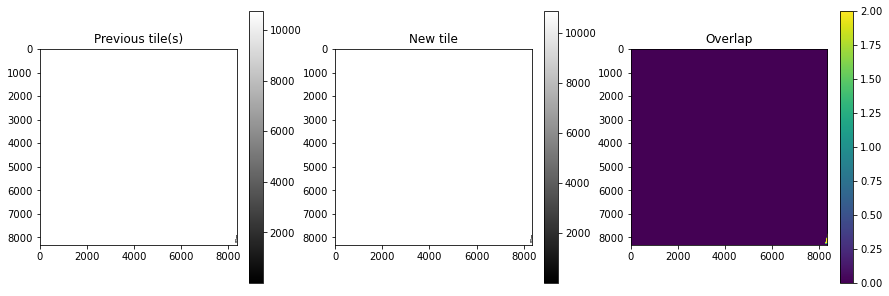

Previous tile is larger.
Mean difference in overlapping values: -70.60946409732382
Using overall mean diff: -70.60946409732382
Larger tile mean value: 5112.096085599334
Normalized mean value for smaller tile: 15.750459034071074




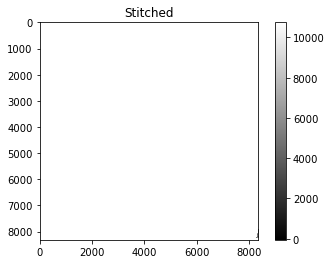

TILES FOR 20210205 1040
['/Volumes/SGlacier/Turner20_21/02_21/out/20210205_200952_1040_3B_AnalyticMS_SR_clip_5m.tif']


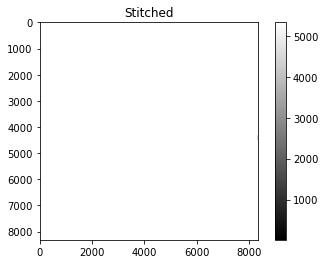

TILES FOR 20210205 105c
['/Volumes/SGlacier/Turner20_21/02_21/out/20210205_202611_80_105c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210205_202613_67_105c_3B_AnalyticMS_SR_clip_5m.tif']


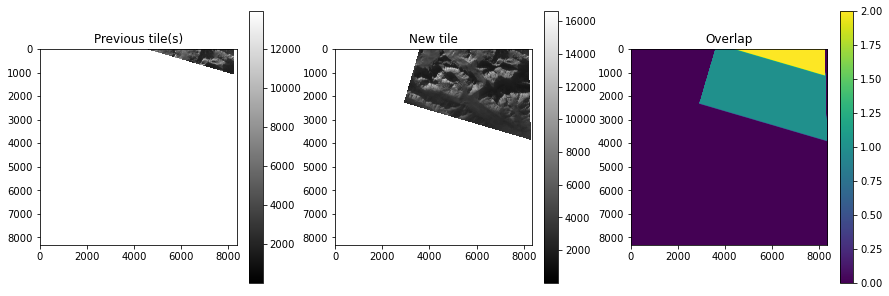

Previous tile is larger.
Mean difference in overlapping values: 6.477760011337443
Using overall mean diff: 6.477760011337443
Larger tile mean value: 3904.89586368111
Normalized mean value for smaller tile: 3359.7045784269208




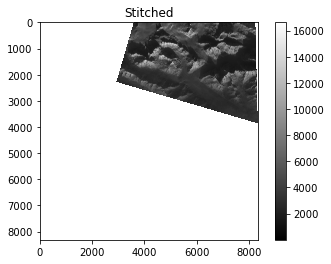

TILES FOR 20210205 105d
['/Volumes/SGlacier/Turner20_21/02_21/out/20210205_205517_71_105d_3B_AnalyticMS_SR_clip_5m.tif']


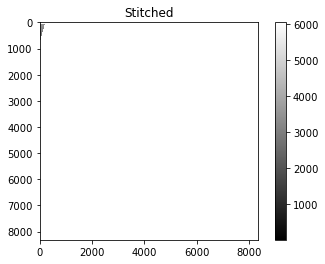

TILES FOR 20210205 2412
['/Volumes/SGlacier/Turner20_21/02_21/out/20210205_204021_91_2412_3B_AnalyticMS_SR_clip_5m.tif']


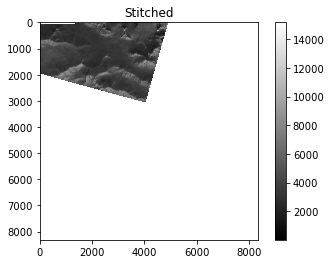

TILES FOR 20210206 1057
['/Volumes/SGlacier/Turner20_21/02_21/out/20210206_205452_75_1057_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210206_205454_75_1057_3B_AnalyticMS_SR_clip_5m.tif']


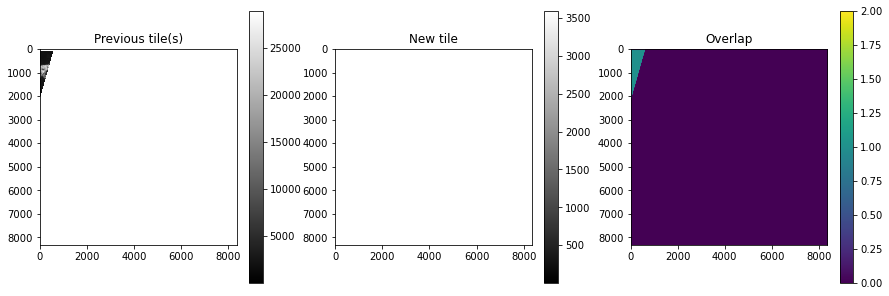

Previous tile is larger.
Mean difference in overlapping values: -114.58778204401813
Using overall mean diff: -114.58778204401813
Larger tile mean value: 6260.796581996514
Normalized mean value for smaller tile: 549.9551200911802




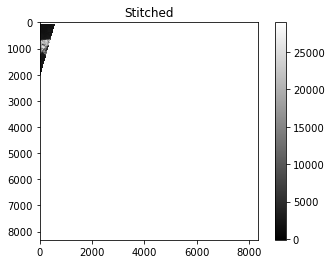

TILES FOR 20210206 2402
['/Volumes/SGlacier/Turner20_21/02_21/out/20210206_203658_36_2402_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210206_203700_64_2402_3B_AnalyticMS_SR_clip_5m.tif']


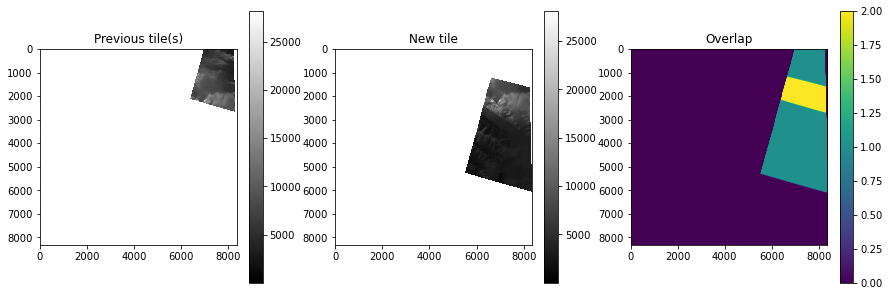

Previous tile is larger.
Mean difference in overlapping values: 14.191144700814531
Using overall mean diff: 14.191144700814531
Larger tile mean value: 8053.430216166381
Normalized mean value for smaller tile: 2983.907302053725




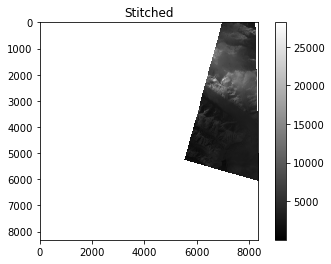

TILES FOR 20210206 240a
['/Volumes/SGlacier/Turner20_21/02_21/out/20210206_204135_32_240a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210206_204137_67_240a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210206_204140_02_240a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210206_204142_37_240a_3B_AnalyticMS_SR_clip_5m.tif']


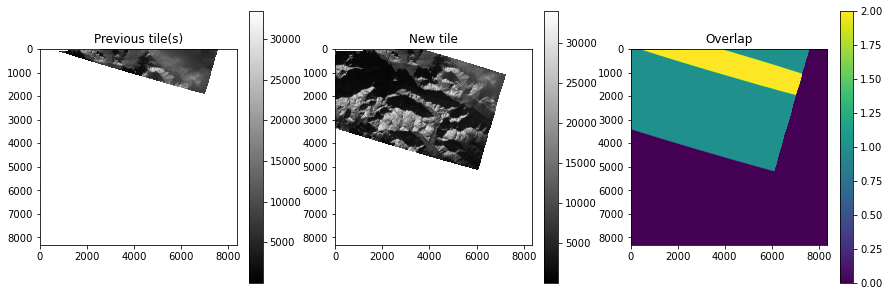

Previous tile is larger.
Mean difference in overlapping values: 14.055805239710425
Using overall mean diff: 14.055805239710425
Larger tile mean value: 9146.000637596047
Normalized mean value for smaller tile: 6458.758732324784




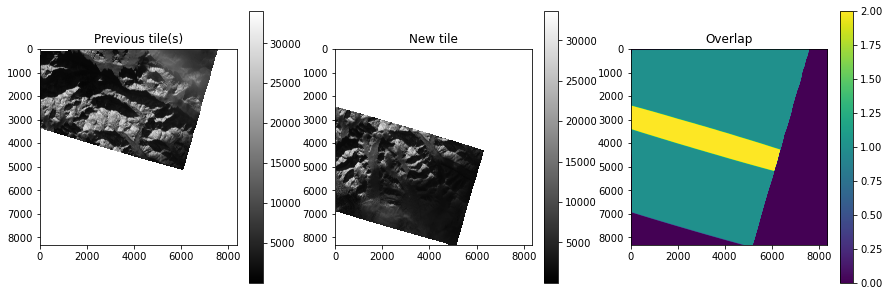

Previous tile is larger.
Mean difference in overlapping values: 31.324947938154004
Using glacier mean diff: 10.294423336339426
Larger tile mean value: 8245.092592812438
Normalized mean value for smaller tile: 3608.983029376367




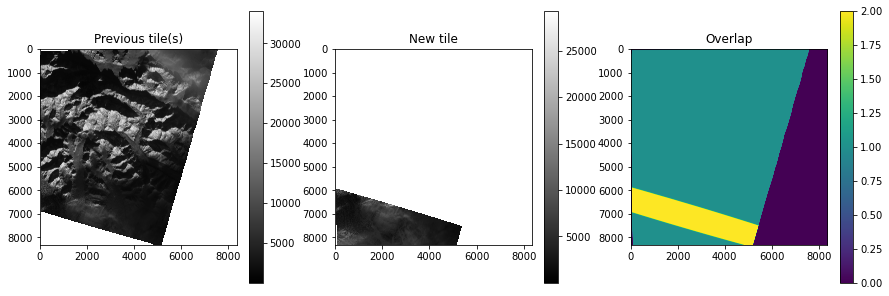

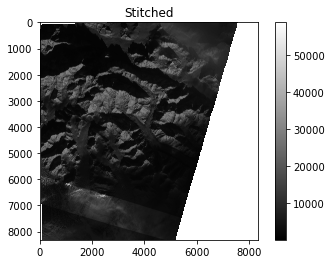

TILES FOR 20210207 0e0f
['/Volumes/SGlacier/Turner20_21/02_21/out/20210207_195308_0e0f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_195309_0e0f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_195310_0e0f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_195313_0e0f_3B_AnalyticMS_SR_clip_5m.tif']


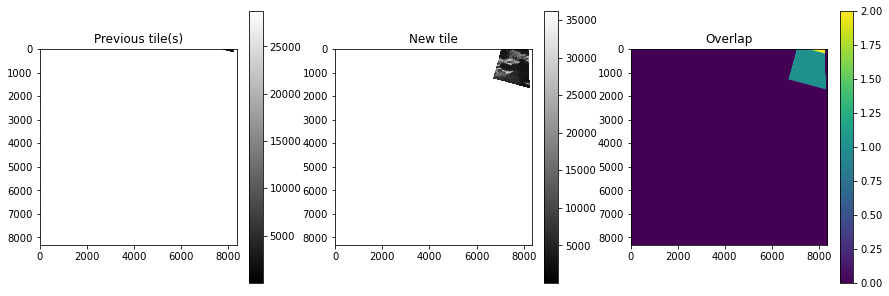

Previous tile is larger.
Mean difference in overlapping values: -17.009872469798367
Using overall mean diff: -17.009872469798367
Larger tile mean value: 3821.7786208283787
Normalized mean value for smaller tile: 7848.378035802782




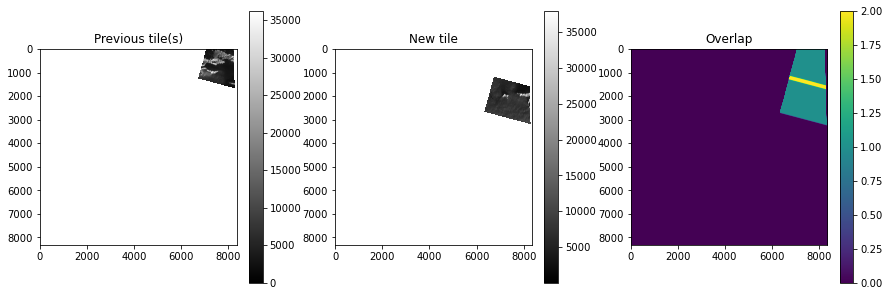

Current tile is larger.
Mean difference in overlapping values: 9.005957228733699
Using overall mean diff: 9.005957228733699
Larger tile mean value: 7673.759278199016
Normalized mean value for smaller tile: 7332.525380646626




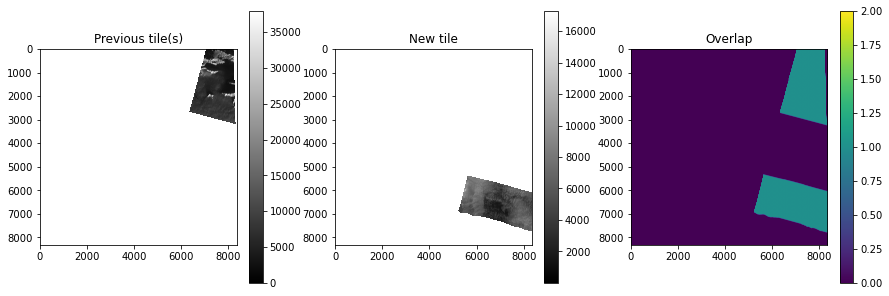

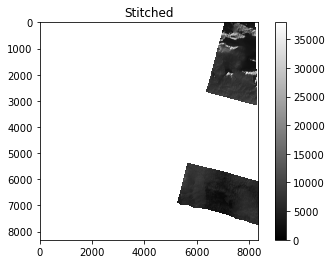

TILES FOR 20210207 101f
['/Volumes/SGlacier/Turner20_21/02_21/out/20210207_201657_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_201658_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_201659_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_201700_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_201701_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_201703_101f_3B_AnalyticMS_SR_clip_5m.tif']


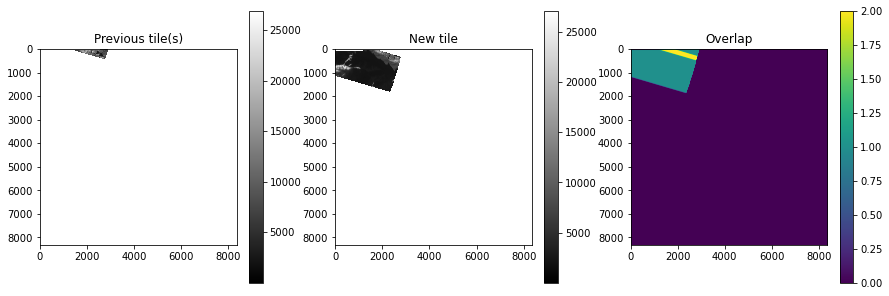

Previous tile is larger.
Mean difference in overlapping values: 1.3138735307044687
Using overall mean diff: 1.3138735307044687
Larger tile mean value: 9498.865245671055
Normalized mean value for smaller tile: 3519.824005476553




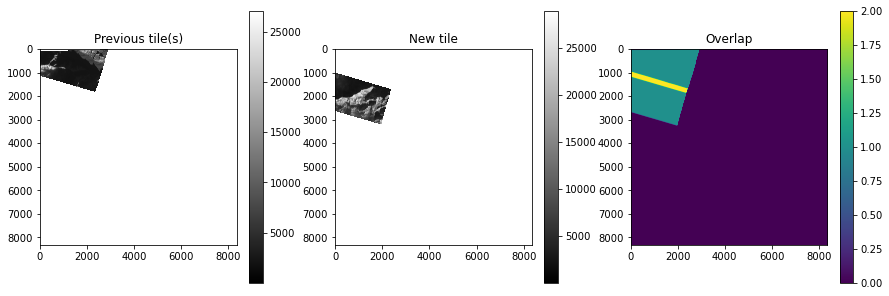

Previous tile is larger.
Mean difference in overlapping values: -0.19545679778006395
Using overall mean diff: -0.19545679778006395
Larger tile mean value: 4374.649173300608
Normalized mean value for smaller tile: 7361.454796318964




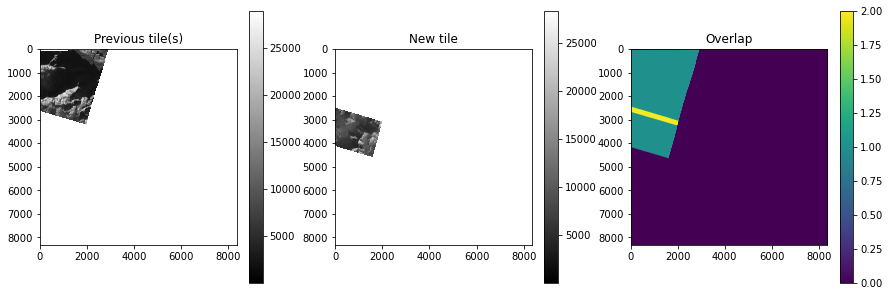

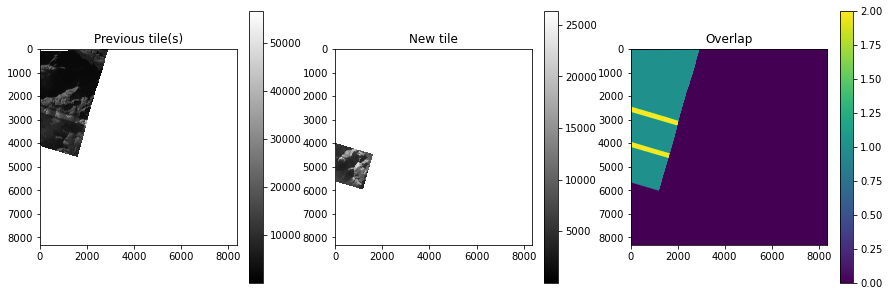

Previous tile is larger.
Mean difference in overlapping values: 3.7986418335747887
Using overall mean diff: 3.7986418335747887
Larger tile mean value: 7282.390715258456
Normalized mean value for smaller tile: 6407.055500855168




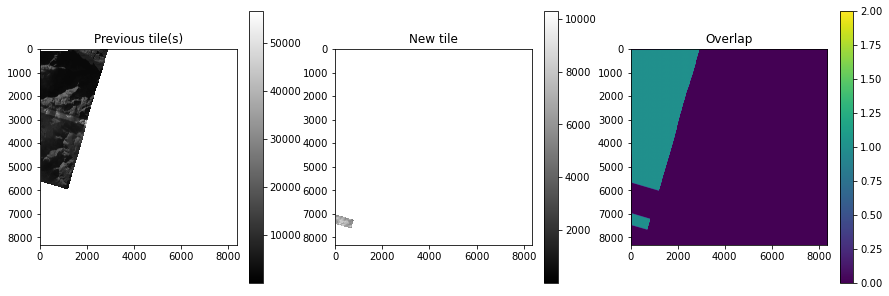

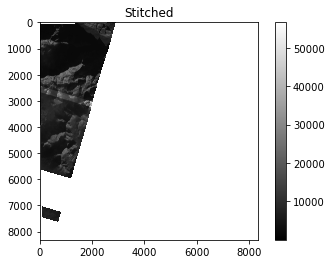

TILES FOR 20210207 1066
['/Volumes/SGlacier/Turner20_21/02_21/out/20210207_205504_72_1066_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_205506_72_1066_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_205508_72_1066_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_205510_72_1066_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210207_205512_72_1066_3B_AnalyticMS_SR_clip_5m.tif']


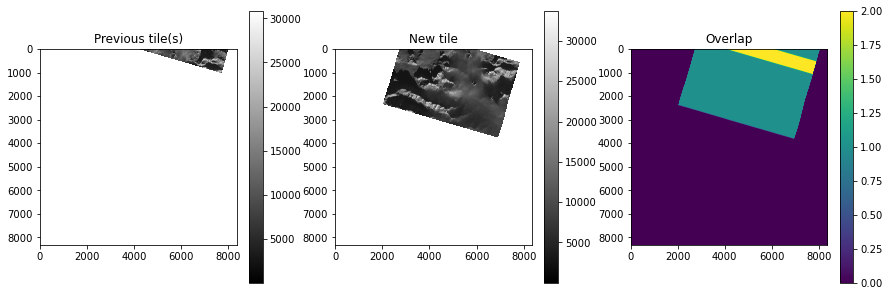

Previous tile is larger.
Mean difference in overlapping values: 49.612520969191465
Using overall mean diff: 49.612520969191465
Larger tile mean value: 9767.20375949542
Normalized mean value for smaller tile: 7610.706758753942




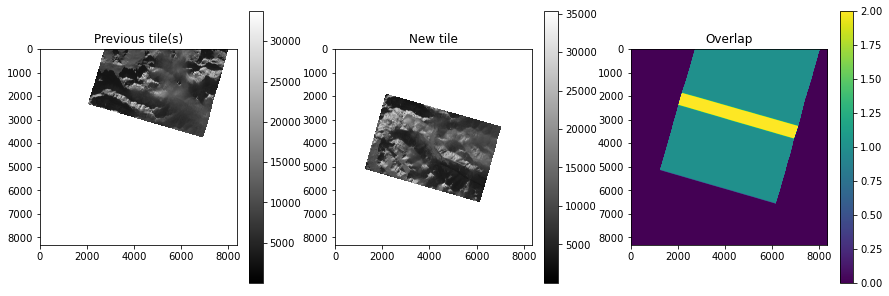

Current tile is larger.
Mean difference in overlapping values: -130.76048419351005
Using glacier mean diff: -66.73410923103432
Larger tile mean value: 10198.899524116974
Normalized mean value for smaller tile: 7272.47767788262




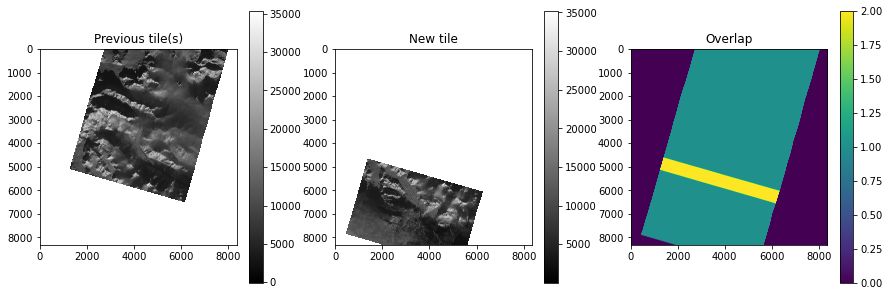

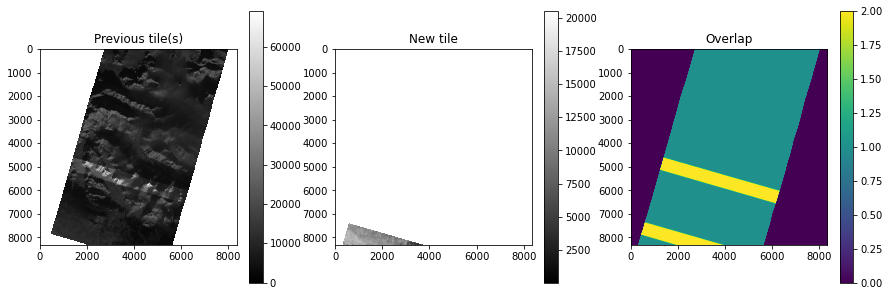

Previous tile is larger.
Mean difference in overlapping values: 17.815109200638414
Using overall mean diff: 17.815109200638414
Larger tile mean value: 9947.898742860685
Normalized mean value for smaller tile: 2807.6003146812695




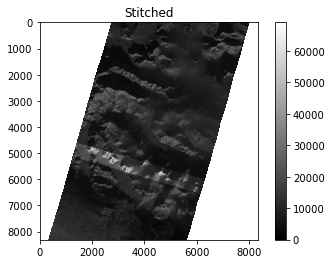

TILES FOR 20210208 105a
['/Volumes/SGlacier/Turner20_21/02_21/out/20210208_205701_17_105a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_205703_18_105a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_205705_20_105a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_205707_21_105a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_205709_22_105a_3B_AnalyticMS_SR_clip_5m.tif']


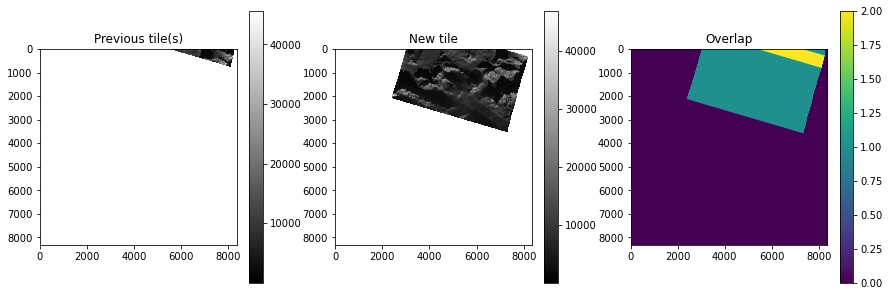

Previous tile is larger.
Mean difference in overlapping values: 71.12432268436332
Using overall mean diff: 71.12432268436332
Larger tile mean value: 9164.854834244456
Normalized mean value for smaller tile: 6927.14573183896




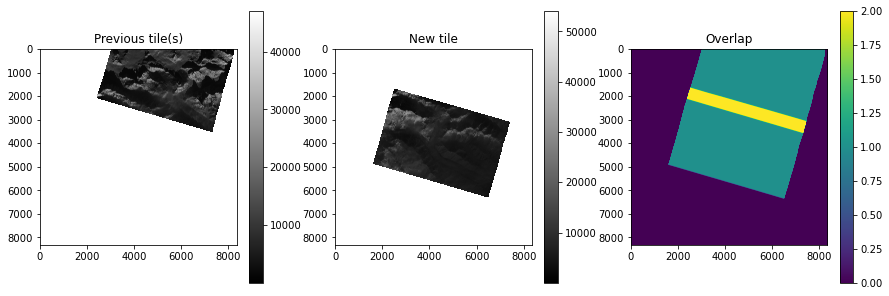

Current tile is larger.
Mean difference in overlapping values: -118.3108307253832
Using glacier mean diff: -36.50698451822433
Larger tile mean value: 7175.574858711324
Normalized mean value for smaller tile: 6366.20388558805




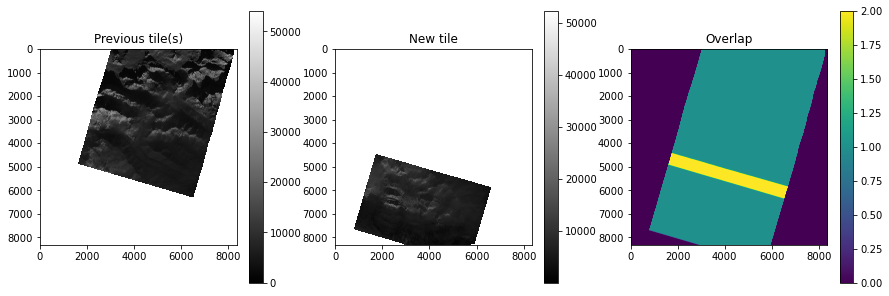

Previous tile is larger.
Mean difference in overlapping values: 17.819148248127348
Using glacier mean diff: 5.6344506875051135
Larger tile mean value: 7414.61133340988
Normalized mean value for smaller tile: 5122.49434352032




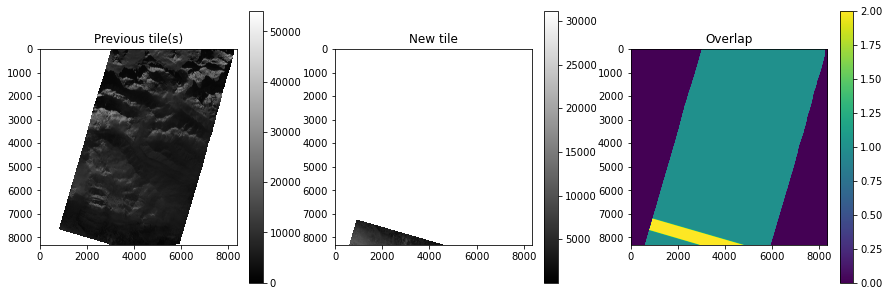

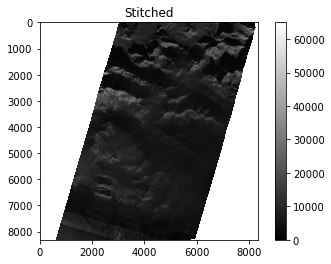

TILES FOR 20210208 225b
['/Volumes/SGlacier/Turner20_21/02_21/out/20210208_204447_82_225b_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_204450_19_225b_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_204452_55_225b_3B_AnalyticMS_SR_clip_5m.tif']


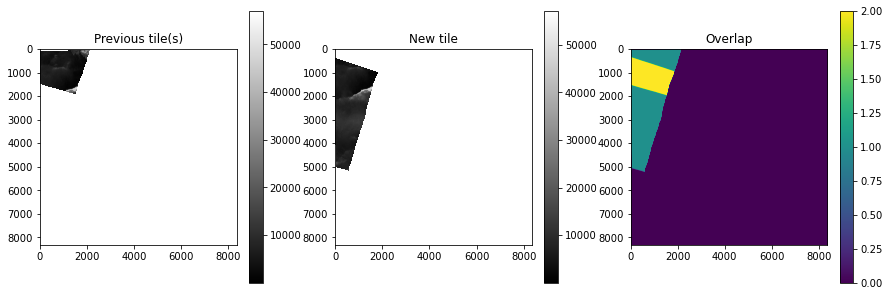

Previous tile is larger.
Mean difference in overlapping values: 11.387532771155682
Using overall mean diff: 11.387532771155682
Larger tile mean value: 6246.853603427407
Normalized mean value for smaller tile: 5743.139758556863




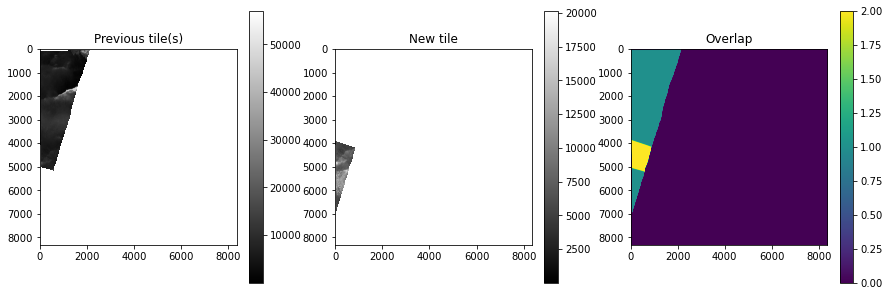

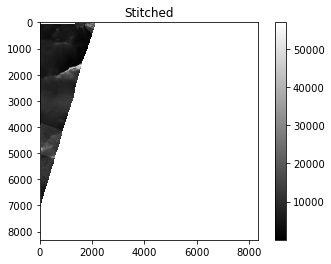

TILES FOR 20210208 2441
['/Volumes/SGlacier/Turner20_21/02_21/out/20210208_200042_65_2441_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_200044_92_2441_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_200047_19_2441_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210208_200049_46_2441_3B_AnalyticMS_SR_clip_5m.tif']


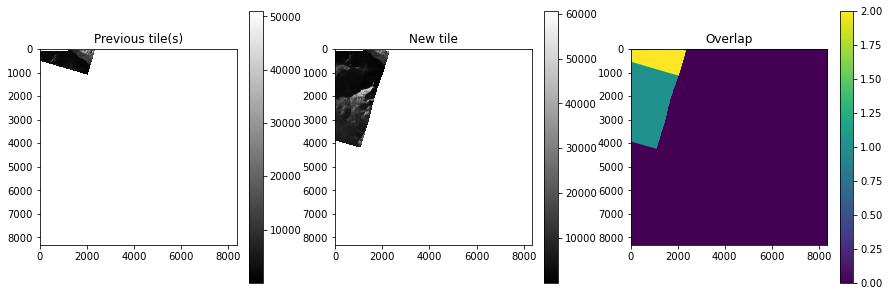

Previous tile is larger.
Mean difference in overlapping values: 11.329111818351576
Using overall mean diff: 11.329111818351576
Larger tile mean value: 5060.664237055074
Normalized mean value for smaller tile: 6390.443639045255




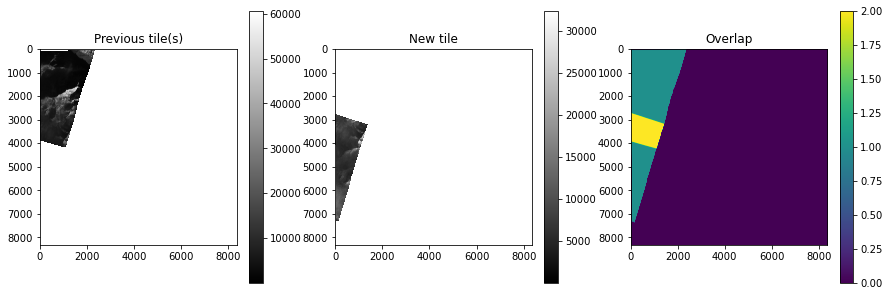

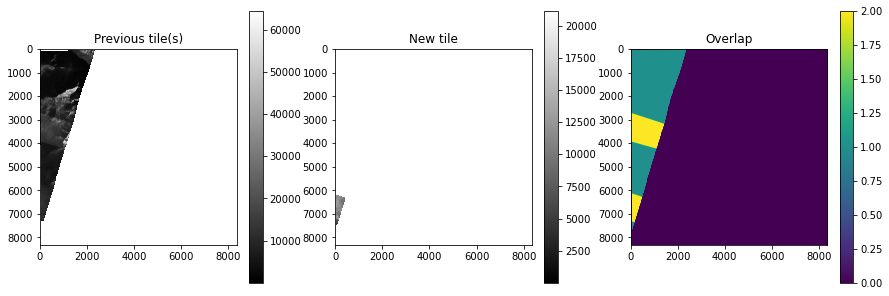

Previous tile is larger.
Mean difference in overlapping values: -7.822108021624773
Using overall mean diff: -7.822108021624773
Larger tile mean value: 8949.921633978316
Normalized mean value for smaller tile: 259.4586434499075




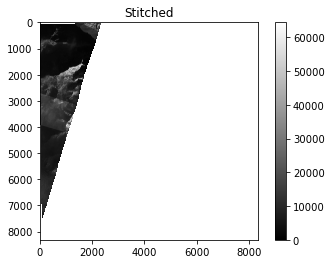

TILES FOR 20210209 1058
['/Volumes/SGlacier/Turner20_21/02_21/out/20210209_205636_73_1058_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210209_205638_73_1058_3B_AnalyticMS_SR_clip_5m.tif']


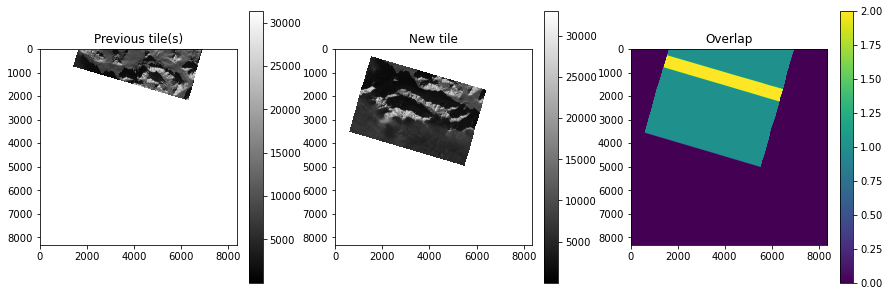

Previous tile is larger.
Mean difference in overlapping values: 65.28737518984691
Using overall mean diff: 65.28737518984691
Larger tile mean value: 8782.244896679253
Normalized mean value for smaller tile: 5578.22735050642




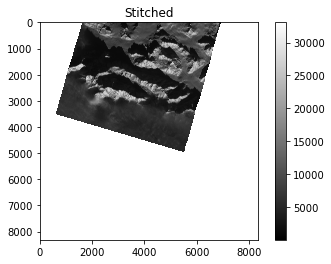

TILES FOR 20210209 240f
['/Volumes/SGlacier/Turner20_21/02_21/out/20210209_203314_95_240f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210209_203317_31_240f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210209_203319_66_240f_3B_AnalyticMS_SR_clip_5m.tif']


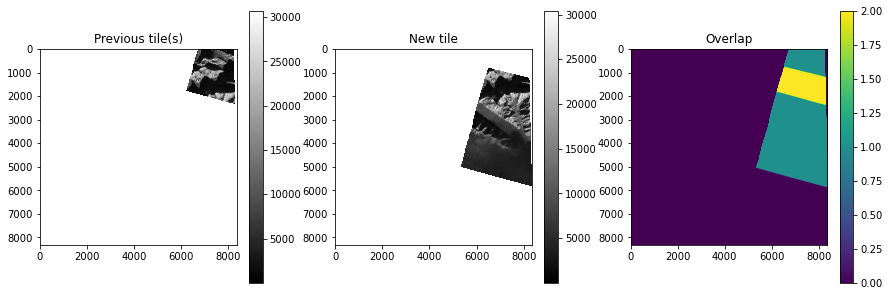

Previous tile is larger.
Mean difference in overlapping values: 23.665414028100646
Using overall mean diff: 23.665414028100646
Larger tile mean value: 7317.4597282220875
Normalized mean value for smaller tile: 5113.408499063318




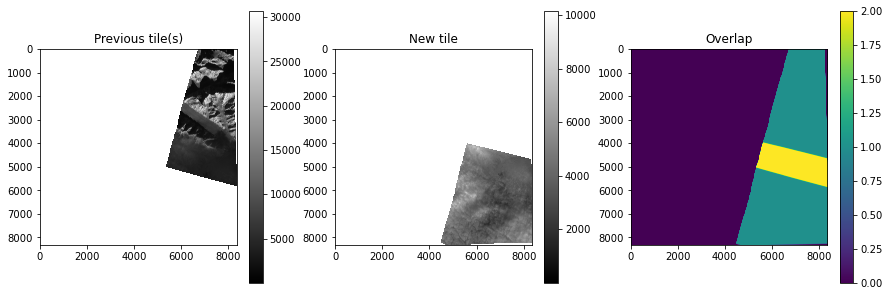

Current tile is larger.
Mean difference in overlapping values: -26.026482080324755
Using glacier mean diff: -0.4801581036520236
Larger tile mean value: 4103.2854690148015
Normalized mean value for smaller tile: 5527.343694342775




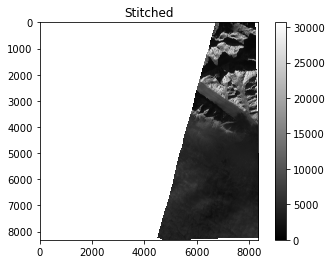

TILES FOR 20210210 0f17
['/Volumes/SGlacier/Turner20_21/02_21/out/20210210_201716_0f17_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_201717_0f17_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_201718_0f17_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_201719_0f17_3B_AnalyticMS_SR_clip_5m.tif']


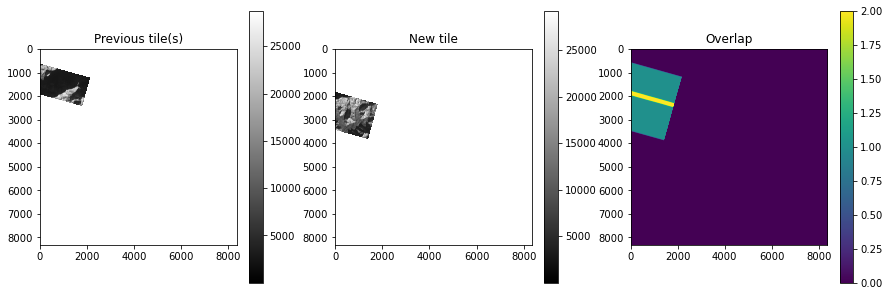

Previous tile is larger.
Mean difference in overlapping values: -4.526607776367731
Using overall mean diff: -4.526607776367731
Larger tile mean value: 6705.885123464119
Normalized mean value for smaller tile: 9892.374691632815




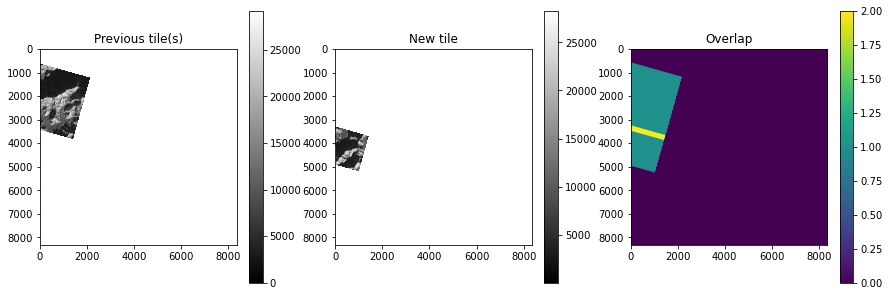

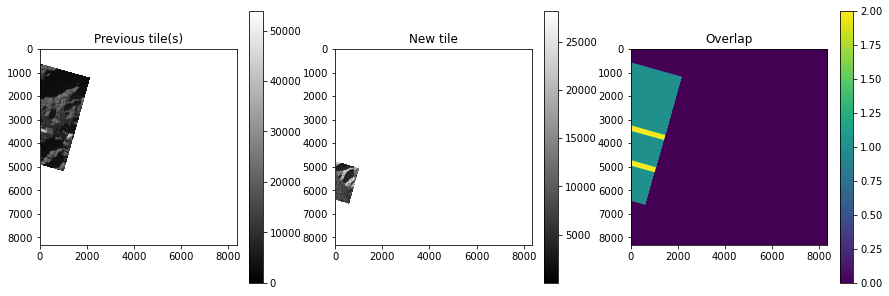

Previous tile is larger.
Mean difference in overlapping values: 17.1501520153433
Using overall mean diff: 17.1501520153433
Larger tile mean value: 9267.49377447145
Normalized mean value for smaller tile: 7536.546250736108




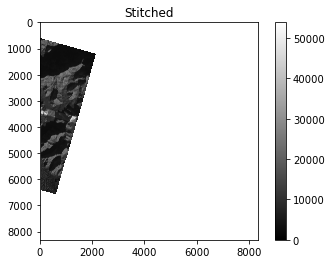

TILES FOR 20210210 227a
['/Volumes/SGlacier/Turner20_21/02_21/out/20210210_203812_44_227a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_203814_82_227a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_203817_19_227a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_203819_56_227a_3B_AnalyticMS_SR_clip_5m.tif']


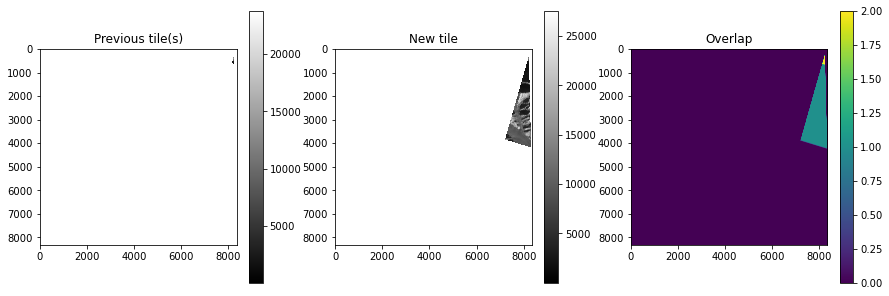

Previous tile is larger.
Mean difference in overlapping values: 54.066449882781676
Using overall mean diff: 54.066449882781676
Larger tile mean value: 6712.747232759664
Normalized mean value for smaller tile: 9067.155801441124




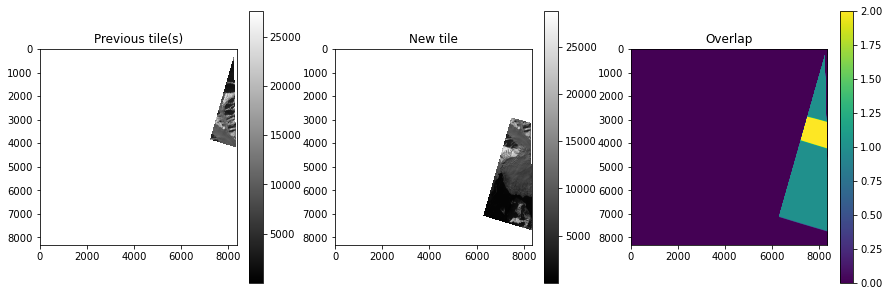

Current tile is larger.
Mean difference in overlapping values: -74.68284552204202
Using overall mean diff: -74.68284552204202
Larger tile mean value: 6299.124386066093
Normalized mean value for smaller tile: 4027.510168417641




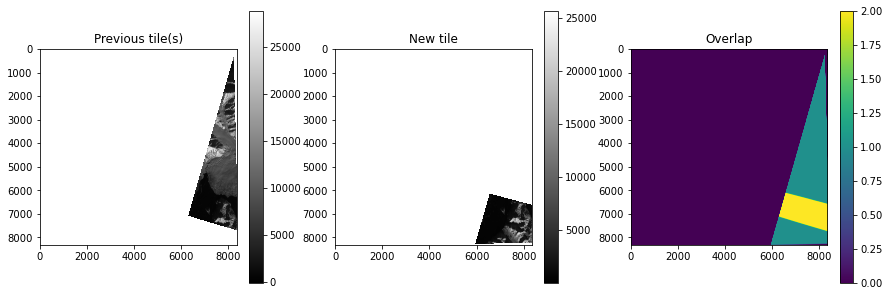

Previous tile is larger.
Mean difference in overlapping values: 1.8135218413034224
Using overall mean diff: 1.8135218413034224
Larger tile mean value: 6515.997835779097
Normalized mean value for smaller tile: 1726.5320121395016




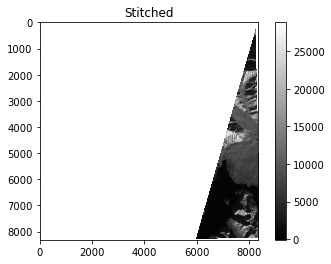

TILES FOR 20210210 2406
['/Volumes/SGlacier/Turner20_21/02_21/out/20210210_204256_18_2406_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_204258_46_2406_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_204300_75_2406_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210210_204303_04_2406_3B_AnalyticMS_SR_clip_5m.tif']


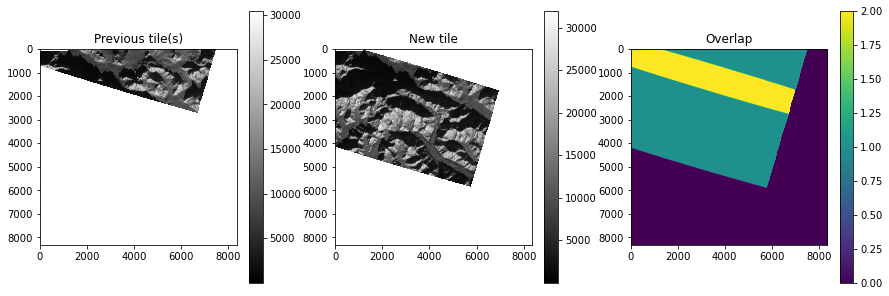

Previous tile is larger.
Mean difference in overlapping values: 17.707281879062716
Using overall mean diff: 17.707281879062716
Larger tile mean value: 7815.747768475755
Normalized mean value for smaller tile: 7012.274191111038




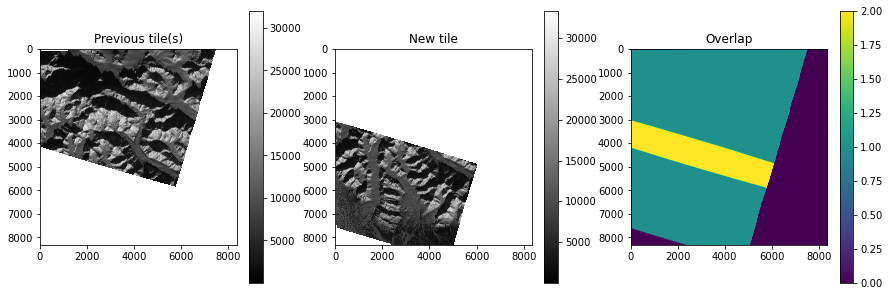

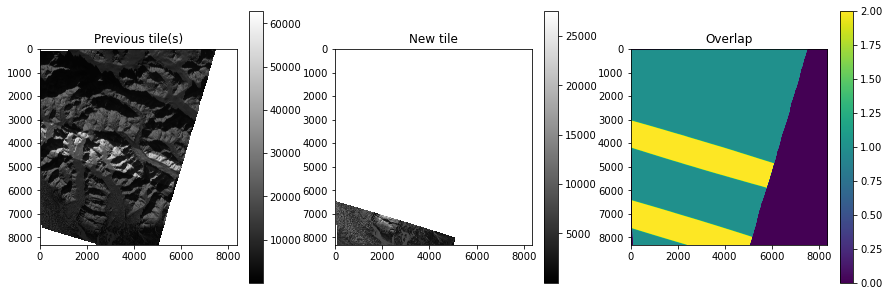

Previous tile is larger.
Mean difference in overlapping values: 4.272884901327001
Using overall mean diff: 4.272884901327001
Larger tile mean value: 10028.35780377448
Normalized mean value for smaller tile: 889.4708143037666




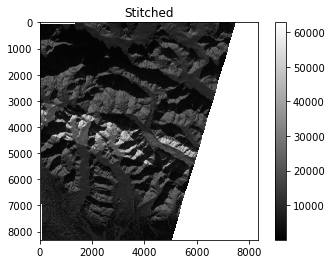

TILES FOR 20210211 1003
['/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201511_1003_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201512_1003_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201513_1003_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201514_1003_3B_AnalyticMS_SR_clip_5m.tif']


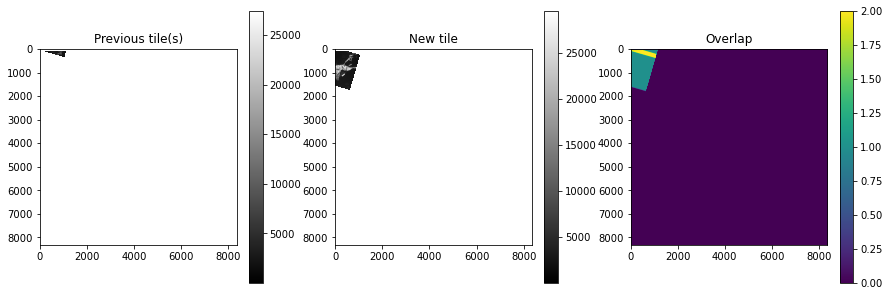

Previous tile is larger.
Mean difference in overlapping values: -5.051118986039485
Using overall mean diff: -5.051118986039485
Larger tile mean value: 3696.38924868084
Normalized mean value for smaller tile: 5449.281205670936




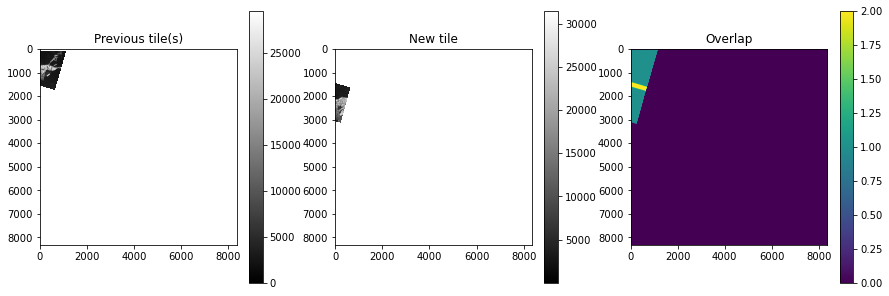

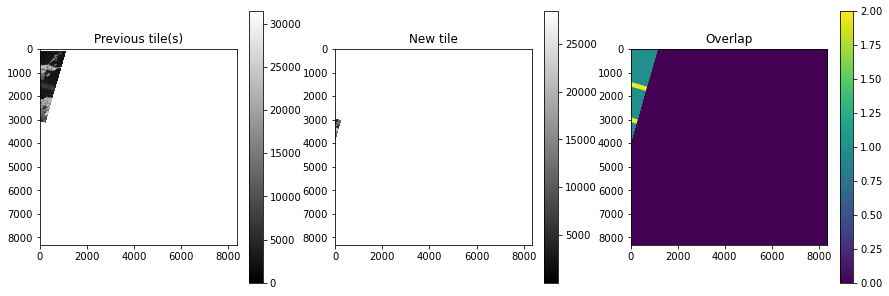

Previous tile is larger.
Mean difference in overlapping values: 19.71887708688677
Using overall mean diff: 19.71887708688677
Larger tile mean value: 7750.728657674841
Normalized mean value for smaller tile: 7991.985811994018




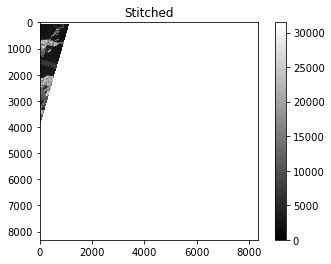

TILES FOR 20210211 101f
['/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201215_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201216_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201217_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201218_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201219_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201220_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201221_101f_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_201222_101f_3B_AnalyticMS_SR_clip_5m.tif']


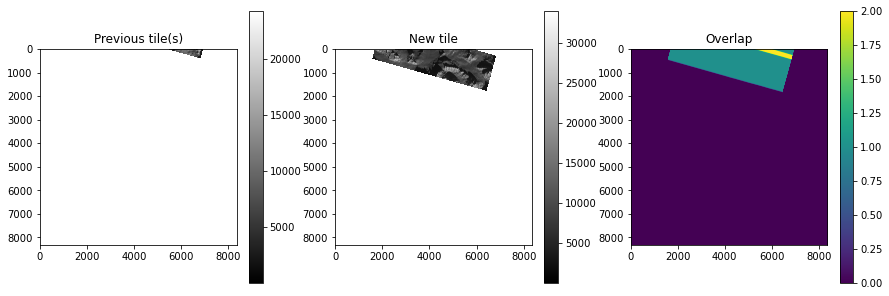

Previous tile is larger.
Mean difference in overlapping values: 1.7380227023769799
Using overall mean diff: 1.7380227023769799
Larger tile mean value: 8128.131219949307
Normalized mean value for smaller tile: 8312.556095885155




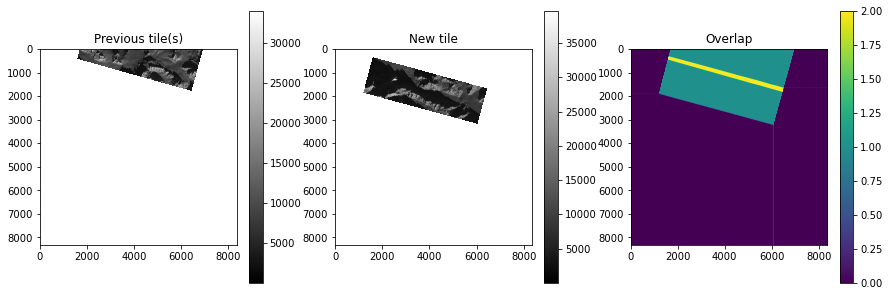

Current tile is larger.
Mean difference in overlapping values: -3.086197954686592
Using overall mean diff: -3.086197954686592
Larger tile mean value: 7353.3583541157695
Normalized mean value for smaller tile: 7412.30660099949




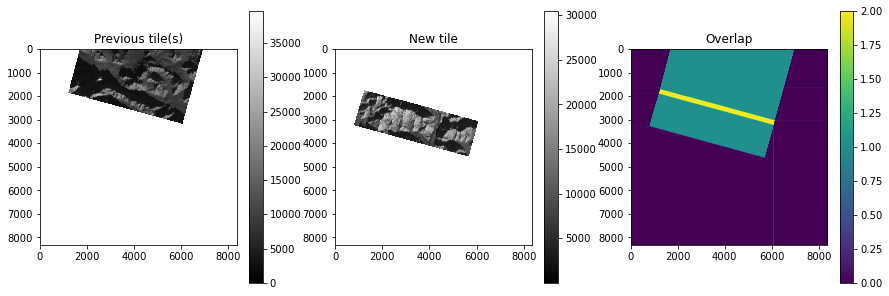

Previous tile is larger.
Mean difference in overlapping values: 5.064397177321811
Using glacier mean diff: 3.6646761533259813
Larger tile mean value: 7865.4486309783
Normalized mean value for smaller tile: 8882.550300257513




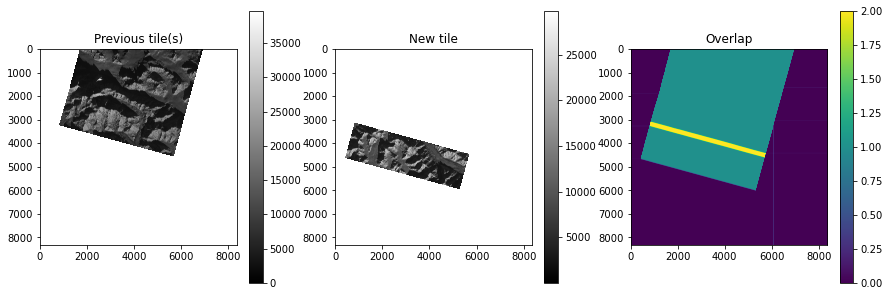

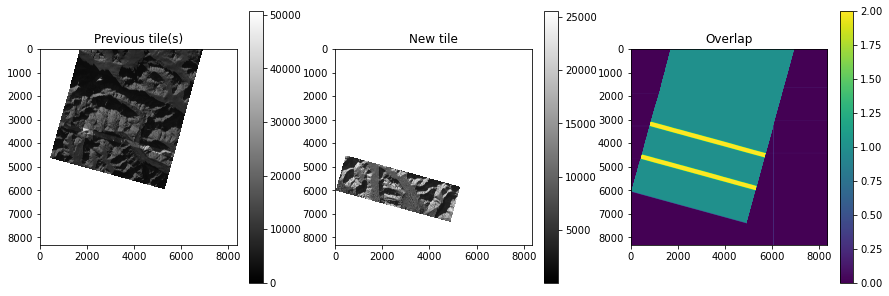

Previous tile is larger.
Mean difference in overlapping values: 0.1689169900066487
Using glacier mean diff: -0.2981993181514222
Larger tile mean value: 8808.108464297293
Normalized mean value for smaller tile: 7763.187539652818




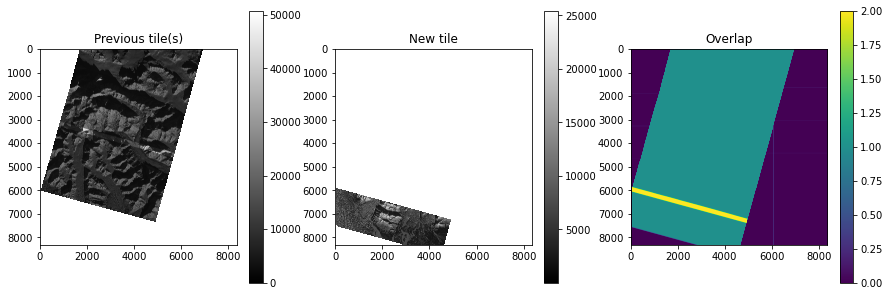

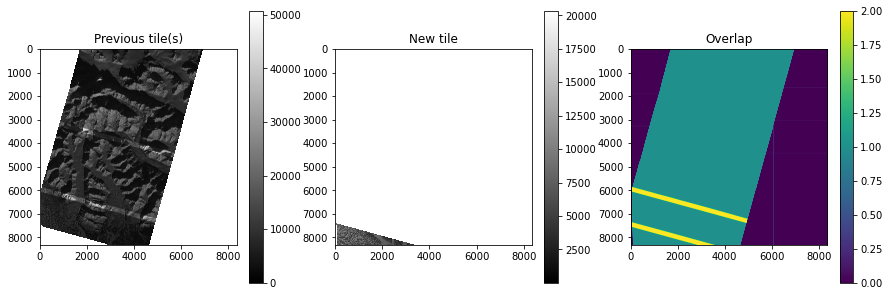

Previous tile is larger.
Mean difference in overlapping values: 2.518306316716814
Using overall mean diff: 2.518306316716814
Larger tile mean value: 8607.23138778431
Normalized mean value for smaller tile: 4251.428472147291




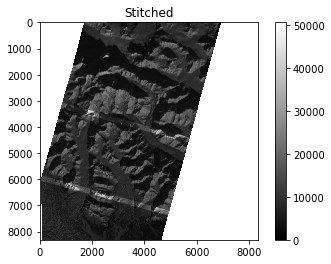

TILES FOR 20210211 2307
['/Volumes/SGlacier/Turner20_21/02_21/out/20210211_203231_23_2307_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_203233_59_2307_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_203235_95_2307_3B_AnalyticMS_SR_clip_5m.tif']


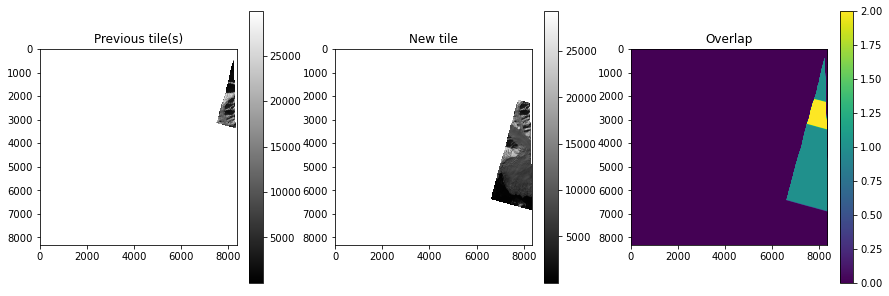

Previous tile is larger.
Mean difference in overlapping values: 28.601826334588953
Using overall mean diff: 28.601826334588953
Larger tile mean value: 8885.474135191755
Normalized mean value for smaller tile: 5544.525213419646




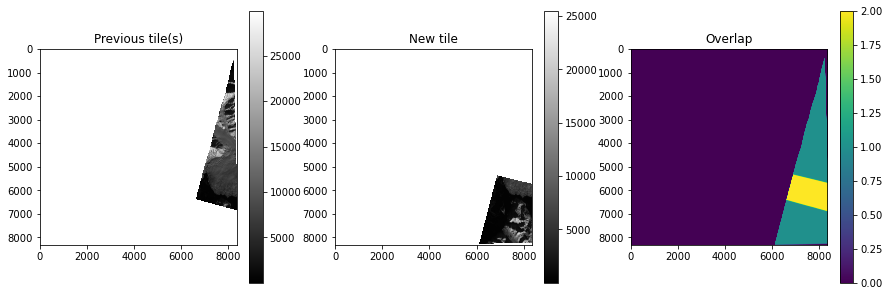

Previous tile is larger.
Mean difference in overlapping values: 31.13540981138363
Using glacier mean diff: 0.31464622206165943
Larger tile mean value: 7024.062687472124
Normalized mean value for smaller tile: 2082.8255313995564




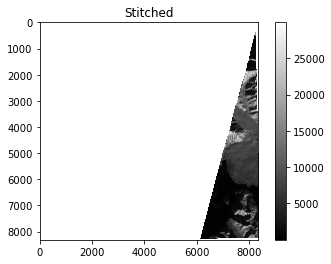

TILES FOR 20210211 2424
['/Volumes/SGlacier/Turner20_21/02_21/out/20210211_203258_44_2424_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_203300_78_2424_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_203303_13_2424_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210211_203305_47_2424_3B_AnalyticMS_SR_clip_5m.tif']


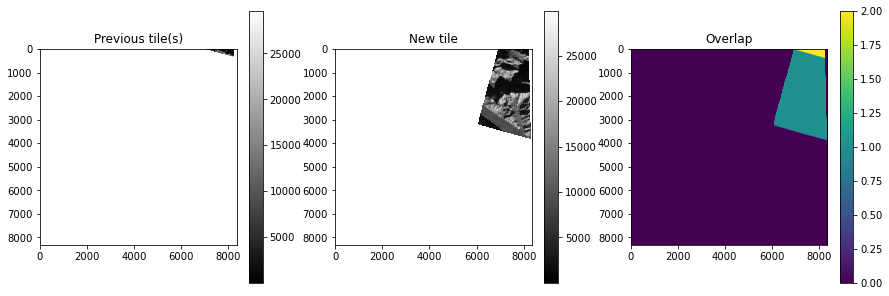

Previous tile is larger.
Mean difference in overlapping values: -0.4414695843523962
Using overall mean diff: -0.4414695843523962
Larger tile mean value: 6330.8383049361655
Normalized mean value for smaller tile: 8202.636936692574




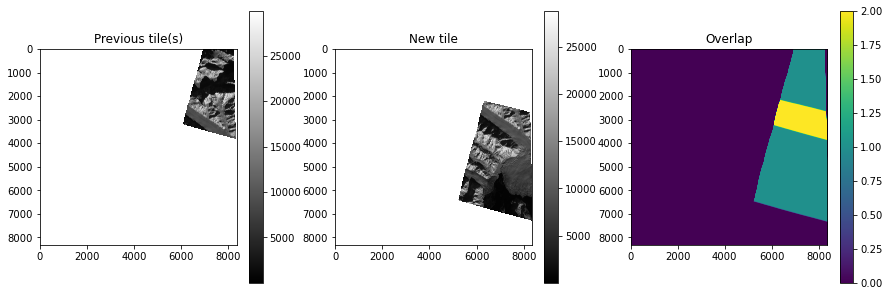

Current tile is larger.
Mean difference in overlapping values: -19.462425435140712
Using overall mean diff: -19.462425435140712
Larger tile mean value: 7714.243446869179
Normalized mean value for smaller tile: 4614.372625906703




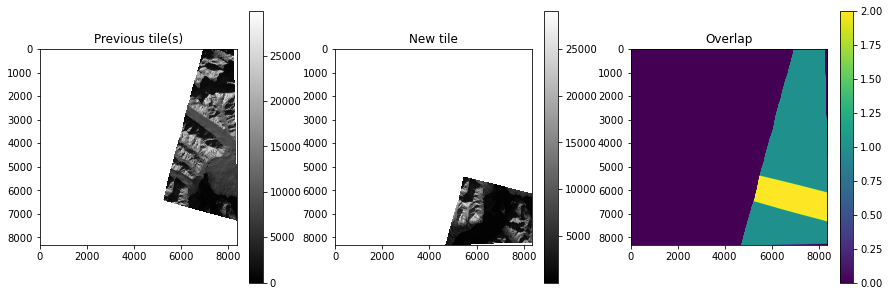

Previous tile is larger.
Mean difference in overlapping values: 5.909104823455423
Using glacier mean diff: 1.1891502071891795
Larger tile mean value: 7672.970191453635
Normalized mean value for smaller tile: 2768.8153497857948




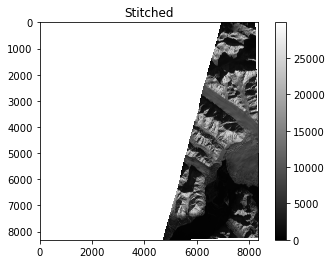

TILES FOR 20210212 241c
['/Volumes/SGlacier/Turner20_21/02_21/out/20210212_203613_77_241c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210212_203616_12_241c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210212_203618_47_241c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210212_203620_83_241c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210212_203623_18_241c_3B_AnalyticMS_SR_clip_5m.tif']


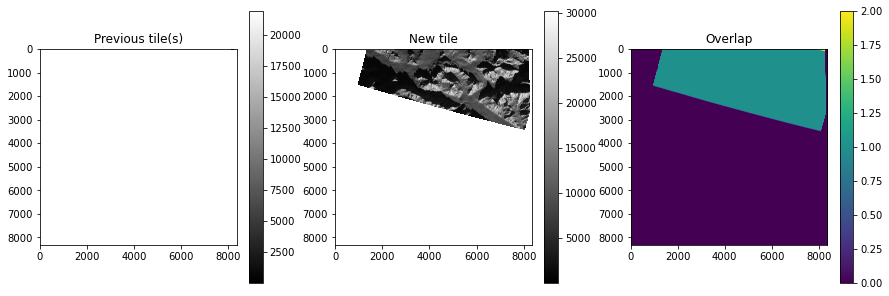

Previous tile is larger.
Mean difference in overlapping values: -22.955292285181216
Using overall mean diff: -22.955292285181216
Larger tile mean value: 1674.1509607555647
Normalized mean value for smaller tile: 7802.557360489088




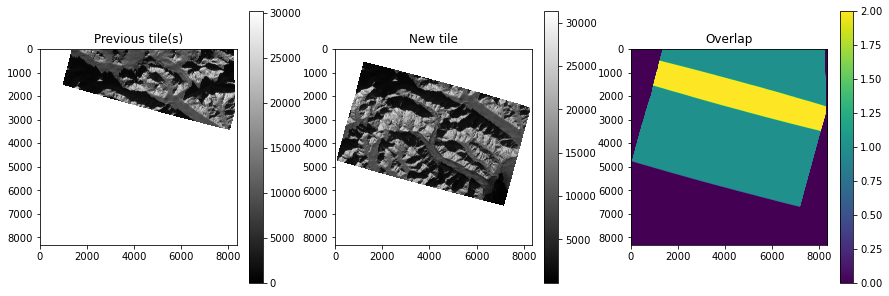

Current tile is larger.
Mean difference in overlapping values: -4.645502821486698
Using glacier mean diff: -4.7192107970022965
Larger tile mean value: 8658.909671844449
Normalized mean value for smaller tile: 4455.133543226635




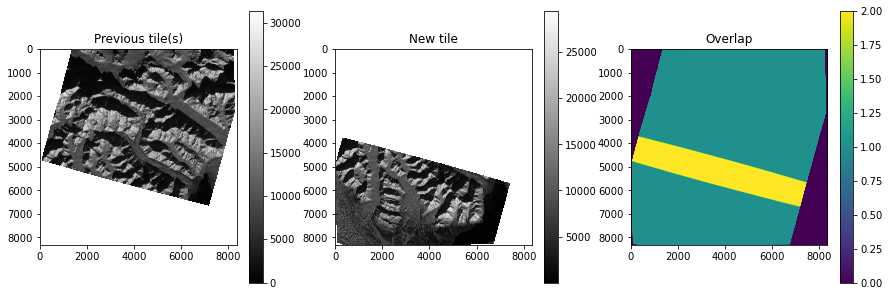

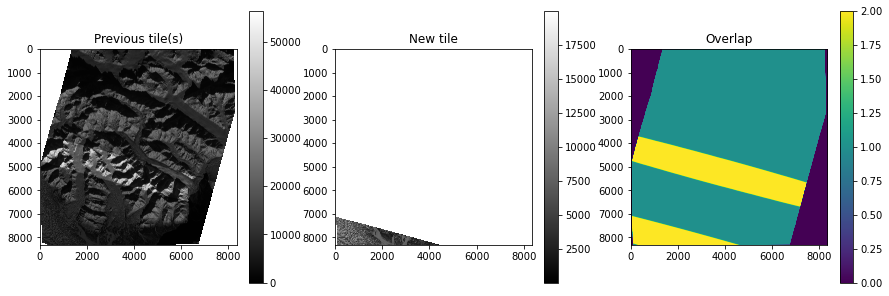

Previous tile is larger.
Mean difference in overlapping values: 7.13957997273748
Using overall mean diff: 7.13957997273748
Larger tile mean value: 9161.041888277929
Normalized mean value for smaller tile: 21.046443249755313




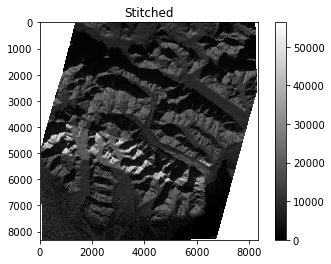

TILES FOR 20210213 1035
['/Volumes/SGlacier/Turner20_21/02_21/out/20210213_200857_1035_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_200858_1035_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_200859_1035_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_200900_1035_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_200901_1035_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_200902_1035_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_200903_1035_3B_AnalyticMS_SR_clip_5m.tif']


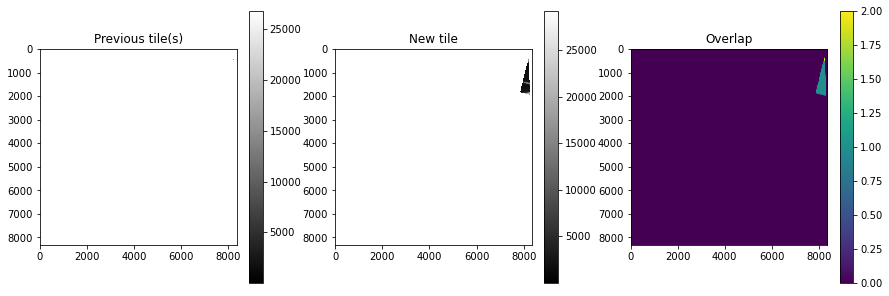

Previous tile is larger.
Mean difference in overlapping values: -78.82754692418933
Using overall mean diff: -78.82754692418933
Larger tile mean value: 16230.546699571527
Normalized mean value for smaller tile: 4009.178683474572




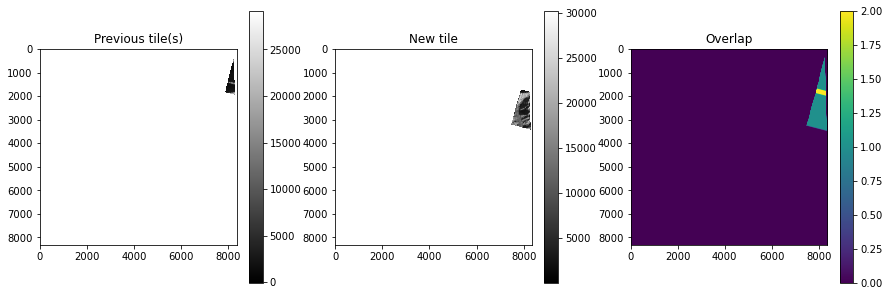

Current tile is larger.
Mean difference in overlapping values: 128.07785809177008
Using overall mean diff: 128.07785809177008
Larger tile mean value: 10564.608507147712
Normalized mean value for smaller tile: 2422.6285207215756




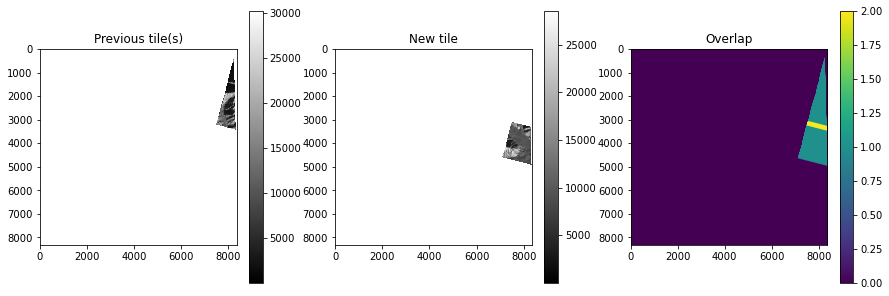

Current tile is larger.
Mean difference in overlapping values: -0.10235288192468461
Using overall mean diff: -0.10235288192468461
Larger tile mean value: 10813.207484503388
Normalized mean value for smaller tile: 7383.730605461011




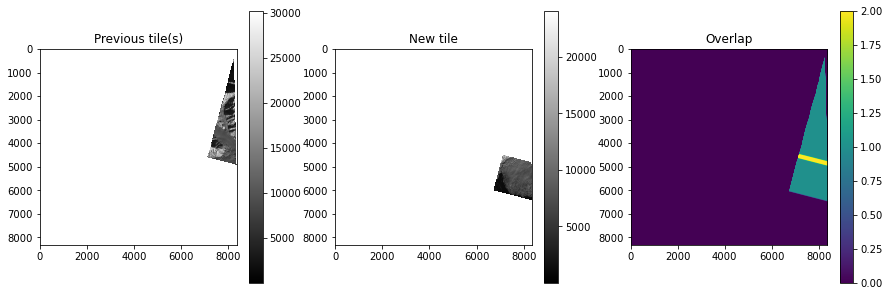

Previous tile is larger.
Mean difference in overlapping values: 15.165009467251544
Using overall mean diff: 15.165009467251544
Larger tile mean value: 9888.49370563855
Normalized mean value for smaller tile: 5468.360932430181




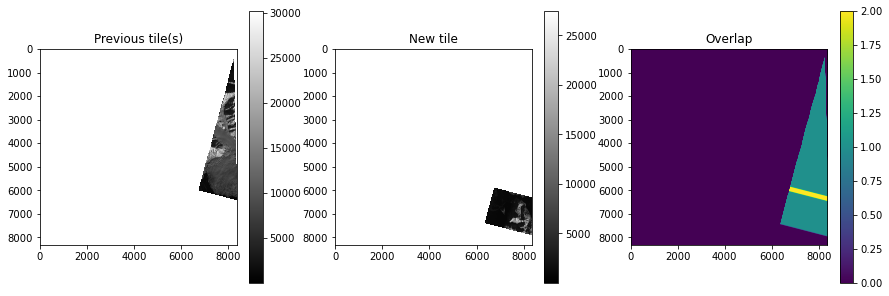

Previous tile is larger.
Mean difference in overlapping values: 23.208038626008026
Using overall mean diff: 23.208038626008026
Larger tile mean value: 8247.530923024475
Normalized mean value for smaller tile: 2905.380127210435




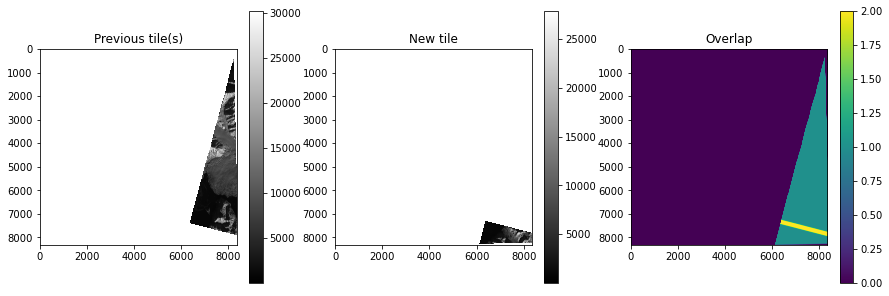

Previous tile is larger.
Mean difference in overlapping values: 11.389399002839706
Using overall mean diff: 11.389399002839706
Larger tile mean value: 6508.809127431356
Normalized mean value for smaller tile: 3253.338037614182




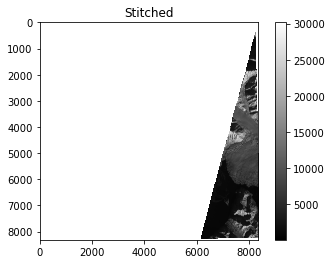

TILES FOR 20210213 106a
['/Volumes/SGlacier/Turner20_21/02_21/out/20210213_190438_42_106a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_190439_95_106a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_190441_48_106a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_190443_01_106a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_190444_53_106a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_190446_06_106a_3B_AnalyticMS_SR_clip_5m.tif']


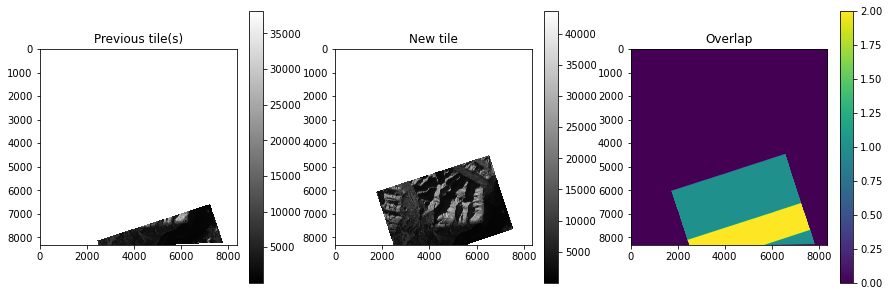

Previous tile is larger.
Mean difference in overlapping values: -23.54744095471575
Using overall mean diff: -23.54744095471575
Larger tile mean value: 3780.861817541649
Normalized mean value for smaller tile: 6191.072384153639




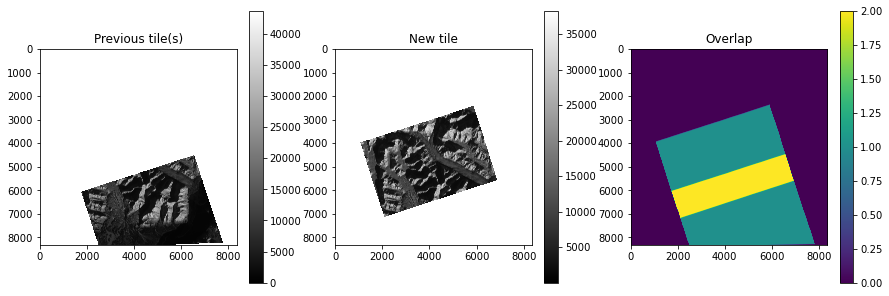

Current tile is larger.
Mean difference in overlapping values: 75.16686648217194
Using glacier mean diff: 21.158043832242804
Larger tile mean value: 9563.792635232514
Normalized mean value for smaller tile: 3919.722052515819




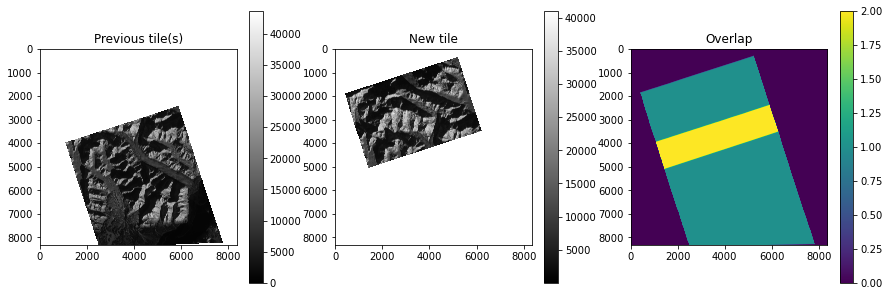

Previous tile is larger.
Mean difference in overlapping values: -55.8199171384964
Using glacier mean diff: -14.951678888326507
Larger tile mean value: 8322.681633891678
Normalized mean value for smaller tile: 6363.418157182123




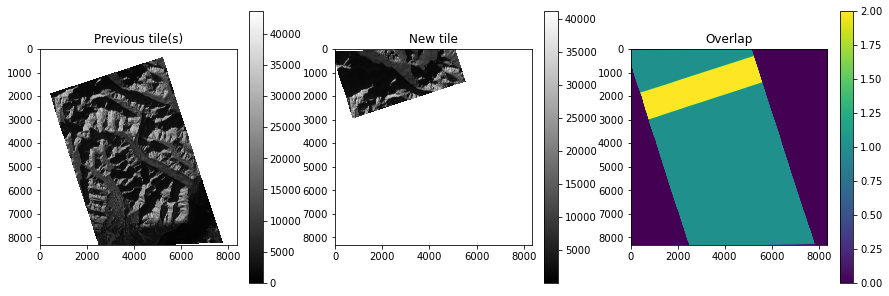

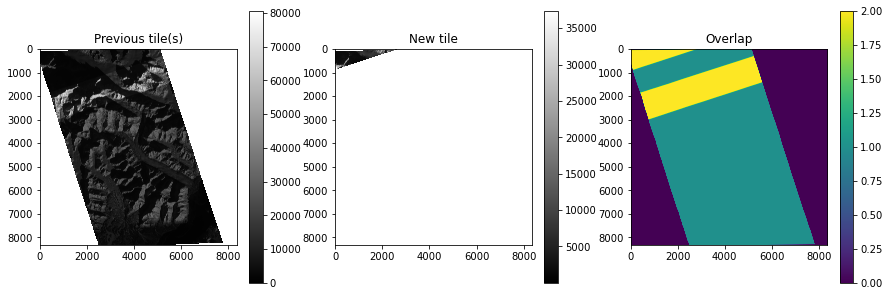

Previous tile is larger.
Mean difference in overlapping values: -29.32647203827718
Using overall mean diff: -29.32647203827718
Larger tile mean value: 9537.34676026262
Normalized mean value for smaller tile: 0.8170659667386477




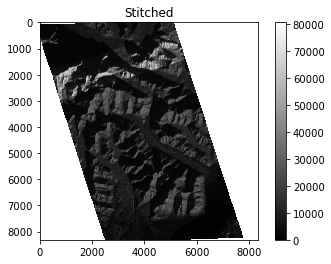

TILES FOR 20210213 240a
['/Volumes/SGlacier/Turner20_21/02_21/out/20210213_203850_06_240a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_203852_41_240a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_203854_76_240a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210213_203857_10_240a_3B_AnalyticMS_SR_clip_5m.tif']


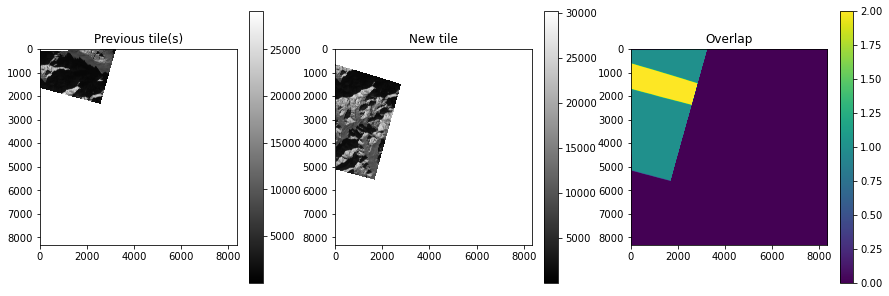

Previous tile is larger.
Mean difference in overlapping values: 19.06347295660989
Using glacier mean diff: 0.20061763738971009
Larger tile mean value: 4946.052126136323
Normalized mean value for smaller tile: 7149.634362029157




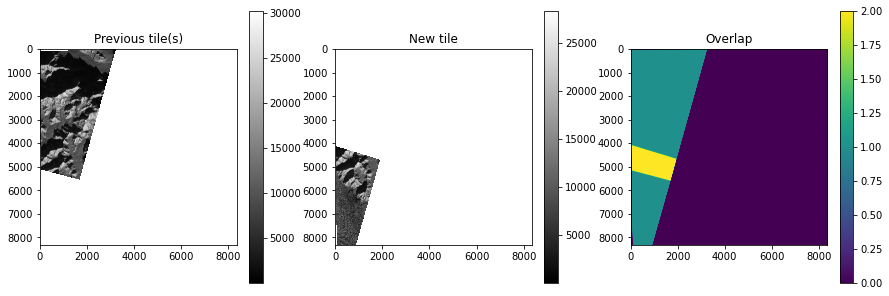

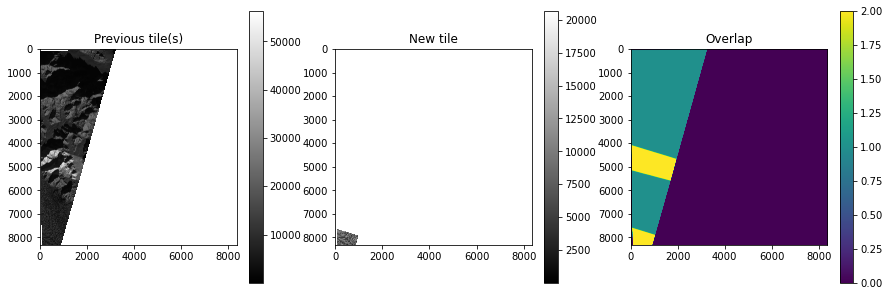

Previous tile is larger.
Mean difference in overlapping values: 11.439019546483042
Using overall mean diff: 11.439019546483042
Larger tile mean value: 8774.29385437924
Normalized mean value for smaller tile: 0.3934724714230428




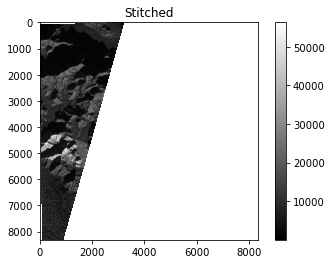

TILES FOR 20210214 1026
['/Volumes/SGlacier/Turner20_21/02_21/out/20210214_202512_1026_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_202513_1026_3B_AnalyticMS_SR_clip_5m.tif']


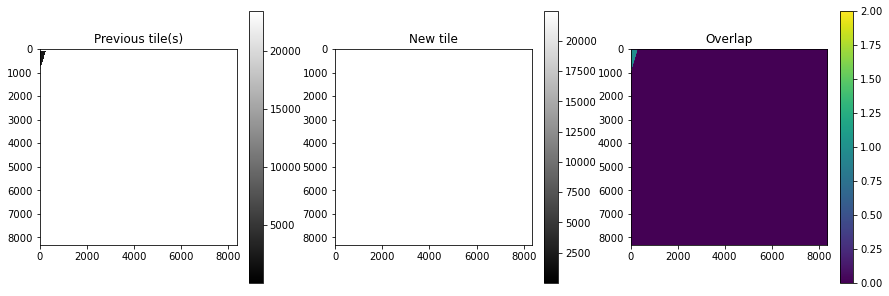

Previous tile is larger.
Mean difference in overlapping values: -18.79526870851515
Using overall mean diff: -18.79526870851515
Larger tile mean value: 3696.7387052716413
Normalized mean value for smaller tile: 70.61648419489104




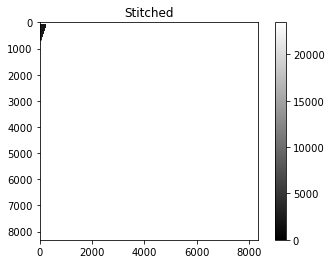

TILES FOR 20210214 1032
['/Volumes/SGlacier/Turner20_21/02_21/out/20210214_201527_1032_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_201528_1032_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_201529_1032_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_201530_1032_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_201532_1032_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_201533_1032_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_201534_1032_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_201535_1032_3B_AnalyticMS_SR_clip_5m.tif']


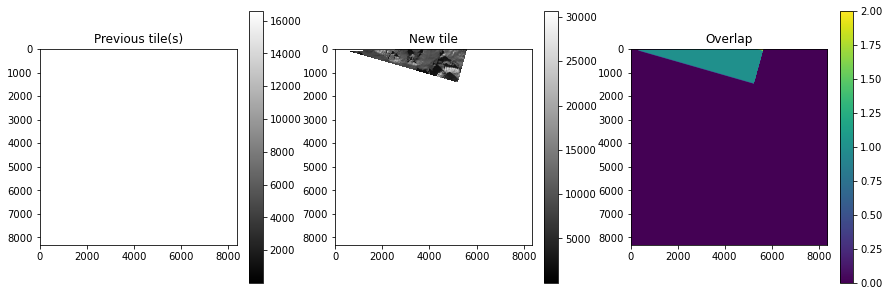

Previous tile is larger.
Mean difference in overlapping values: -59.65828353982024
Using overall mean diff: -59.65828353982024
Larger tile mean value: 8531.142756559459
Normalized mean value for smaller tile: 9049.243047092517




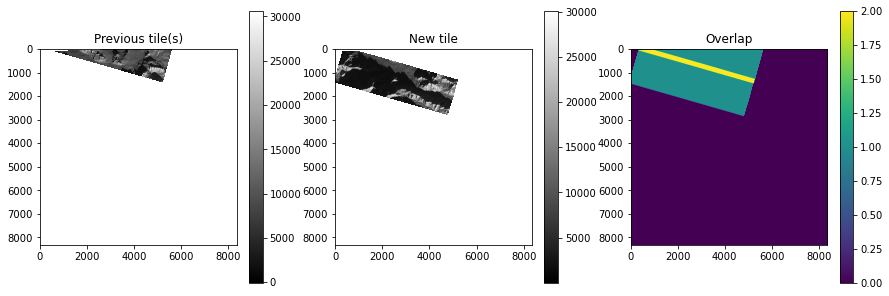

Current tile is larger.
Mean difference in overlapping values: 54.08683661441536
Using overall mean diff: 54.08683661441536
Larger tile mean value: 6527.409878944195
Normalized mean value for smaller tile: 7259.649880864746




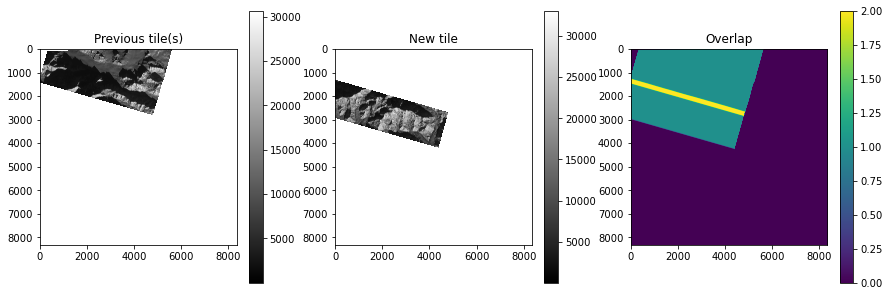

Previous tile is larger.
Mean difference in overlapping values: 9.85605629459695
Using glacier mean diff: 9.236180353899254
Larger tile mean value: 7366.489070492608
Normalized mean value for smaller tile: 9736.232373002445




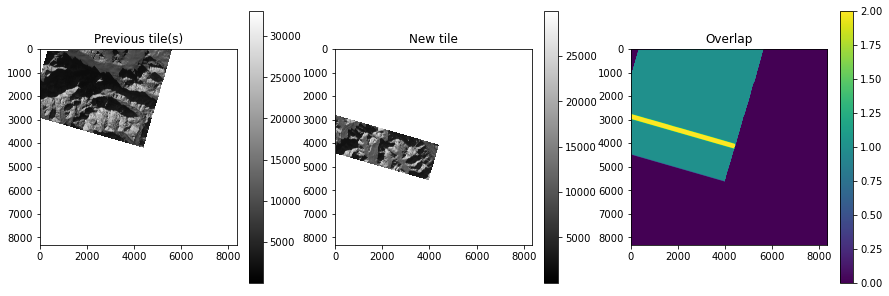

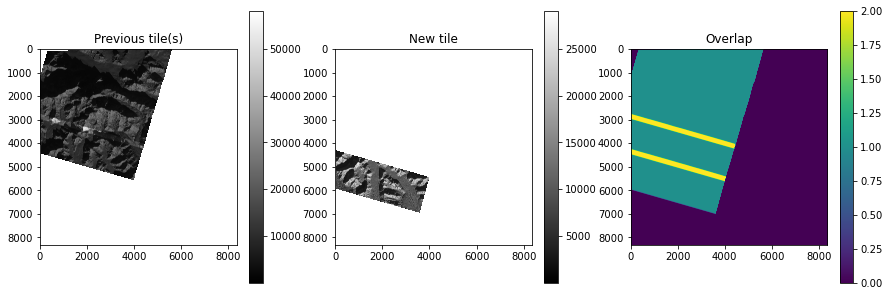

Previous tile is larger.
Mean difference in overlapping values: 2.581384912582534
Using overall mean diff: 2.581384912582534
Larger tile mean value: 9285.589082634719
Normalized mean value for smaller tile: 8379.899759518503




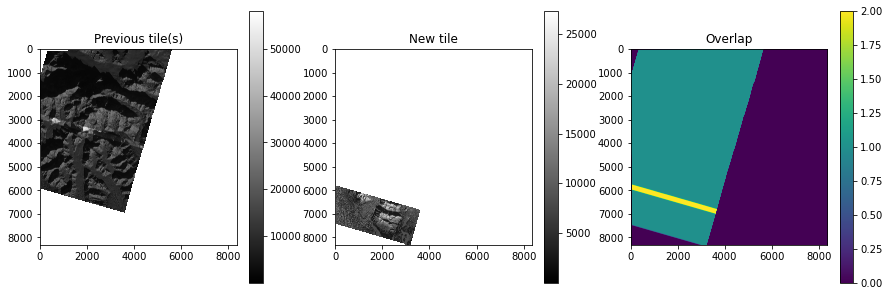

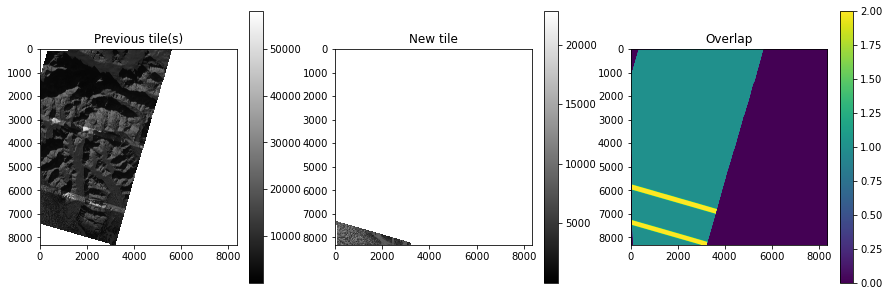

Previous tile is larger.
Mean difference in overlapping values: 1.4643909911512387
Using overall mean diff: 1.4643909911512387
Larger tile mean value: 9319.003823173121
Normalized mean value for smaller tile: 4846.467146799839




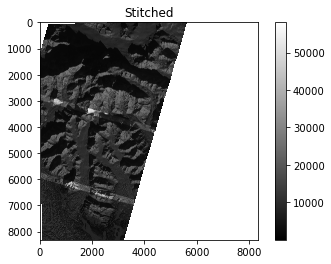

TILES FOR 20210214 2426
['/Volumes/SGlacier/Turner20_21/02_21/out/20210214_203903_65_2426_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_203905_92_2426_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_203908_18_2426_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210214_203910_45_2426_3B_AnalyticMS_SR_clip_5m.tif']


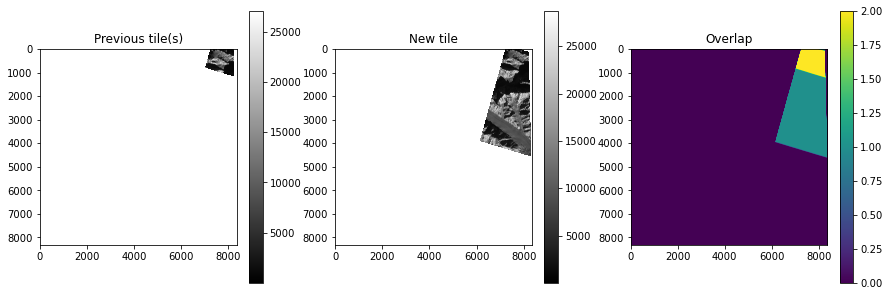

Previous tile is larger.
Mean difference in overlapping values: 14.584941055282597
Using overall mean diff: 14.584941055282597
Larger tile mean value: 6859.0502289002
Normalized mean value for smaller tile: 7494.890077627912




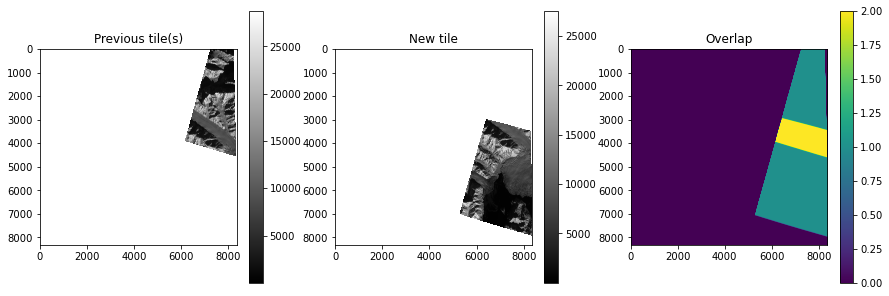

Current tile is larger.
Mean difference in overlapping values: -26.896849353179224
Using overall mean diff: -26.896849353179224
Larger tile mean value: 6705.107680983782
Normalized mean value for smaller tile: 5653.101268347529




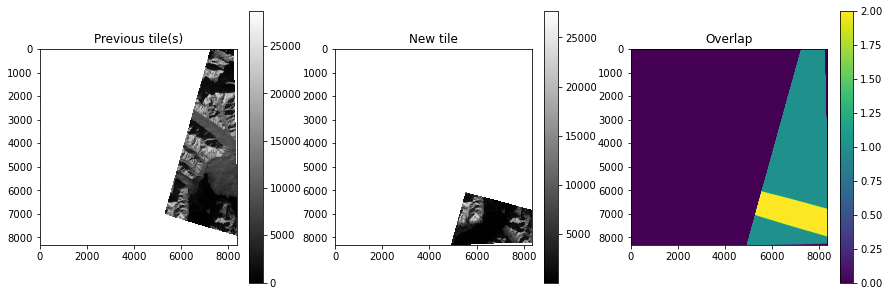

Previous tile is larger.
Mean difference in overlapping values: 12.218851153805133
Using glacier mean diff: 0.5756681414529217
Larger tile mean value: 7222.699096029925
Normalized mean value for smaller tile: 1429.451497281748




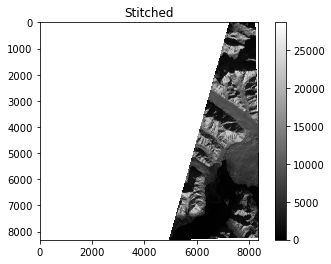

TILES FOR 20210215 100c
['/Volumes/SGlacier/Turner20_21/02_21/out/20210215_201134_100c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_201135_100c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_201136_100c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_201137_100c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_201138_100c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_201139_100c_3B_AnalyticMS_SR_clip_5m.tif']


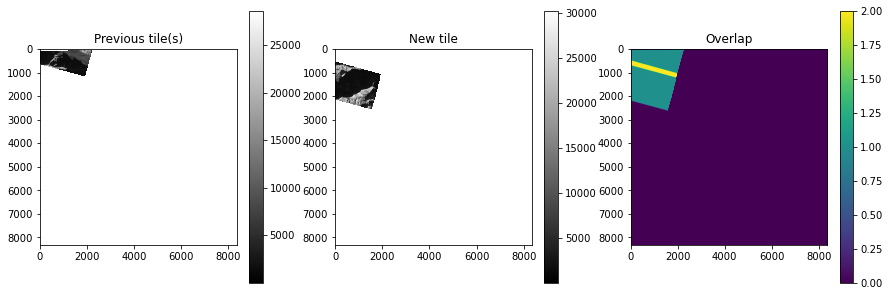

Previous tile is larger.
Mean difference in overlapping values: -11.13227530332917
Using overall mean diff: -11.13227530332917
Larger tile mean value: 4946.443155002268
Normalized mean value for smaller tile: 5906.008242616182




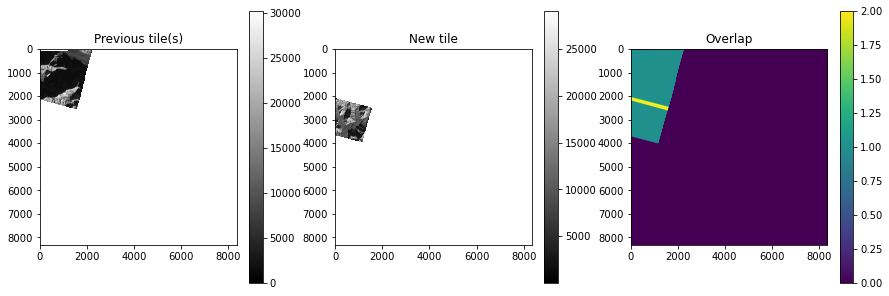

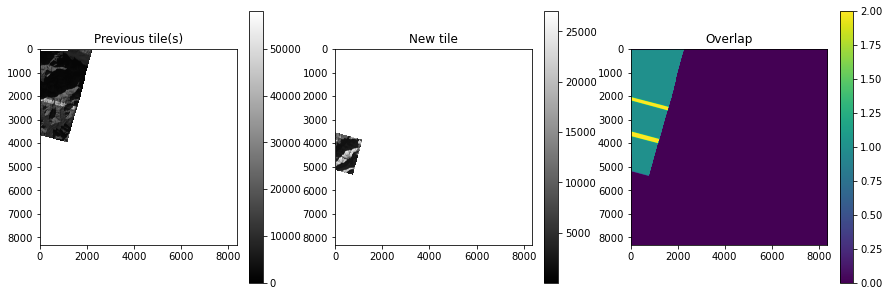

Previous tile is larger.
Mean difference in overlapping values: 14.11517711698899
Using overall mean diff: 14.11517711698899
Larger tile mean value: 7878.441388630184
Normalized mean value for smaller tile: 6080.656337975611




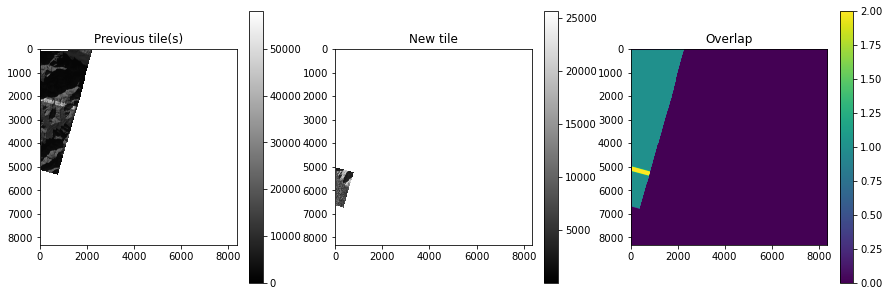

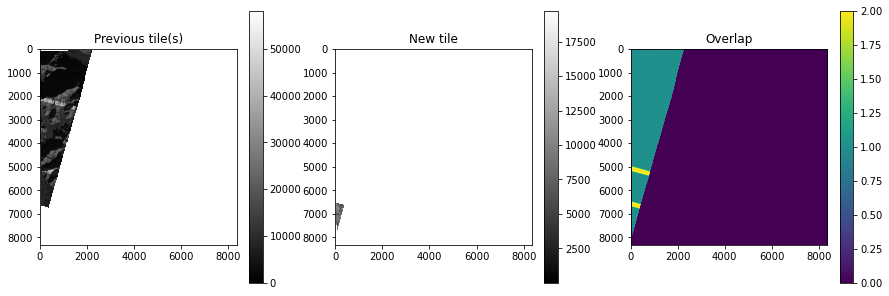

Previous tile is larger.
Mean difference in overlapping values: -2.883323678452182
Using overall mean diff: -2.883323678452182
Larger tile mean value: 7943.488909744066
Normalized mean value for smaller tile: 6105.805429647781




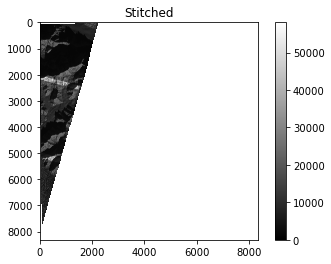

TILES FOR 20210215 1063
['/Volumes/SGlacier/Turner20_21/02_21/out/20210215_190732_25_1063_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_190733_77_1063_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_190735_30_1063_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_190736_83_1063_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_190738_35_1063_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_190739_88_1063_3B_AnalyticMS_SR_clip_5m.tif']


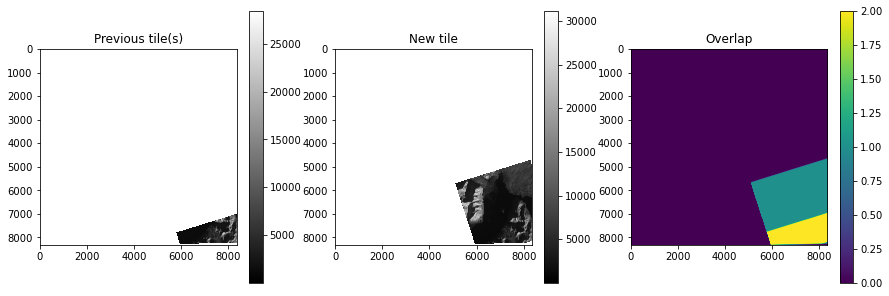

Previous tile is larger.
Mean difference in overlapping values: -17.557009984399027
Using overall mean diff: -17.557009984399027
Larger tile mean value: 4311.370928582972
Normalized mean value for smaller tile: 4362.42598254157




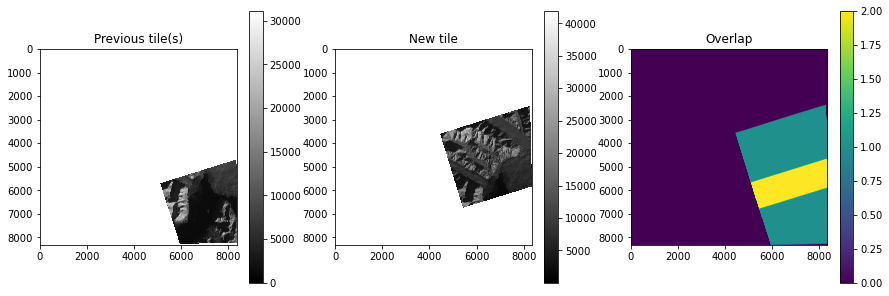

Current tile is larger.
Mean difference in overlapping values: 47.70771918651987
Using glacier mean diff: 17.509534030144675
Larger tile mean value: 9454.962604023403
Normalized mean value for smaller tile: 2593.500977376121




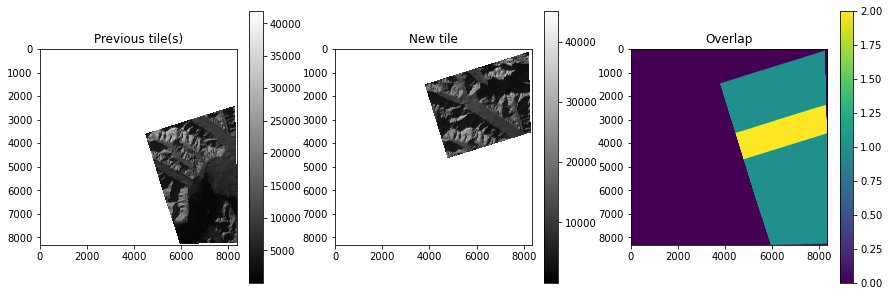

Previous tile is larger.
Mean difference in overlapping values: -80.50090217843238
Using glacier mean diff: -5.84301665221735
Larger tile mean value: 7907.992699326252
Normalized mean value for smaller tile: 6343.0843692221215




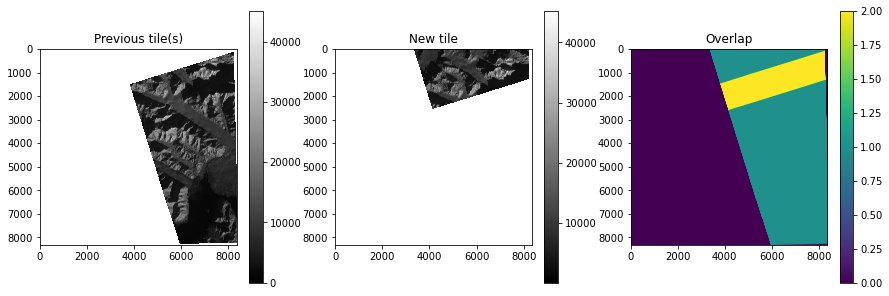

Previous tile is larger.
Mean difference in overlapping values: -67.62097484685263
Using glacier mean diff: -2.522008417427363
Larger tile mean value: 8423.798334824472
Normalized mean value for smaller tile: 3286.872608713239




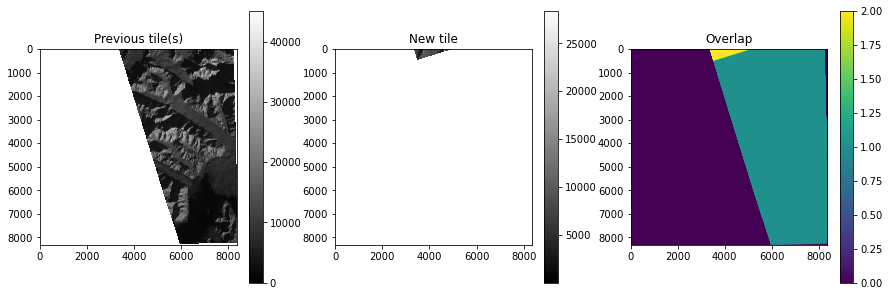

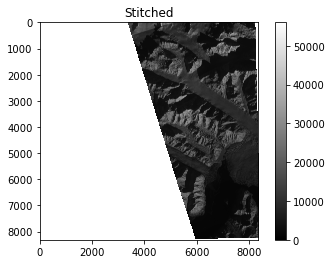

TILES FOR 20210215 2414
['/Volumes/SGlacier/Turner20_21/02_21/out/20210215_203810_40_2414_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_203812_67_2414_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_203814_94_2414_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_203817_21_2414_3B_AnalyticMS_SR_clip_5m.tif']


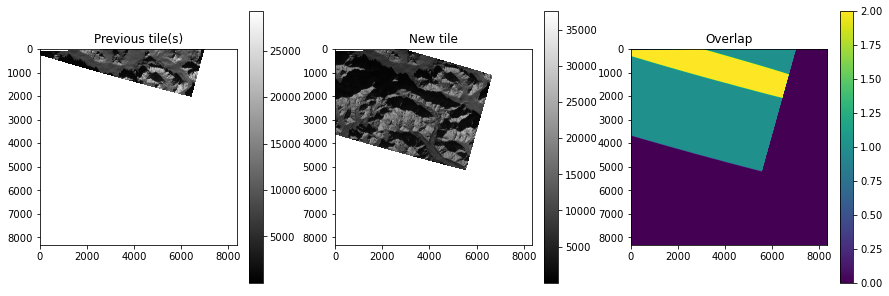

Previous tile is larger.
Mean difference in overlapping values: 8.990061187065526
Using overall mean diff: 8.990061187065526
Larger tile mean value: 7612.178466950231
Normalized mean value for smaller tile: 6200.600595077669




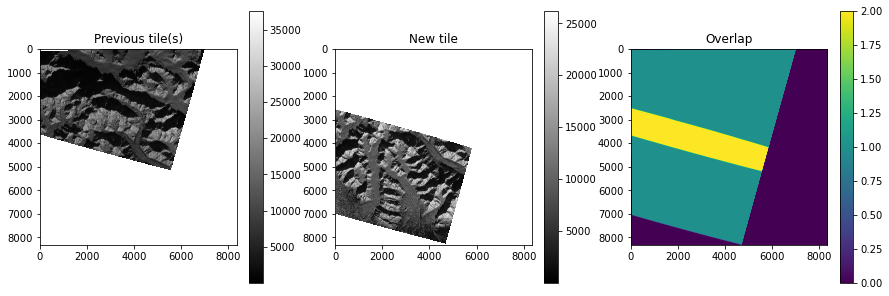

Previous tile is larger.
Mean difference in overlapping values: 29.544302637545215
Using glacier mean diff: 7.895464514996598
Larger tile mean value: 7986.124351784755
Normalized mean value for smaller tile: 5545.9540422747605




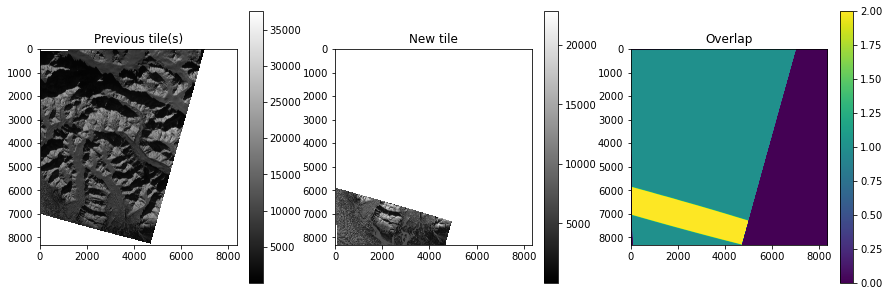

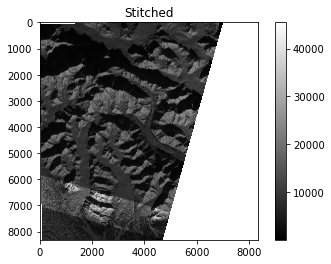

TILES FOR 20210215 2441
['/Volumes/SGlacier/Turner20_21/02_21/out/20210215_195302_22_2441_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_195304_50_2441_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_195306_77_2441_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210215_195309_04_2441_3B_AnalyticMS_SR_clip_5m.tif']


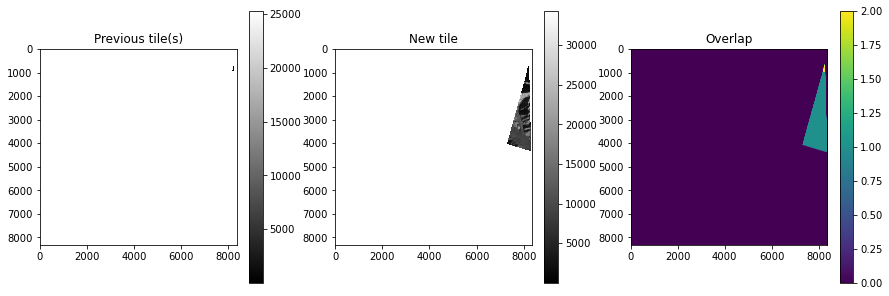

Previous tile is larger.
Mean difference in overlapping values: -15.225894431912785
Using overall mean diff: -15.225894431912785
Larger tile mean value: 1337.9511316378557
Normalized mean value for smaller tile: 8537.561020576763




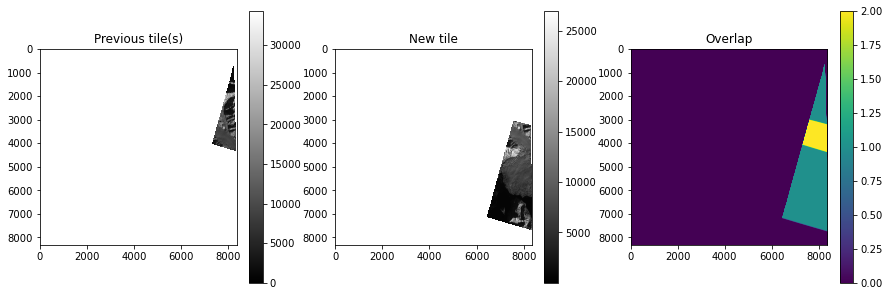

Current tile is larger.
Mean difference in overlapping values: 2.450025008309228
Using overall mean diff: 2.450025008309228
Larger tile mean value: 5731.114631550305
Normalized mean value for smaller tile: 3763.58181131813




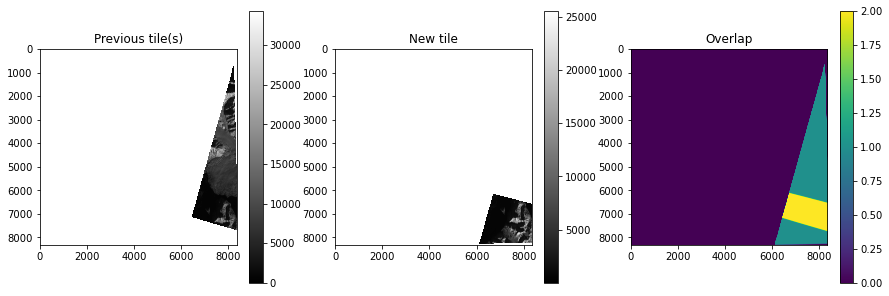

Previous tile is larger.
Mean difference in overlapping values: 1.044112937846116
Using overall mean diff: 1.044112937846116
Larger tile mean value: 6025.368337117774
Normalized mean value for smaller tile: 1618.1174576713781




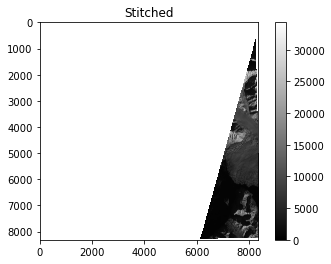

TILES FOR 20210216 1034
['/Volumes/SGlacier/Turner20_21/02_21/out/20210216_201612_1034_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210216_201613_1034_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210216_201614_1034_3B_AnalyticMS_SR_clip_5m.tif']


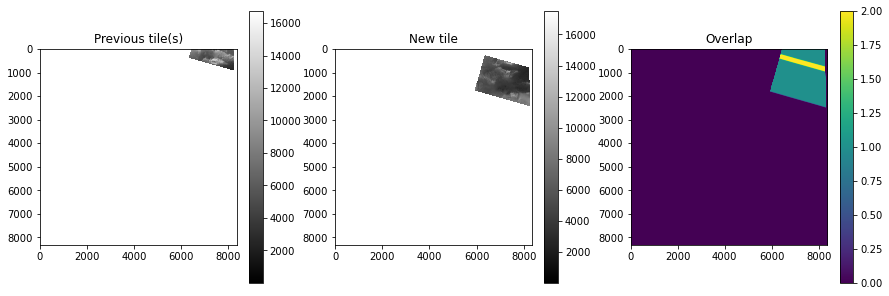

Previous tile is larger.
Mean difference in overlapping values: 9.670712305698586
Using overall mean diff: 9.670712305698586
Larger tile mean value: 6986.052787206106
Normalized mean value for smaller tile: 4765.126845611428




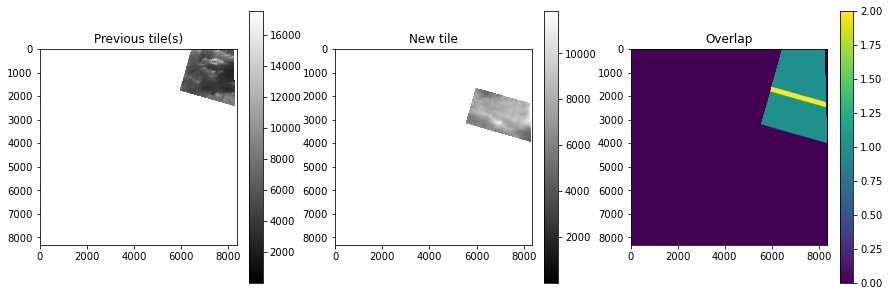

Previous tile is larger.
Mean difference in overlapping values: 11.222872062987953
Using overall mean diff: 11.222872062987953
Larger tile mean value: 5838.36820974677
Normalized mean value for smaller tile: 6704.672704004145




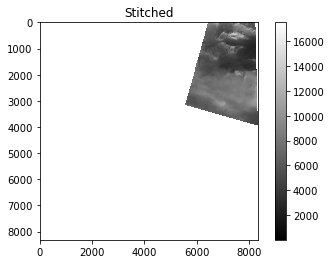

TILES FOR 20210216 106e
['/Volumes/SGlacier/Turner20_21/02_21/out/20210216_190429_33_106e_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210216_190430_86_106e_3B_AnalyticMS_SR_clip_5m.tif']


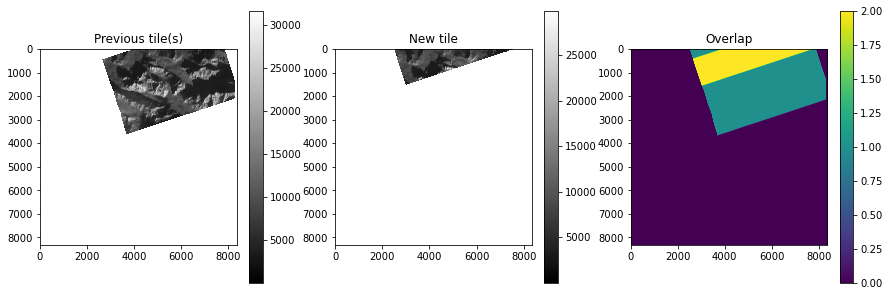

Previous tile is larger.
Mean difference in overlapping values: -12.477377780461223
Using overall mean diff: -12.477377780461223
Larger tile mean value: 8488.984895525395
Normalized mean value for smaller tile: 428.5045949894914




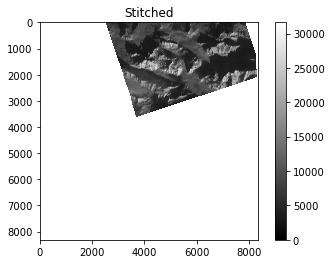

TILES FOR 20210216 2276
['/Volumes/SGlacier/Turner20_21/02_21/out/20210216_195837_94_2276_3B_AnalyticMS_SR_clip_5m.tif']


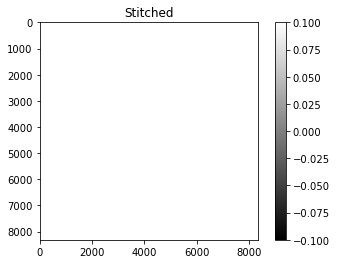

TILES FOR 20210216 240c
['/Volumes/SGlacier/Turner20_21/02_21/out/20210216_203817_20_240c_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210216_203819_48_240c_3B_AnalyticMS_SR_clip_5m.tif']


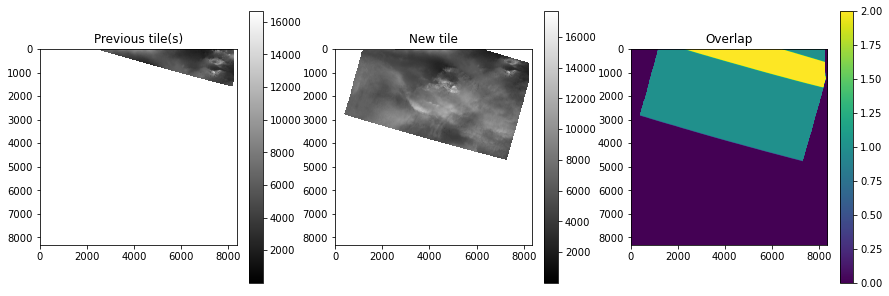

Previous tile is larger.
Mean difference in overlapping values: 7.459867802592761
Using overall mean diff: 7.459867802592761
Larger tile mean value: 4886.422789829629
Normalized mean value for smaller tile: 5905.312585855194




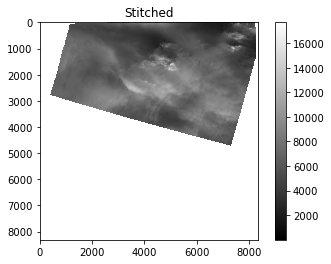

TILES FOR 20210218 1061
['/Volumes/SGlacier/Turner20_21/02_21/out/20210218_205134_72_1061_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210218_205140_72_1061_3B_AnalyticMS_SR_clip_5m.tif']


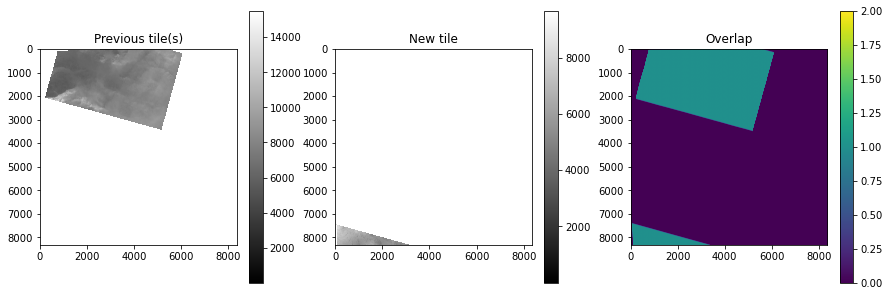

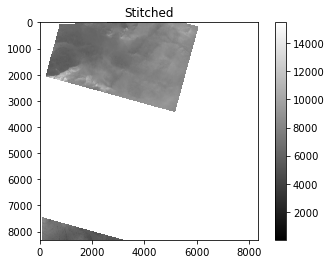

TILES FOR 20210221 227a
['/Volumes/SGlacier/Turner20_21/02_21/out/20210221_203543_76_227a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210221_203546_14_227a_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210221_203548_51_227a_3B_AnalyticMS_SR_clip_5m.tif']


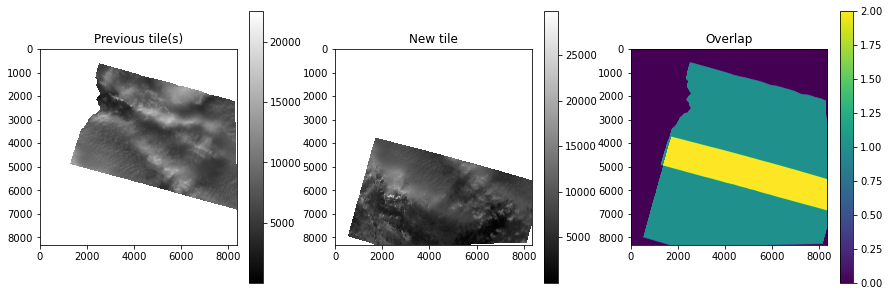

Previous tile is larger.
Mean difference in overlapping values: -325.01824591379585
Using glacier mean diff: 114.73144114074178
Larger tile mean value: 8244.88224757925
Normalized mean value for smaller tile: 4749.928863600813




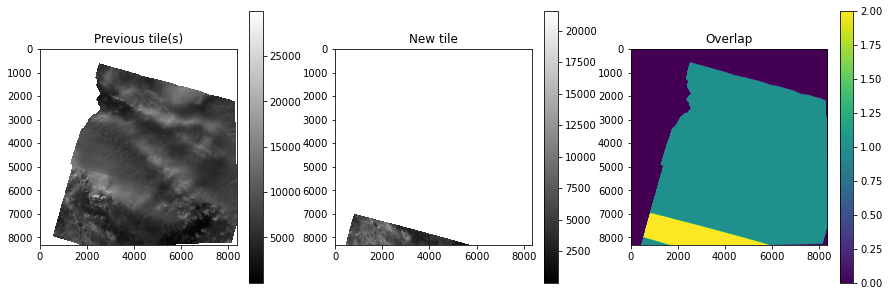

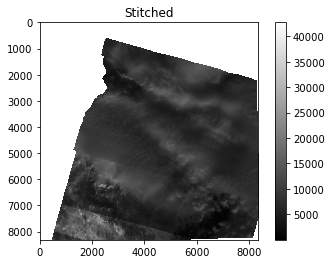

TILES FOR 20210222 1010
['/Volumes/SGlacier/Turner20_21/02_21/out/20210222_201109_1010_3B_AnalyticMS_SR_clip_5m.tif']


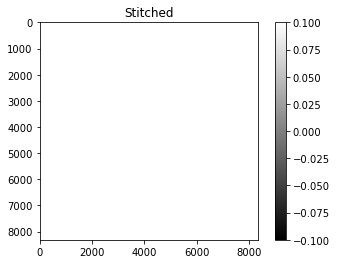

TILES FOR 20210222 2419
['/Volumes/SGlacier/Turner20_21/02_21/out/20210222_203704_40_2419_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210222_203709_11_2419_3B_AnalyticMS_SR_clip_5m.tif']


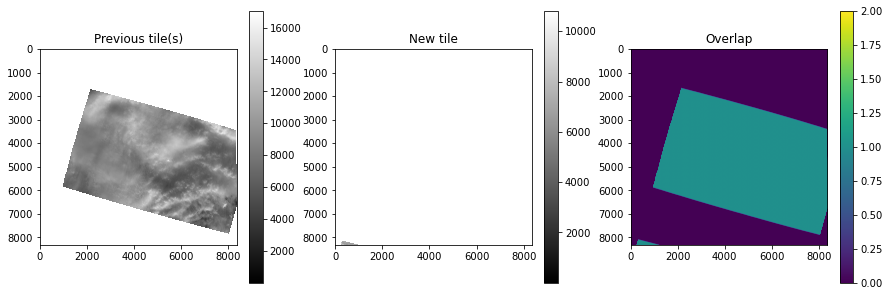

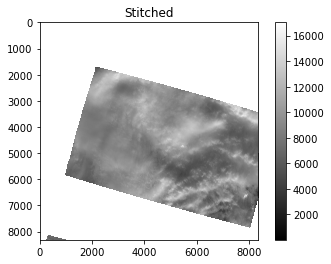

TILES FOR 20210223 2262
['/Volumes/SGlacier/Turner20_21/02_21/out/20210223_195150_89_2262_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210223_195153_37_2262_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210223_195155_86_2262_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210223_195158_34_2262_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210223_195200_82_2262_3B_AnalyticMS_SR_clip_5m.tif']


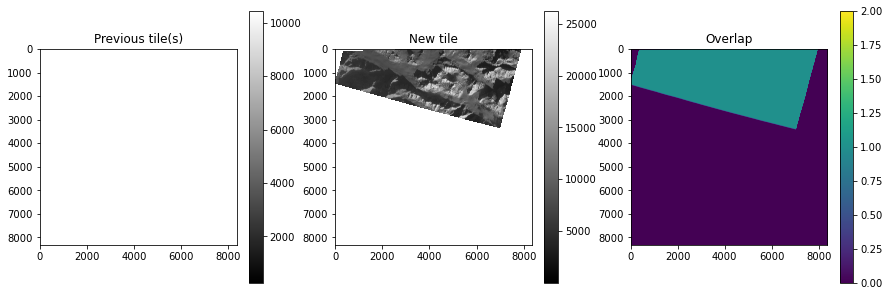

Previous tile is larger.
Mean difference in overlapping values: -293.7043935873366
Using overall mean diff: -293.7043935873366
Larger tile mean value: 6992.595202573009
Normalized mean value for smaller tile: 8270.255429645436




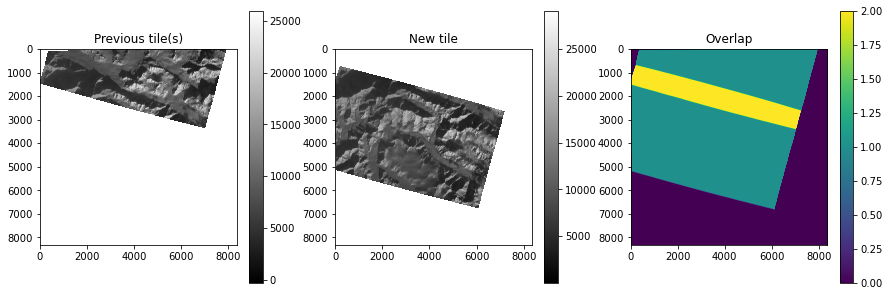

Current tile is larger.
Mean difference in overlapping values: 272.6522453803863
Using glacier mean diff: 34.50659212965251
Larger tile mean value: 9295.029873147254
Normalized mean value for smaller tile: 5666.405260846427




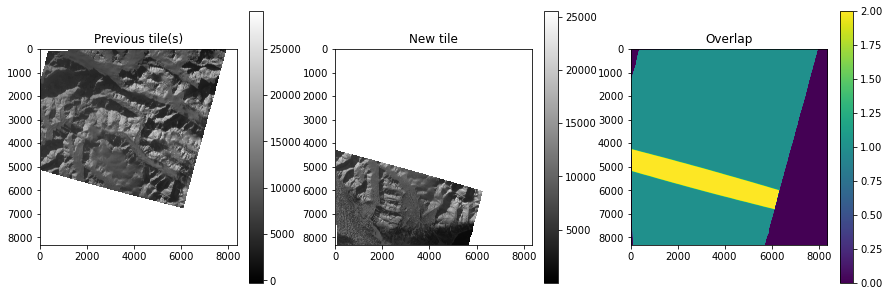

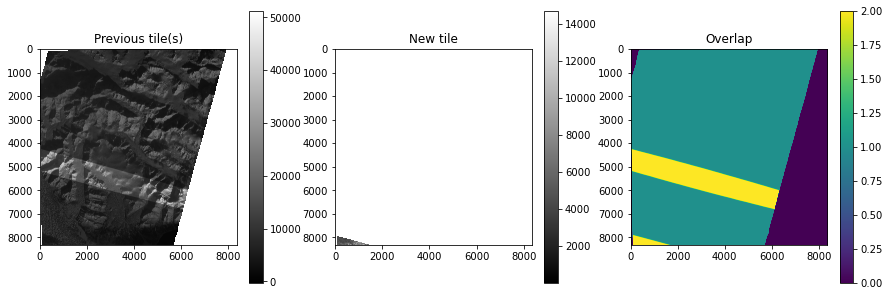

Previous tile is larger.
Mean difference in overlapping values: 14.128629255059014
Using overall mean diff: 14.128629255059014
Larger tile mean value: 9580.437101869207
Normalized mean value for smaller tile: 0.0




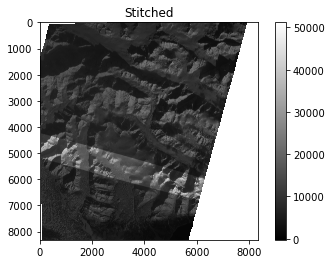

TILES FOR 20210223 2408
['/Volumes/SGlacier/Turner20_21/02_21/out/20210223_204003_12_2408_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210223_204005_39_2408_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210223_204007_67_2408_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210223_204009_94_2408_3B_AnalyticMS_SR_clip_5m.tif']


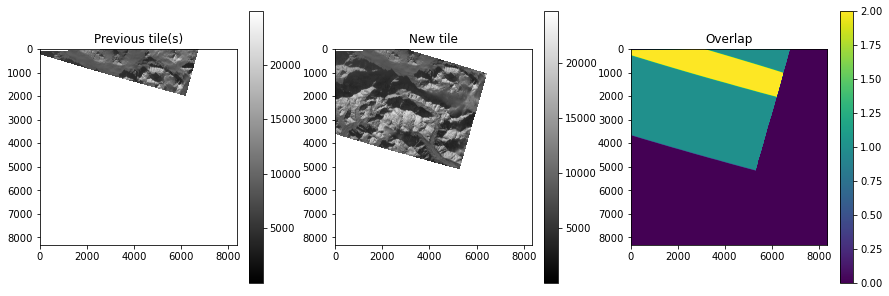

Previous tile is larger.
Mean difference in overlapping values: 16.760720228770268
Using overall mean diff: 16.760720228770268
Larger tile mean value: 8890.537834486113
Normalized mean value for smaller tile: 6852.474191788842




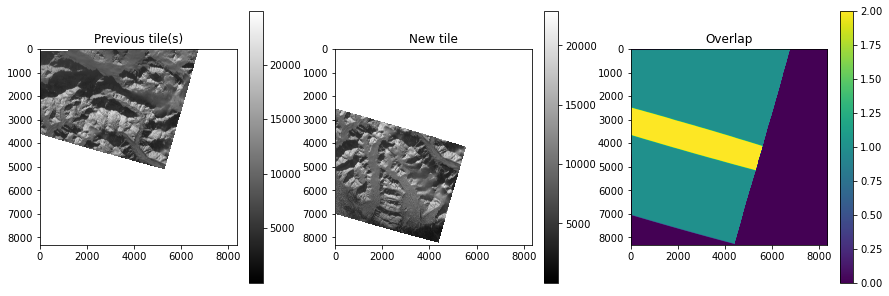

Previous tile is larger.
Mean difference in overlapping values: 33.73056447756952
Using glacier mean diff: 9.935271822196238
Larger tile mean value: 8951.461385756162
Normalized mean value for smaller tile: 5766.5421986033125




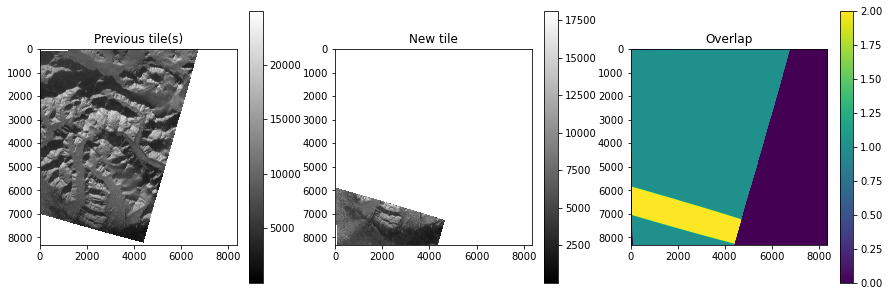

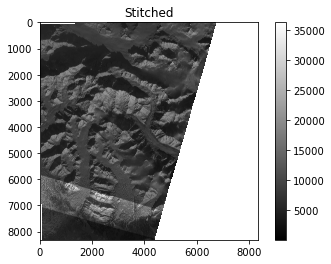

TILES FOR 20210224 1066
['/Volumes/SGlacier/Turner20_21/02_21/out/20210224_205434_74_1066_3B_AnalyticMS_SR_clip_5m.tif']


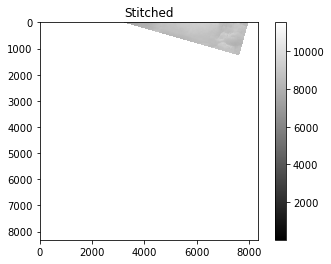

TILES FOR 20210226 0f22
['/Volumes/SGlacier/Turner20_21/02_21/out/20210226_201043_0f22_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210226_201044_0f22_3B_AnalyticMS_SR_clip_5m.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/20210226_201045_0f22_3B_AnalyticMS_SR_clip_5m.tif']


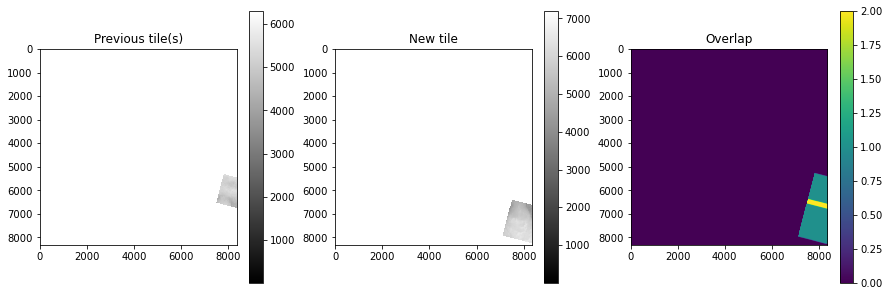

Previous tile is larger.
Mean difference in overlapping values: -0.16165033381820515
Using overall mean diff: -0.16165033381820515
Larger tile mean value: 5036.108339592515
Normalized mean value for smaller tile: 5202.845640654941




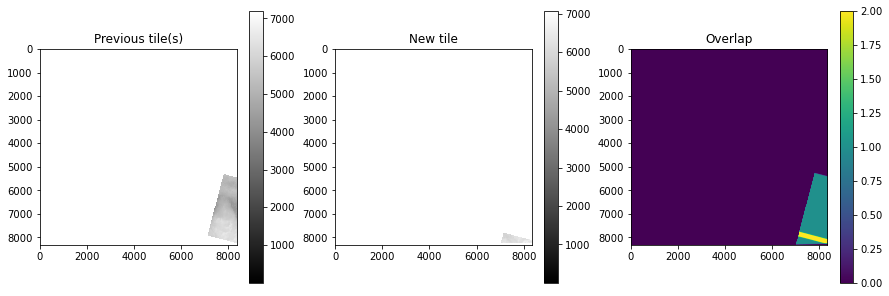

Previous tile is larger.
Mean difference in overlapping values: 1.5887892630655296
Using overall mean diff: 1.5887892630655296
Larger tile mean value: 5515.287111495472
Normalized mean value for smaller tile: 2743.8403056691573




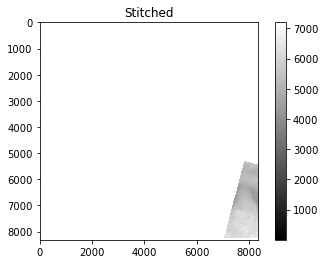

<IPython.core.display.Javascript object>

In [35]:
%%notify -m "Stitch by sat finished processing."

binary_thresh = 1
for date, ID in sorted_dates:  
    print('TILES FOR', date, ID)
    # Grab the Planet tiles corresponding to each unique date
    tiles = glob.glob(basepath+'/'+date+'*'+ID+'*SR_clip_5m.tif') # grab all file paths for that date
    tiles.sort()
    print(tiles)
    
    # initialize empty arrays
    overlap_total = np.zeros(reftile.shape);
    sr_stitched = np.zeros(reftile.shape) # start with empty stitched product
    t = 0 # tile count
    
    for tile in tiles:
        reader = rio.open(tile); sr = reader.read(1) # load the tile
        sr[sr == 0] = np.NaN # remove black background, replace with Nans
        sr_data = sr.copy() # make a copy of the data before making the data binary
        sr[sr>0.0] = 1 ; sr[np.isnan(sr)] = 0 # make tile binary
        
        tilesize = np.count_nonzero(sr) # grab the current tile size (pixels)
        overlap_total = overlap_total+sr # add new overlap to overlap total
        
        if t == 0: # for the first tile
            sr_stitched = sr_stitched+sr_data # add the data to sr_stitched
            overlap_area = 0 # no overlap area for the first tile
        
        else: # for all subsequent tiles, do iterative normalization based on overlapping area, if any
            overlap_area = np.count_nonzero(overlap_total[overlap_total >= 2]) # update total overlap area
            
            # Plot the tile comparison and overlap
            fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
            im1 = ax1.imshow(sr_stitched,cmap='gray'); ax1.set_title('Previous tile(s)'); fig.colorbar(im1,ax=ax1)
            im2 = ax2.imshow(sr_data,cmap='gray'); ax2.set_title('New tile'); fig.colorbar(im2, ax=ax2)
            im3 = ax3.imshow(overlap_total,vmin=0,vmax=2); ax3.set_title('Overlap'); fig.colorbar(im3,ax=ax3)
            plt.show()
            
            # if the total overlap area has increased (i.e., new overlap) AND they overlap over the glacier
            if overlap_area > prev_overlap: 
                # mask for overlapping area:
                overlap_band = ma.masked_not_equal(overlap_total, 2) # identify non-overlapping area (not 2)
                overlap_band_mask = ma.getmaskarray(overlap_band)
                
                # mask for glacier ice:
                glacier_ice = ma.masked_equal(mask_resamp, 1) # identify glacier ice area
                glacier_ice_mask = ma.getmaskarray(glacier_ice)
                
                # identify which tile is larger
                if tilesize > prev_tilesize:
                    print('Current tile is larger.')
                    larger_tile = sr_data; smaller_tile = sr_stitched # assign the tiles
                elif tilesize < prev_tilesize:
                    print('Previous tile is larger.')
                    larger_tile = sr_stitched; smaller_tile = sr_data # assign the tiles
                else: # equal sizes
                    print('Tiles are the same size.')
                    larger_tile = sr_data; smaller_tile = sr_stitched # use current tile to coregister
                
                # grab mean pixel difference from overlapping area and the glacier mask!!
                overlap_values_l = ma.masked_where(overlap_band_mask, larger_tile)
                overlap_values_larger = ~overlap_values_l.mask*overlap_values_l.data
                overlap_values_s = ma.masked_where(overlap_band_mask, smaller_tile)
                overlap_values_smaller = ~overlap_values_s.mask*overlap_values_s.data
                
                # crop both to glacier mask
                overlap_glacier_l = ma.masked_where(glacier_ice_mask, overlap_values_larger)
                overlap_glacier_larger = overlap_glacier_l.mask*overlap_glacier_l.data
                overlap_glacier_s = ma.masked_where(glacier_ice_mask, overlap_values_smaller)
                overlap_glacier_smaller = overlap_glacier_s.mask*overlap_glacier_s.data
                
                # mean difference in all overlapping area between tiles
                mean_diff = np.nanmean(np.subtract(overlap_values_larger,overlap_values_smaller)) 
                print('Mean difference in overlapping values:',mean_diff)
                
                # mean difference in overlapping area over glacier
                mean_diff2 = np.nanmean(np.subtract(overlap_glacier_larger,overlap_glacier_smaller))
                
                
                if mean_diff2 != 0: # if there is glacier overlap, only shift with glacier difference
                    
                    # normalize the smaller tile's values to the larger reference tile's overlap values
                    smaller_tile_coreg = smaller_tile + mean_diff2 # add the mean difference to all values
                    smaller_tile_coreg = ma.masked_where(~overlap_band_mask, smaller_tile_coreg) 

                    # remove overlap area from smaller tile:
                    masked_smaller_tile_coreg = ~smaller_tile_coreg.mask*smaller_tile_coreg.data
                    print('Using glacier mean diff:', mean_diff2)
                    
                else: # If not, shift with overlapping difference
                    smaller_tile_coreg = smaller_tile + mean_diff # add the mean difference to all values
                    smaller_tile_coreg = ma.masked_where(~overlap_band_mask, smaller_tile_coreg) 

                    # remove overlap area from smaller tile:
                    masked_smaller_tile_coreg = ~smaller_tile_coreg.mask*smaller_tile_coreg.data
                    print('Using overall mean diff:', mean_diff)
                    
                print('Larger tile mean value:',np.nanmean(larger_tile))
                print('Normalized mean value for smaller tile:',np.nanmean(masked_smaller_tile_coreg))
                print(); print();

                # add them to the stitched produdct
                sr_stitched = np.nansum([masked_smaller_tile_coreg, larger_tile],0) 
                overlap_total[overlap_total > 0] = 1 # refresh overlap total
            else: # if no overlap, just add them without doing anything
                sr_stitched = np.nansum([sr_data, sr_stitched],0) # add them to the stitched product

        # Store tile info for the next round of comparison
        prev_overlap = overlap_area # amount of pixels overlapping
        prev_tilesize = np.count_nonzero(sr_stitched) # previous tile size (pixels w/ data)
        sr_prev = sr_data
        sr_stitched[sr_stitched == 0]=np.NaN # fill black pixels with NaNs
        t += 1 # increment tile count
        
    # Plot final stitched image
    fig = plt.figure(); im = plt.imshow(sr_stitched, cmap='gray'); plt.title('Stitched'); 
    fig.colorbar(im); plt.show()
   
    
    
    # Export stitched image
    outfilename = 'PS_'+date+'_'+ID+'.tif'
    if not os.path.exists(basepath+"stitched_by_sat/"):
        os.mkdir(basepath+"stitched_by_sat/")
    with rio.open(basepath+"stitched_by_sat/"+outfilename,'w',
                      driver='GTiff',
                      height=sr_stitched.shape[0], # new shape
                      width=sr_stitched.shape[1], # new shape
                      dtype=sr_stitched.dtype, # data type
                      count=1,
                      crs=reftile.crs, # the EPSG from the original DEM
                      transform=reftile.transform) as dst:
            dst.write(sr_stitched, 1)
    del overlap_total; del sr_stitched # clear variables
            
# #     break
#     del sr_coregistered; del sr_originals; del total_coverage; del overlap_total; del sr_binary;
    

# Stitch together all satellite chunks for each date

In [37]:
# grab all the unique dates
dates = []
for file in os.listdir(basepath+'stitched_by_sat/'): # path
    date = file.split('_')[1] # grab the date from the file name
    dates.append(date)
unique_dates = list(set(dates)) # save a list of the dates
unique_dates.sort() # sort the dates
print(unique_dates)

['20210201', '20210202', '20210203', '20210204', '20210205', '20210206', '20210207', '20210208', '20210209', '20210210', '20210211', '20210212', '20210213', '20210214', '20210215', '20210216', '20210218', '20210221', '20210222', '20210223', '20210224', '20210226']


TILES FOR 20210201
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210201_1034.tif']


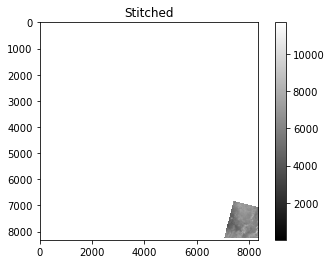

TILES FOR 20210202
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210202_2235.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210202_1060.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210202_1014.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210202_2441.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210202_241c.tif']


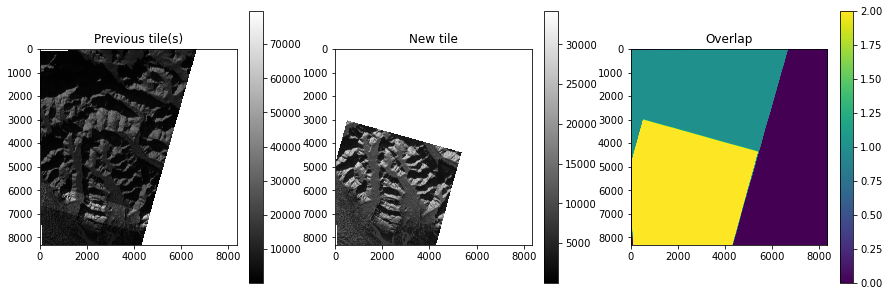

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 1530.7496593827946
New mean diff: 38.27388897624812
Larger tile mean value: 9764.80309781956
Normalized mean value for smaller tile: 0.0




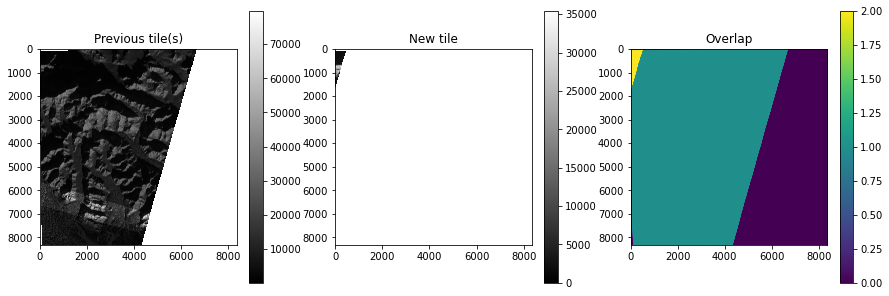

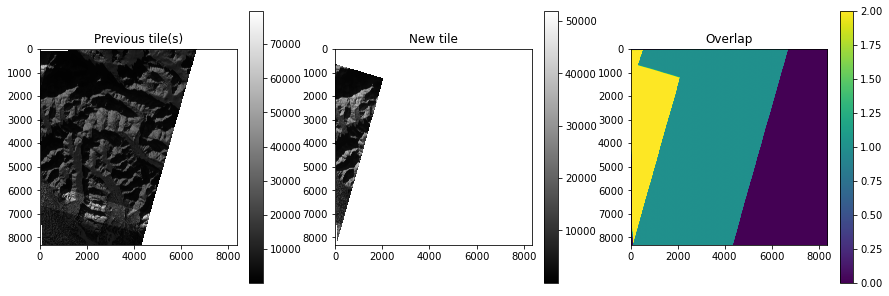

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 212.73872652964366
New mean diff: 0.0
Larger tile mean value: 9834.7669776439
Normalized mean value for smaller tile: 253.150290173445




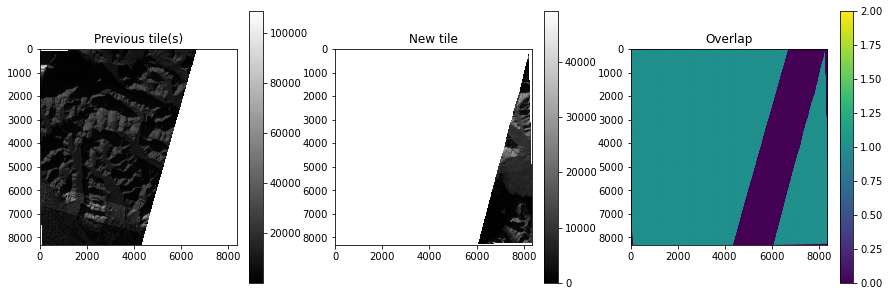

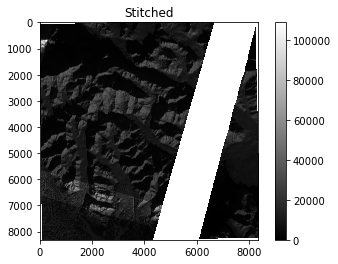

TILES FOR 20210203
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210203_1064.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210203_2408.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210203_2405.tif']


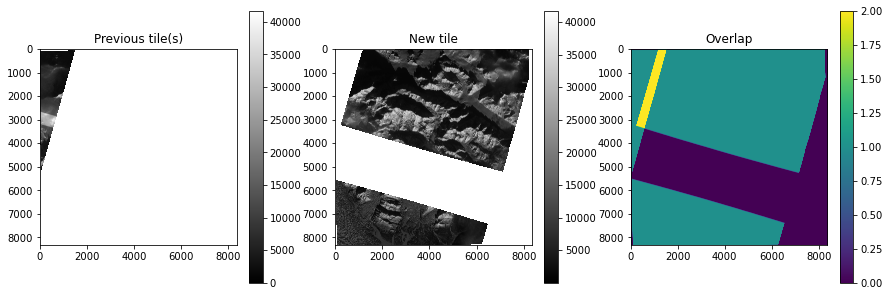

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 2562.1108822333595
New mean diff: 0.0
Larger tile mean value: 8267.139130263917
Normalized mean value for smaller tile: 10879.021756099444




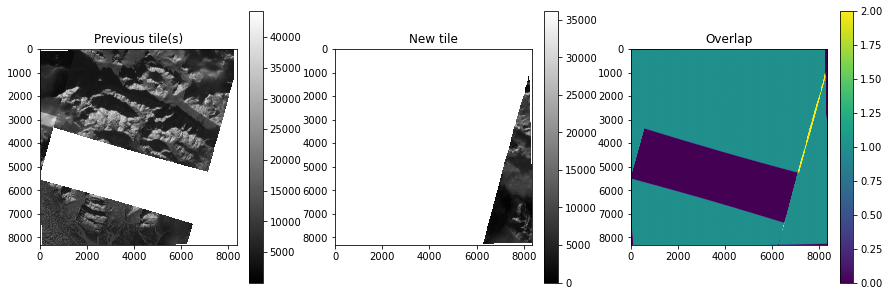

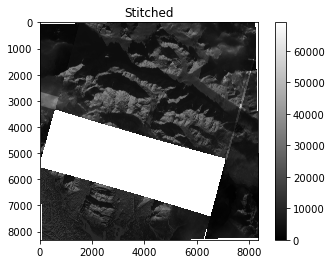

TILES FOR 20210204
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210204_1059.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210204_105c.tif']


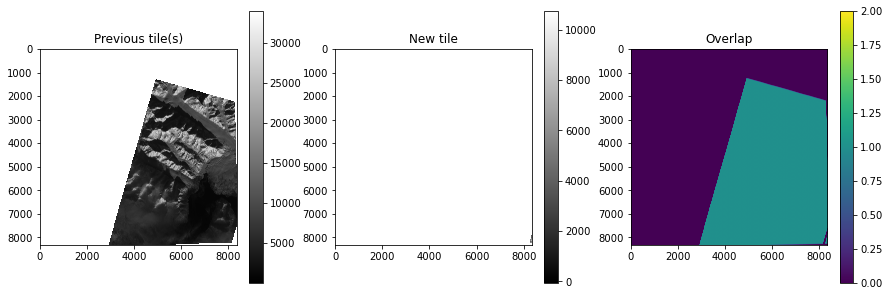

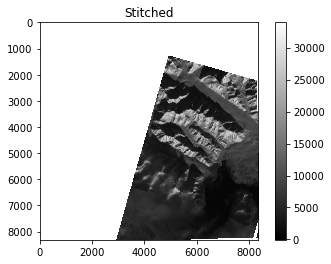

TILES FOR 20210205
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210205_105c.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210205_1040.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210205_2412.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210205_105d.tif']


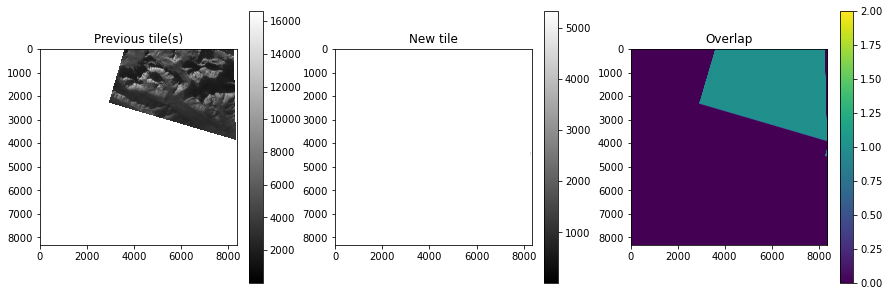

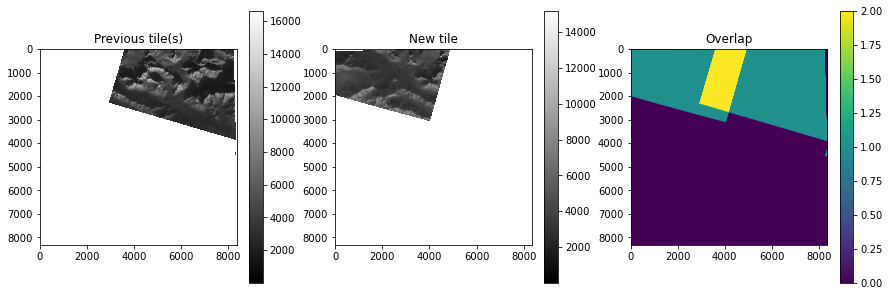

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -33.22235540274132
New mean diff: -19.01817977203284
Larger tile mean value: 3900.6837702667
Normalized mean value for smaller tile: 2791.928027149116




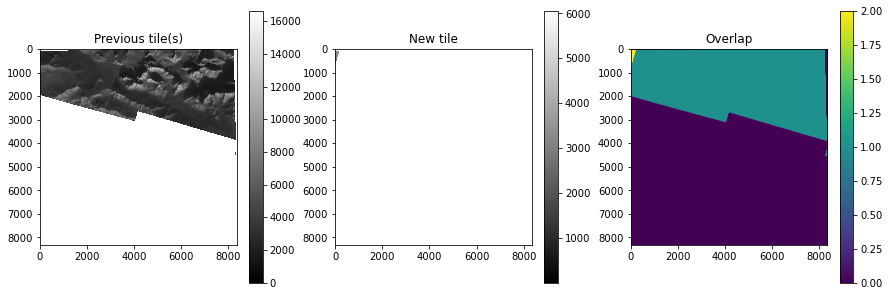

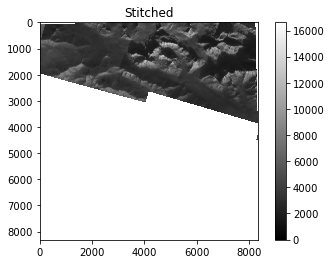

TILES FOR 20210206
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210206_240a.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210206_2402.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210206_1057.tif']


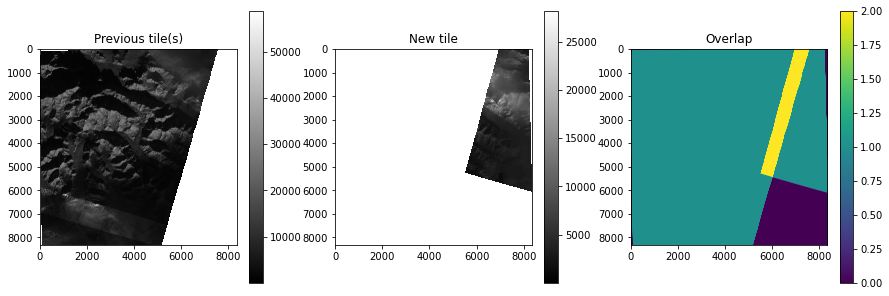

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 588.6214177477789
New mean diff: 2.477154180585103
Larger tile mean value: 7210.644472577158
Normalized mean value for smaller tile: 3602.6735365262507




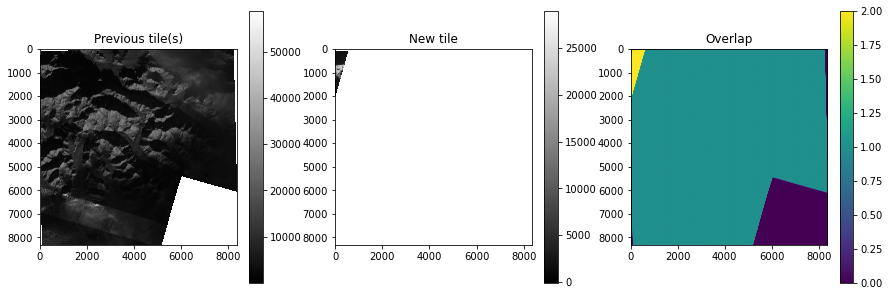

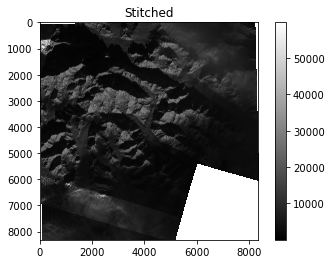

TILES FOR 20210207
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210207_101f.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210207_1066.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210207_0e0f.tif']


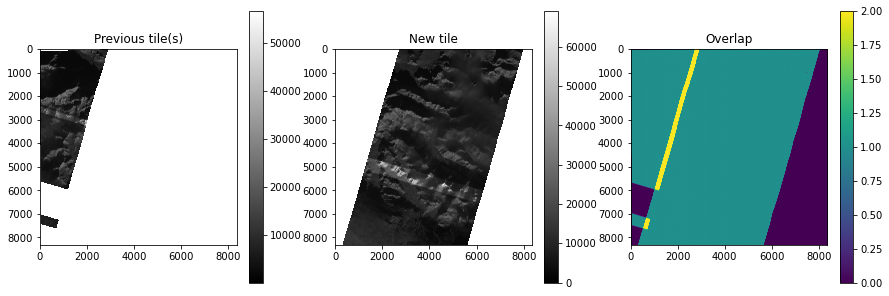

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -2251.7645057423433
New mean diff: -10.936737962257476
Larger tile mean value: 7302.101001813062
Normalized mean value for smaller tile: 9641.082602984307




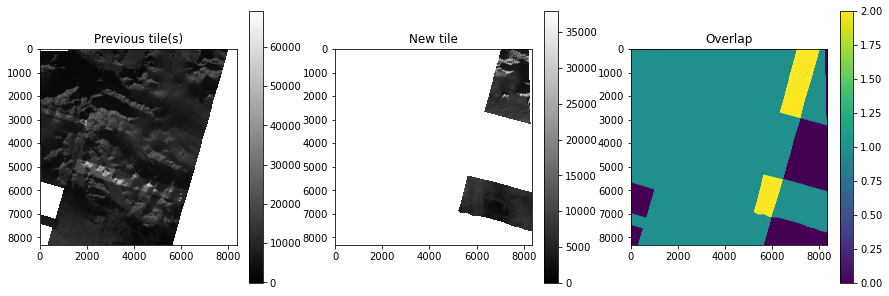

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 946.2357472872163
New mean diff: 113.4273689626677
Larger tile mean value: 9354.230234534989
Normalized mean value for smaller tile: 3455.686529432319




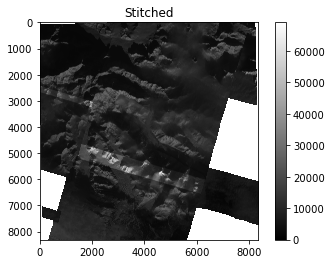

TILES FOR 20210208
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210208_225b.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210208_2441.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210208_105a.tif']


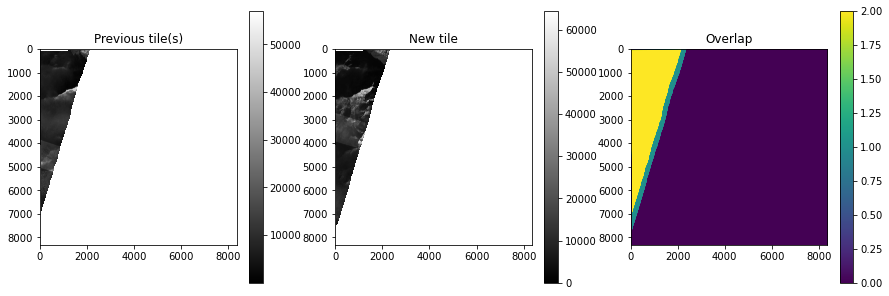

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -200.8875773906355
New mean diff: 0.0
Larger tile mean value: 8553.993922982752
Normalized mean value for smaller tile: 1700.493253094134




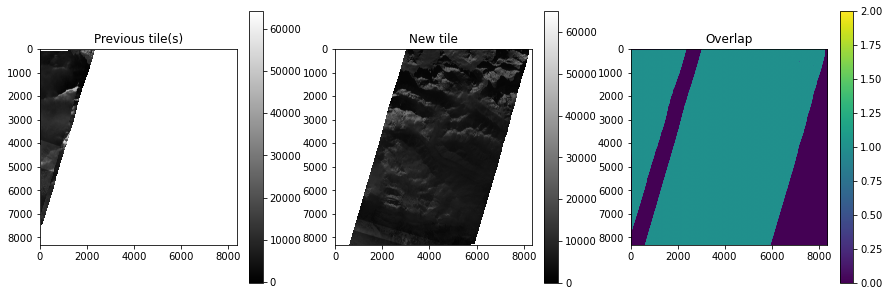

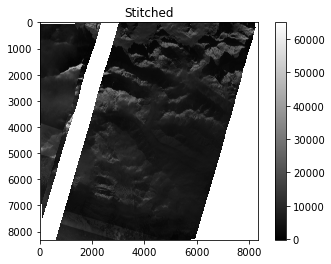

TILES FOR 20210209
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210209_1058.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210209_240f.tif']


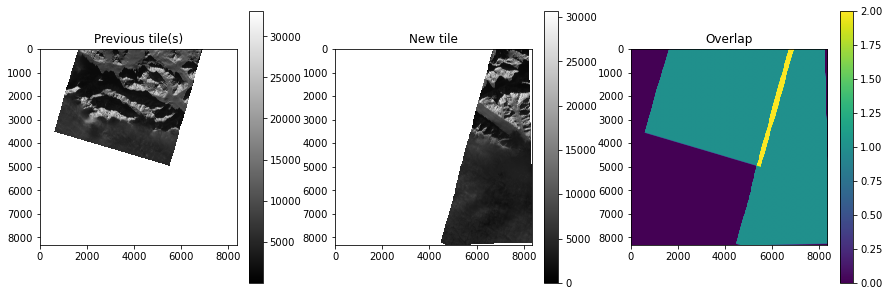

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 690.3802036964188
New mean diff: 1.025086530321692
Larger tile mean value: 7378.827108924433
Normalized mean value for smaller tile: 5212.797309856971




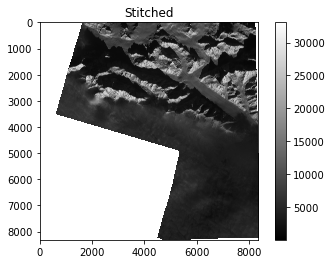

TILES FOR 20210210
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210210_2406.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210210_227a.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210210_0f17.tif']


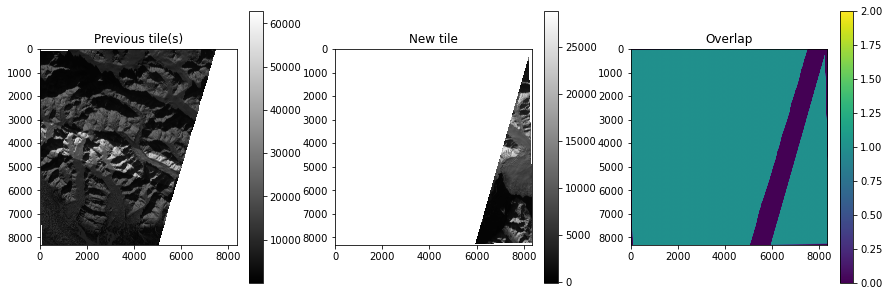

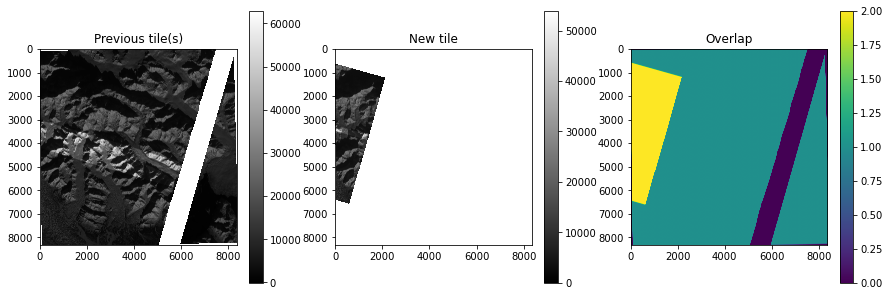

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 1232.1526790305759
New mean diff: 0.0
Larger tile mean value: 9322.74988433356
Normalized mean value for smaller tile: 0.002607733511899195




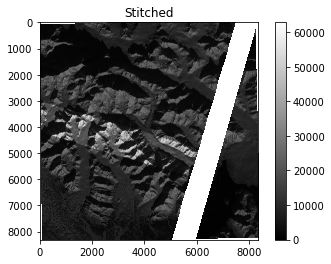

TILES FOR 20210211
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210211_2307.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210211_1003.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210211_101f.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210211_2424.tif']


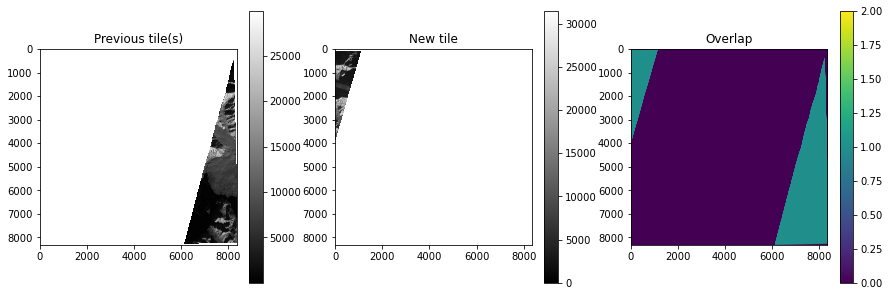

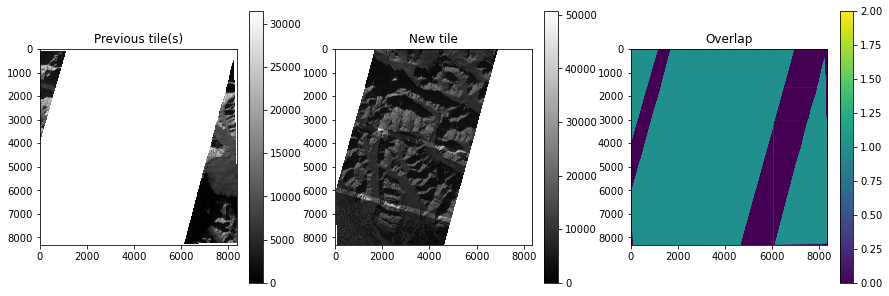

Current tile is larger.
Mean difference in values from the larger tile in overlap area: 2371.9334595073974
New mean diff: 0.0
Larger tile mean value: 8566.235074122798
Normalized mean value for smaller tile: 8474.816218059686




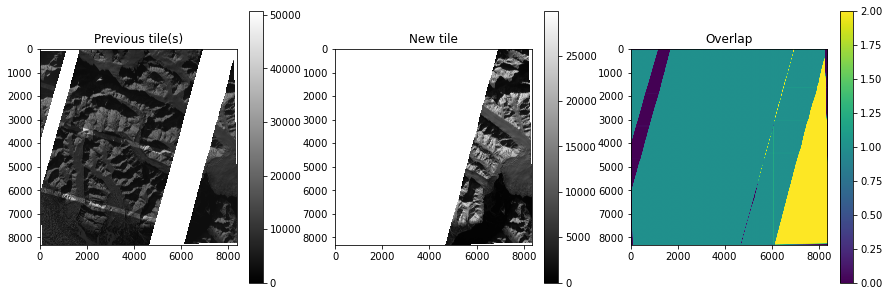

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 2254.750516677515
New mean diff: 1.4112274096629829
Larger tile mean value: 8548.544535260495
Normalized mean value for smaller tile: 4432.28055154449




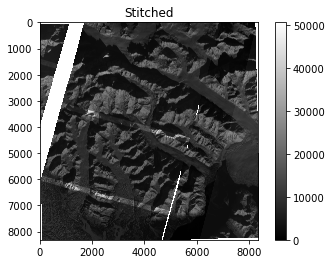

TILES FOR 20210212
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210212_241c.tif']


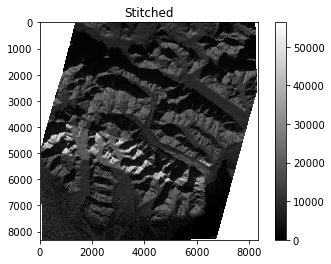

TILES FOR 20210213
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210213_106a.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210213_240a.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210213_1035.tif']


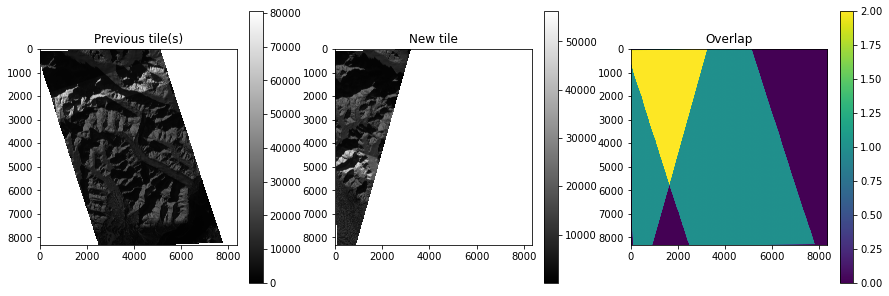

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 1755.539518301219
New mean diff: 381.3019940814802
Larger tile mean value: 9537.33954983909
Normalized mean value for smaller tile: 4496.689587762702




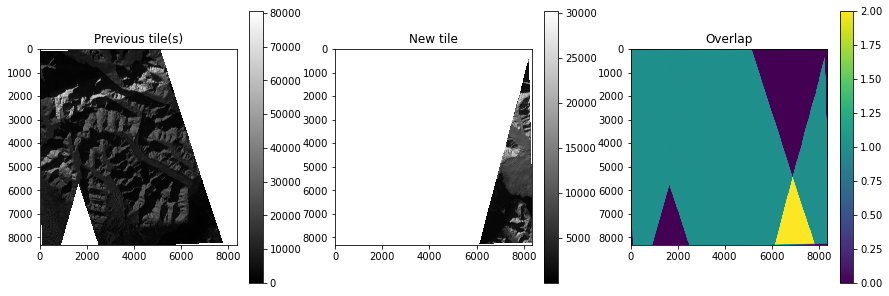

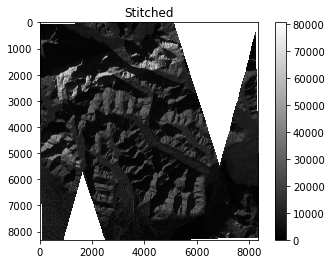

TILES FOR 20210214
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210214_2426.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210214_1032.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210214_1026.tif']


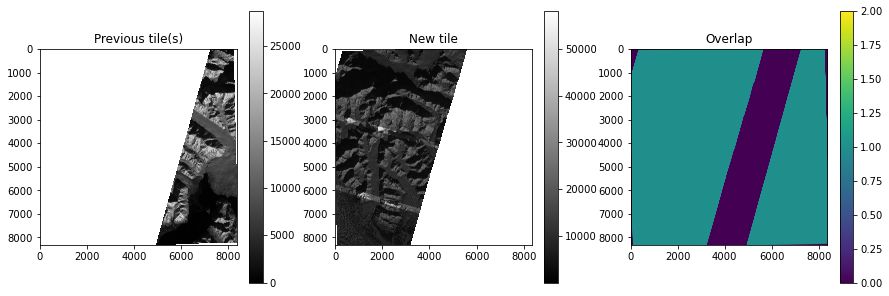

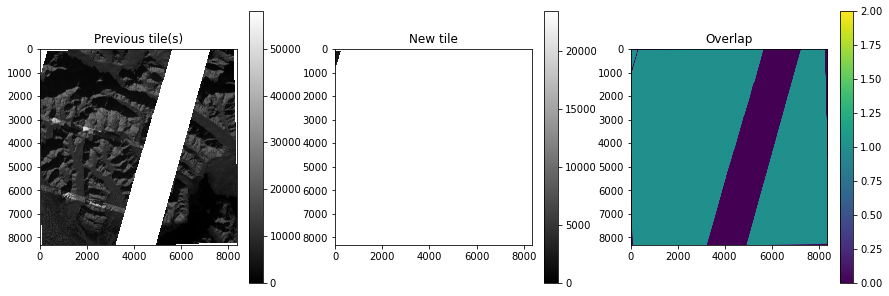

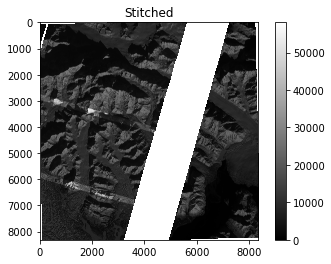

TILES FOR 20210215
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210215_1063.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210215_2441.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210215_100c.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210215_2414.tif']


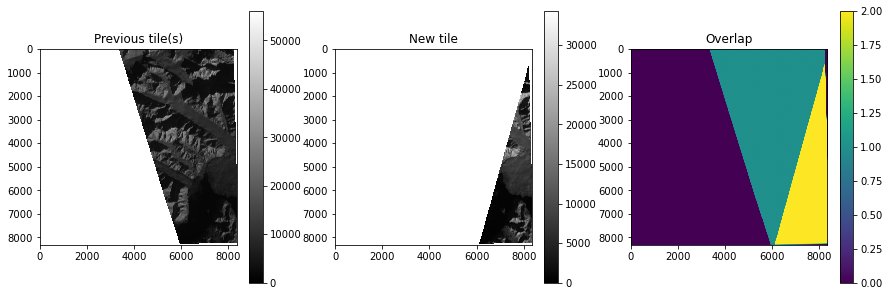

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 223.1094415328961
New mean diff: 0.30013219089758525
Larger tile mean value: 8484.299402175315
Normalized mean value for smaller tile: 0.0004915837063011289




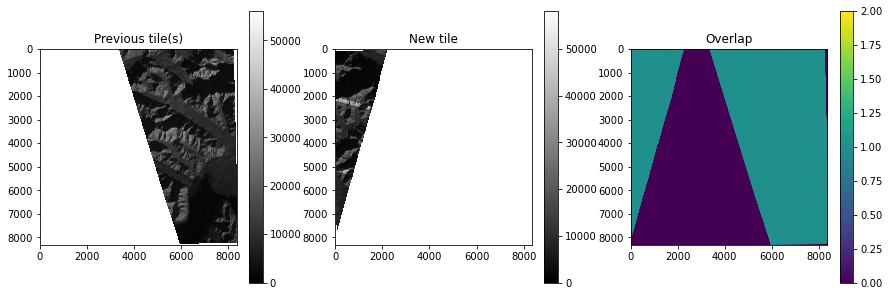

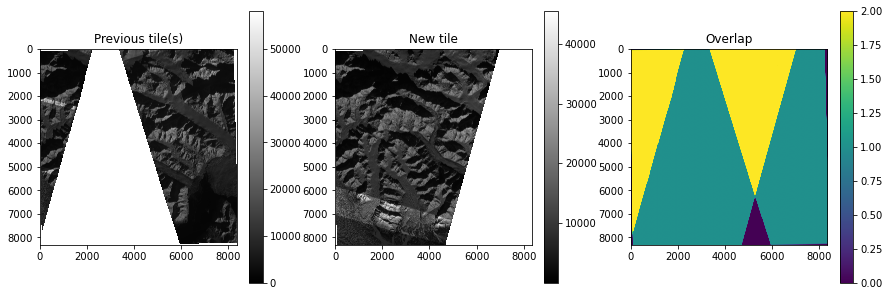

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -985.4867651714687
New mean diff: 9.21594514284823
Larger tile mean value: 8525.060899729206
Normalized mean value for smaller tile: 3738.660153977214




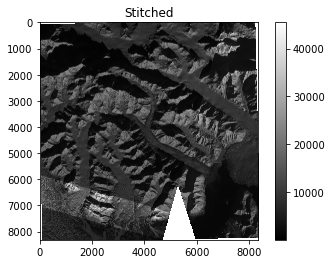

TILES FOR 20210216
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210216_2276.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210216_1034.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210216_240c.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210216_106e.tif']


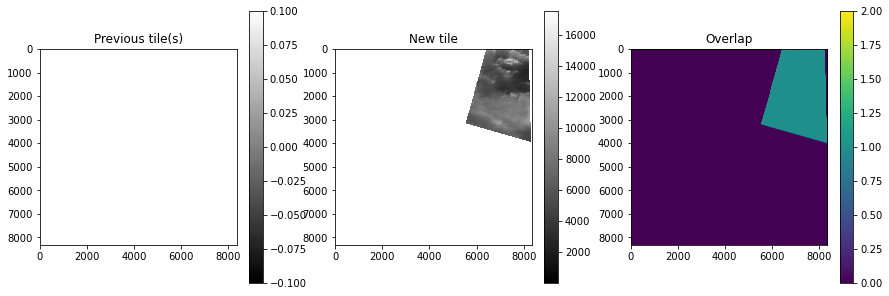

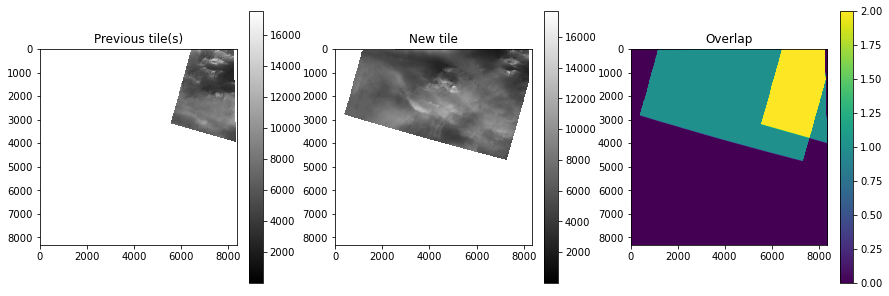

Current tile is larger.
Mean difference in values from the larger tile in overlap area: -138.02818636318588
New mean diff: 0.0
Larger tile mean value: 6687.3913122242175
Normalized mean value for smaller tile: 847.7567585949231




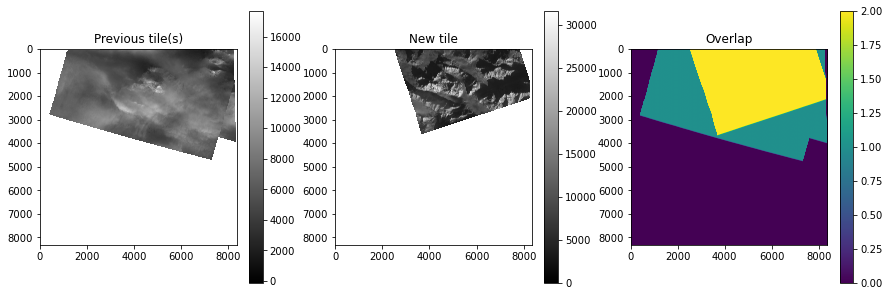

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: -2044.6031693865407
New mean diff: -126.68844989045603
Larger tile mean value: 6707.703324540912
Normalized mean value for smaller tile: -6.0831977751806976e-05




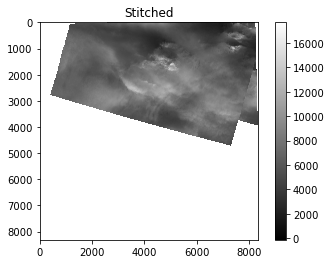

TILES FOR 20210218
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210218_1061.tif']


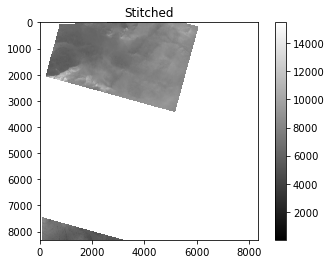

TILES FOR 20210221
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210221_227a.tif']


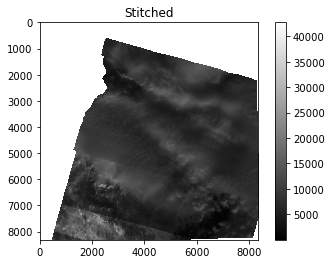

TILES FOR 20210222
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210222_2419.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210222_1010.tif']


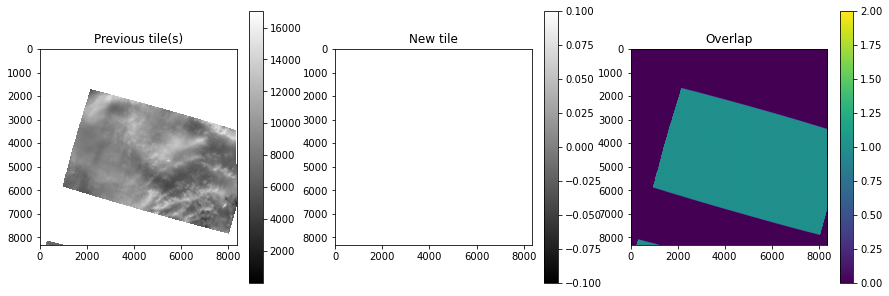

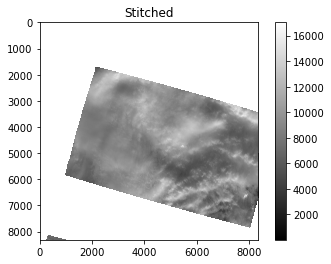

TILES FOR 20210223
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210223_2262.tif', '/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210223_2408.tif']


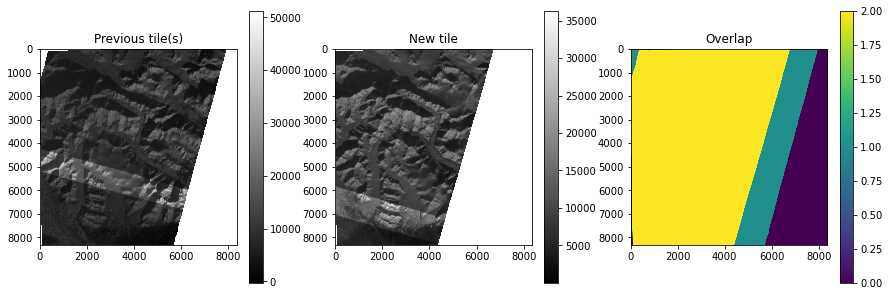

Previous tile is larger.
Mean difference in values from the larger tile in overlap area: 492.7408986168848
New mean diff: 130.6783399478393
Larger tile mean value: 9580.437101869207
Normalized mean value for smaller tile: 38.24929835286436




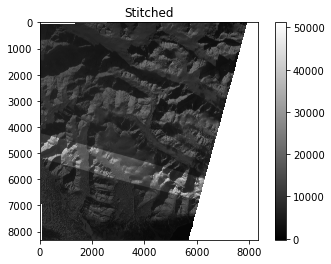

TILES FOR 20210224
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210224_1066.tif']


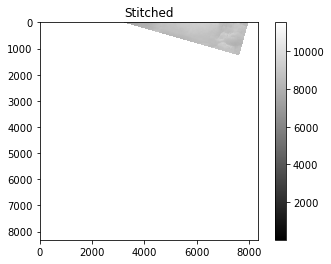

TILES FOR 20210226
['/Volumes/SGlacier/Turner20_21/02_21/out/stitched_by_sat/PS_20210226_0f22.tif']


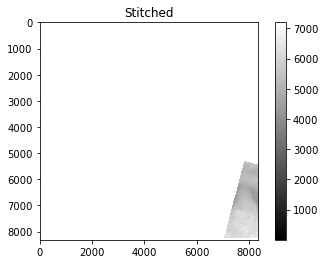

<IPython.core.display.Javascript object>

In [38]:
%%notify -m "Stitch sat chunks finished."

for date in unique_dates:  
    print('TILES FOR', date)
    tiles = glob.glob(basepath+'stitched_by_sat/PS_'+date+'*.tif') # grab all file paths for that date
    print(tiles)
    
    # initialize empty arrays
    overlap_total = np.zeros(reftile.shape);
    sr_stitched = np.zeros(reftile.shape) # start with empty stitched product
    t = 0 # tile count
    
    for tile in tiles:
        reader = rio.open(tile); sr = reader.read(1) # load the tile
        sr[sr == 0] = np.NaN # remove black background, replace with Nans
        sr_data = sr.copy() # make a copy of the data before making the data binary
        sr[sr>0.0] = 1 ; sr[np.isnan(sr)] = 0 # make tile binary
        
        tilesize = np.count_nonzero(sr) # grab the current tile size (pixels)
        overlap_total = overlap_total+sr # add new overlap to overlap total
        
        if t == 0: # for the first tile
            sr_stitched = sr_stitched+sr_data # add the data to sr_stitched
            overlap_area = 0 # no overlap area for the first tile
        
        else: # for all subsequent tiles, do iterative normalization based on overlapping area, if any
            overlap_area = np.count_nonzero(overlap_total[overlap_total >= 2]) # update total overlap area
            
            # Plot the tile comparison and overlap
            fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(15,5))
            im1 = ax1.imshow(sr_stitched,cmap='gray'); ax1.set_title('Previous tile(s)'); fig.colorbar(im1,ax=ax1)
            im2 = ax2.imshow(sr_data,cmap='gray'); ax2.set_title('New tile'); fig.colorbar(im2, ax=ax2)
            im3 = ax3.imshow(overlap_total,vmin=0,vmax=2); ax3.set_title('Overlap'); fig.colorbar(im3,ax=ax3)
            plt.show()
            
            # if the total overlap area has increased (i.e., new overlap)
            if overlap_area > prev_overlap: # increase in overlapping area indicates we have 2 overlapping tiles!!!
                overlap_band = ma.masked_not_equal(overlap_total, 2) # identify non-overlapping area (not 2)
                overlap_band_mask = ma.getmaskarray(overlap_band) # grab the mask for the overlapping area
                
                # identify which tile is larger
                if tilesize > prev_tilesize:
                    print('Current tile is larger.')
                    larger_tile = sr_data; smaller_tile = sr_stitched # assign the tiles
                elif tilesize < prev_tilesize:
                    print('Previous tile is larger.')
                    larger_tile = sr_stitched; smaller_tile = sr_data # assign the tiles
                else: # equal sizes
                    print('Tiles are the same size.')
                    larger_tile = sr_data; smaller_tile = sr_stitched # use current tile to coregister
                
                # grab mean pixel difference from overlapping area (ON GLACIER)
                overlap_values_l = ma.masked_where(overlap_band_mask, larger_tile)
                overlap_values_larger = ~overlap_values_l.mask*overlap_values_l.data
                overlap_values_s = ma.masked_where(overlap_band_mask, smaller_tile)
                overlap_values_smaller = ~overlap_values_s.mask*overlap_values_s.data
                mean_diff = np.nanmean(np.subtract(overlap_values_larger,overlap_values_smaller)) # mean diff
                print('Mean difference in values from the larger tile in overlap area:',mean_diff)
                
                # mean difference in overlapping area over glacier
                overlap_glacier_l = ma.masked_where(glacier_ice_mask, overlap_values_larger)
                overlap_glacier_larger = overlap_glacier_l.mask*overlap_glacier_l.data
                overlap_glacier_s = ma.masked_where(glacier_ice_mask, overlap_values_smaller)
                overlap_glacier_smaller = overlap_glacier_s.mask*overlap_glacier_s.data
                mean_diff2 = np.nanmean(np.subtract(overlap_glacier_larger,overlap_glacier_smaller))
                print('New mean diff:', mean_diff2)
                
                if mean_diff2 != 0: # if there is glacier overlap, only shift with glacier difference
                    
                    # normalize the smaller tile's values to the larger reference tile's overlap values
                    smaller_tile_coreg = smaller_tile + mean_diff2 # add the mean difference to all values
                    smaller_tile_coreg = ma.masked_where(~overlap_band_mask, smaller_tile_coreg) 

                    # remove overlap area from smaller tile:
                    masked_smaller_tile_coreg = ~smaller_tile_coreg.mask*smaller_tile_coreg.data
                    
#                     # SHOW THE OVERLAPPING AREA:
#                     plt.imshow(overlap_glacier_smaller); plt.colorbar(); plt.show()
                    
                else: # If not, shift with overlapping difference
                    smaller_tile_coreg = smaller_tile + mean_diff # add the mean difference to all values
                    smaller_tile_coreg = ma.masked_where(~overlap_band_mask, smaller_tile_coreg) 

                    # remove overlap area from smaller tile:
                    masked_smaller_tile_coreg = ~smaller_tile_coreg.mask*smaller_tile_coreg.data
    
                print('Larger tile mean value:',np.nanmean(larger_tile))
                print('Normalized mean value for smaller tile:',np.nanmean(masked_smaller_tile_coreg))
                print(); print();
                  
                # add them to the stitched produdct
                sr_stitched = np.nansum([masked_smaller_tile_coreg, larger_tile],0) 
                overlap_total[overlap_total > 0] = 1 # refresh overlap total
            else: # if no overlap, just add them without doing anything
                sr_stitched = np.nansum([sr_data, sr_stitched],0) # add them to the stitched product

        # Store tile info for the next round of comparison
        prev_overlap = overlap_area # amount of pixels overlapping
        prev_tilesize = np.count_nonzero(sr_stitched) # previous tile size (pixels w/ data)
        sr_prev = sr_data
        sr_stitched[sr_stitched == 0]=np.NaN # fill black pixels with NaNs
        t += 1 # increment tile count
        
    # Plot final stitched image
    fig = plt.figure(); im = plt.imshow(sr_stitched, cmap='gray'); plt.title('Stitched'); 
    fig.colorbar(im); plt.show()

    # Export stitched image
    outfilename = 'PS_'+date+'.tif'
    if not os.path.exists(basepath+"stitched_images/"):
        os.mkdir(basepath+"stitched_images/")
    with rio.open(basepath+"stitched_images/"+outfilename,'w',
                        driver='GTiff',
                        height=sr_stitched.shape[0], # new shape
                        width=sr_stitched.shape[1], # new shape
                        dtype=sr_stitched.dtype, # data type
                        count=1,
                        crs=reftile.crs, # the EPSG from the original DEM
                        transform=reftile.transform) as dst:
            dst.write(sr_stitched, 1)
    #break
    del overlap_total; del sr_stitched # clear variables
    

# Remove those images that cover less than 50% of the glacier and crop images to the bounding box

In [39]:
# Read glacier shapefile
with fiona.open('/Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp', "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

In [40]:
stitchedpath = basepath+'stitched_images/' # path to the stitched images
boxpath = '/Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp' # path to bounding box shapefile

# multiply each image by glacier mask
for file in os.listdir(stitchedpath):
    if file.startswith('PS') and not file.endswith('clipped.tif'):
        print(file)
        
        # read image file and crop to glacier outline
        with rio.open(stitchedpath+file) as src:
            out_image, out_transform = mask(src, shapes, crop=True)

        # calculate number of non-empty pixels over the glacier
        total_pixels = np.count_nonzero(out_image[0])
        out_image[np.isnan(out_image)] = 0 # set all Nans to 0
        pixels_w_data = np.count_nonzero(out_image) # count non nans (number of pixels with data)
        
        # print data percent
        data_percent = int(pixels_w_data/total_pixels*100)
        print(data_percent, '%')
        
        # remove if it does exist:
        if file[:-4]+'_clipped.tif' in os.listdir(stitchedpath):
            os.remove(stitchedpath+file[:-4]+'_clipped.tif')
            
        # if data percent > 50, and clipped version doesn't already exist:
        if data_percent >= 50: #and not file[:-4]+'_clipped.tif' in os.listdir(stitchedpath):
            # Crop file
            crop_cmd = 'gdalwarp -cutline '+boxpath+' -crop_to_cutline '
            crop_cmd += stitchedpath+file+' '+stitchedpath+file[:-4]+'_clipped.tif'
            print(crop_cmd); print()

            subprocess.run(crop_cmd,shell=True,check=True); print()
        else:
            print('Uncomment line 33 to remove', file)
            
#             # remove the file
#             
            
    

PS_20210213.tif
98 %
gdalwarp -cutline /Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp -crop_to_cutline /Volumes/SGlacier/Turner20_21/02_21/out/stitched_images/PS_20210213.tif /Volumes/SGlacier/Turner20_21/02_21/out/stitched_images/PS_20210213_clipped.tif

Creating output file that is 8357P x 8315L.
Processing /Volumes/SGlacier/Turner20_21/02_21/out/stitched_images/PS_20210213.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.

PS_20210207.tif
92 %
gdalwarp -cutline /Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp -crop_to_cutline /Volumes/SGlacier/Turner20_21/02_21/out/stitched_images/PS_20210207.tif /Volumes/SGlacier/Turner20_21/02_21/out/stitched_images/PS_20210207_clipped.tif

Creating output file that is 8357P x 8315L.
Processing /Volumes/SGlacier/Turner20_21/02_21/out/stitched_images/PS_20210207.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.

PS_20210206.tif
88 %
gdalwarp -cutline /Volumes/SGlacier/BoxTurner/BoxTurner_UTM_07.shp -c

# Move all good clipped images into new folder (temporary)

In [29]:
# for file in os.listdir('/Volumes/SGlacier/TG_20_21/'):
#     print(file.split('_')[1][2:3]) # year
#     print(file.split('_')[1][4:5]) # mo
    
#     searchpath = '/Volumes/SGlacier/Turner20_21/'+mo+'_'+yy+'/'
    
#     # if found, move into the folder
#     for searchfile in os.listdir(searchpath):
#         if searchfile == file:
#             shutil.copy(searchpath+searchfile, '/Volumes/SGlacier/TG_20_21/'+searchfile)